# Face Generation

In this project, you'll define and train a DCGAN on a dataset of faces. Your goal is to get a generator network to generate *new* images of faces that look as realistic as possible!

The project will be broken down into a series of tasks from **loading in data to defining and training adversarial networks**. At the end of the notebook, you'll be able to visualize the results of your trained Generator to see how it performs; your generated samples should look like fairly realistic faces with small amounts of noise.

### Get the Data

You'll be using the [CelebFaces Attributes Dataset (CelebA)](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) to train your adversarial networks.

This dataset is more complex than the number datasets (like MNIST or SVHN) you've been working with, and so, you should prepare to define deeper networks and train them for a longer time to get good results. It is suggested that you utilize a GPU for training.

### Pre-processed Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. Some sample data is show below.

<img src='assets/processed_face_data.png' width=60% />

> If you are working locally, you can download this data [by clicking here](https://s3.amazonaws.com/video.udacity-data.com/topher/2018/November/5be7eb6f_processed-celeba-small/processed-celeba-small.zip)

This is a zip file that you'll need to extract in the home directory of this notebook for further loading and processing. After extracting the data, you should be left with a directory of data `processed_celeba_small/`

In [1]:
# can comment out after executing
# !unzip processed_celeba_small.zip

Archive:  processed_celeba_small.zip
   creating: processed_celeba_small/
  inflating: processed_celeba_small/.DS_Store  
   creating: __MACOSX/
   creating: __MACOSX/processed_celeba_small/
  inflating: __MACOSX/processed_celeba_small/._.DS_Store  
   creating: processed_celeba_small/celeba/
  inflating: processed_celeba_small/celeba/.DS_Store  
   creating: __MACOSX/processed_celeba_small/celeba/
  inflating: __MACOSX/processed_celeba_small/celeba/._.DS_Store  
  inflating: processed_celeba_small/celeba/161979.jpg  
  inflating: processed_celeba_small/celeba/161980.jpg  
  inflating: processed_celeba_small/celeba/161981.jpg  
  inflating: processed_celeba_small/celeba/161982.jpg  
  inflating: processed_celeba_small/celeba/161983.jpg  
  inflating: processed_celeba_small/celeba/161984.jpg  
  inflating: processed_celeba_small/celeba/161985.jpg  
  inflating: processed_celeba_small/celeba/161986.jpg  
  inflating: processed_celeba_small/celeba/161987.jpg  
  inflating: processed_celeb

  inflating: processed_celeba_small/celeba/162282.jpg  
  inflating: processed_celeba_small/celeba/162283.jpg  
  inflating: processed_celeba_small/celeba/162284.jpg  
  inflating: processed_celeba_small/celeba/162285.jpg  
  inflating: processed_celeba_small/celeba/162286.jpg  
  inflating: processed_celeba_small/celeba/162287.jpg  
  inflating: processed_celeba_small/celeba/162288.jpg  
  inflating: processed_celeba_small/celeba/162289.jpg  
  inflating: processed_celeba_small/celeba/162290.jpg  
  inflating: processed_celeba_small/celeba/162291.jpg  
  inflating: processed_celeba_small/celeba/162292.jpg  
  inflating: processed_celeba_small/celeba/162293.jpg  
  inflating: processed_celeba_small/celeba/162294.jpg  
  inflating: processed_celeba_small/celeba/162295.jpg  
  inflating: processed_celeba_small/celeba/162296.jpg  
  inflating: processed_celeba_small/celeba/162297.jpg  
  inflating: processed_celeba_small/celeba/162298.jpg  
  inflating: processed_celeba_small/celeba/16229

  inflating: processed_celeba_small/celeba/162678.jpg  
  inflating: processed_celeba_small/celeba/162679.jpg  
  inflating: processed_celeba_small/celeba/162680.jpg  
  inflating: processed_celeba_small/celeba/162681.jpg  
  inflating: processed_celeba_small/celeba/162682.jpg  
  inflating: processed_celeba_small/celeba/162683.jpg  
  inflating: processed_celeba_small/celeba/162684.jpg  
  inflating: processed_celeba_small/celeba/162685.jpg  
  inflating: processed_celeba_small/celeba/162686.jpg  
  inflating: processed_celeba_small/celeba/162687.jpg  
  inflating: processed_celeba_small/celeba/162688.jpg  
  inflating: processed_celeba_small/celeba/162689.jpg  
  inflating: processed_celeba_small/celeba/162690.jpg  
  inflating: processed_celeba_small/celeba/162691.jpg  
  inflating: processed_celeba_small/celeba/162692.jpg  
  inflating: processed_celeba_small/celeba/162693.jpg  
  inflating: processed_celeba_small/celeba/162694.jpg  
  inflating: processed_celeba_small/celeba/16269

  inflating: processed_celeba_small/celeba/163085.jpg  
  inflating: processed_celeba_small/celeba/163086.jpg  
  inflating: processed_celeba_small/celeba/163087.jpg  
  inflating: processed_celeba_small/celeba/163088.jpg  
  inflating: processed_celeba_small/celeba/163089.jpg  
  inflating: processed_celeba_small/celeba/163090.jpg  
  inflating: processed_celeba_small/celeba/163091.jpg  
  inflating: processed_celeba_small/celeba/163092.jpg  
  inflating: processed_celeba_small/celeba/163093.jpg  
  inflating: processed_celeba_small/celeba/163094.jpg  
  inflating: processed_celeba_small/celeba/163095.jpg  
  inflating: processed_celeba_small/celeba/163096.jpg  
  inflating: processed_celeba_small/celeba/163097.jpg  
  inflating: processed_celeba_small/celeba/163098.jpg  
  inflating: processed_celeba_small/celeba/163099.jpg  
  inflating: processed_celeba_small/celeba/163100.jpg  
  inflating: processed_celeba_small/celeba/163101.jpg  
  inflating: processed_celeba_small/celeba/16310

  inflating: processed_celeba_small/celeba/163462.jpg  
  inflating: processed_celeba_small/celeba/163463.jpg  
  inflating: processed_celeba_small/celeba/163464.jpg  
  inflating: processed_celeba_small/celeba/163465.jpg  
  inflating: processed_celeba_small/celeba/163466.jpg  
  inflating: processed_celeba_small/celeba/163467.jpg  
  inflating: processed_celeba_small/celeba/163468.jpg  
  inflating: processed_celeba_small/celeba/163469.jpg  
  inflating: processed_celeba_small/celeba/163470.jpg  
  inflating: processed_celeba_small/celeba/163471.jpg  
  inflating: processed_celeba_small/celeba/163472.jpg  
  inflating: processed_celeba_small/celeba/163473.jpg  
  inflating: processed_celeba_small/celeba/163474.jpg  
  inflating: processed_celeba_small/celeba/163475.jpg  
  inflating: processed_celeba_small/celeba/163476.jpg  
  inflating: processed_celeba_small/celeba/163477.jpg  
  inflating: processed_celeba_small/celeba/163478.jpg  
  inflating: processed_celeba_small/celeba/16347

  inflating: processed_celeba_small/celeba/163840.jpg  
  inflating: processed_celeba_small/celeba/163841.jpg  
  inflating: processed_celeba_small/celeba/163842.jpg  
  inflating: processed_celeba_small/celeba/163843.jpg  
  inflating: processed_celeba_small/celeba/163844.jpg  
  inflating: processed_celeba_small/celeba/163845.jpg  
  inflating: processed_celeba_small/celeba/163846.jpg  
  inflating: processed_celeba_small/celeba/163847.jpg  
  inflating: processed_celeba_small/celeba/163848.jpg  
  inflating: processed_celeba_small/celeba/163849.jpg  
  inflating: processed_celeba_small/celeba/163850.jpg  
  inflating: processed_celeba_small/celeba/163851.jpg  
  inflating: processed_celeba_small/celeba/163852.jpg  
  inflating: processed_celeba_small/celeba/163853.jpg  
  inflating: processed_celeba_small/celeba/163854.jpg  
  inflating: processed_celeba_small/celeba/163855.jpg  
  inflating: processed_celeba_small/celeba/163856.jpg  
  inflating: processed_celeba_small/celeba/16385

  inflating: processed_celeba_small/celeba/164217.jpg  
  inflating: processed_celeba_small/celeba/164218.jpg  
  inflating: processed_celeba_small/celeba/164219.jpg  
  inflating: processed_celeba_small/celeba/164220.jpg  
  inflating: processed_celeba_small/celeba/164221.jpg  
  inflating: processed_celeba_small/celeba/164222.jpg  
  inflating: processed_celeba_small/celeba/164223.jpg  
  inflating: processed_celeba_small/celeba/164224.jpg  
  inflating: processed_celeba_small/celeba/164225.jpg  
  inflating: processed_celeba_small/celeba/164226.jpg  
  inflating: processed_celeba_small/celeba/164227.jpg  
  inflating: processed_celeba_small/celeba/164228.jpg  
  inflating: processed_celeba_small/celeba/164229.jpg  
  inflating: processed_celeba_small/celeba/164230.jpg  
  inflating: processed_celeba_small/celeba/164231.jpg  
  inflating: processed_celeba_small/celeba/164232.jpg  
  inflating: processed_celeba_small/celeba/164233.jpg  
  inflating: processed_celeba_small/celeba/16423

  inflating: processed_celeba_small/celeba/164596.jpg  
  inflating: processed_celeba_small/celeba/164597.jpg  
  inflating: processed_celeba_small/celeba/164598.jpg  
  inflating: processed_celeba_small/celeba/164599.jpg  
  inflating: processed_celeba_small/celeba/164600.jpg  
  inflating: processed_celeba_small/celeba/164601.jpg  
  inflating: processed_celeba_small/celeba/164602.jpg  
  inflating: processed_celeba_small/celeba/164603.jpg  
  inflating: processed_celeba_small/celeba/164604.jpg  
  inflating: processed_celeba_small/celeba/164605.jpg  
  inflating: processed_celeba_small/celeba/164606.jpg  
  inflating: processed_celeba_small/celeba/164607.jpg  
  inflating: processed_celeba_small/celeba/164608.jpg  
  inflating: processed_celeba_small/celeba/164609.jpg  
  inflating: processed_celeba_small/celeba/164610.jpg  
  inflating: processed_celeba_small/celeba/164611.jpg  
  inflating: processed_celeba_small/celeba/164612.jpg  
  inflating: processed_celeba_small/celeba/16461

  inflating: processed_celeba_small/celeba/164960.jpg  
  inflating: processed_celeba_small/celeba/164961.jpg  
  inflating: processed_celeba_small/celeba/164962.jpg  
  inflating: processed_celeba_small/celeba/164963.jpg  
  inflating: processed_celeba_small/celeba/164964.jpg  
  inflating: processed_celeba_small/celeba/164965.jpg  
  inflating: processed_celeba_small/celeba/164966.jpg  
  inflating: processed_celeba_small/celeba/164967.jpg  
  inflating: processed_celeba_small/celeba/164968.jpg  
  inflating: processed_celeba_small/celeba/164969.jpg  
  inflating: processed_celeba_small/celeba/164970.jpg  
  inflating: processed_celeba_small/celeba/164971.jpg  
  inflating: processed_celeba_small/celeba/164972.jpg  
  inflating: processed_celeba_small/celeba/164973.jpg  
  inflating: processed_celeba_small/celeba/164974.jpg  
  inflating: processed_celeba_small/celeba/164975.jpg  
  inflating: processed_celeba_small/celeba/164976.jpg  
  inflating: processed_celeba_small/celeba/16497

  inflating: processed_celeba_small/celeba/165320.jpg  
  inflating: processed_celeba_small/celeba/165321.jpg  
  inflating: processed_celeba_small/celeba/165322.jpg  
  inflating: processed_celeba_small/celeba/165323.jpg  
  inflating: processed_celeba_small/celeba/165324.jpg  
  inflating: processed_celeba_small/celeba/165325.jpg  
  inflating: processed_celeba_small/celeba/165326.jpg  
  inflating: processed_celeba_small/celeba/165327.jpg  
  inflating: processed_celeba_small/celeba/165328.jpg  
  inflating: processed_celeba_small/celeba/165329.jpg  
  inflating: processed_celeba_small/celeba/165330.jpg  
  inflating: processed_celeba_small/celeba/165331.jpg  
  inflating: processed_celeba_small/celeba/165332.jpg  
  inflating: processed_celeba_small/celeba/165333.jpg  
  inflating: processed_celeba_small/celeba/165334.jpg  
  inflating: processed_celeba_small/celeba/165335.jpg  
  inflating: processed_celeba_small/celeba/165336.jpg  
  inflating: processed_celeba_small/celeba/16533

  inflating: processed_celeba_small/celeba/165681.jpg  
  inflating: processed_celeba_small/celeba/165682.jpg  
  inflating: processed_celeba_small/celeba/165683.jpg  
  inflating: processed_celeba_small/celeba/165684.jpg  
  inflating: processed_celeba_small/celeba/165685.jpg  
  inflating: processed_celeba_small/celeba/165686.jpg  
  inflating: processed_celeba_small/celeba/165687.jpg  
  inflating: processed_celeba_small/celeba/165688.jpg  
  inflating: processed_celeba_small/celeba/165689.jpg  
  inflating: processed_celeba_small/celeba/165690.jpg  
  inflating: processed_celeba_small/celeba/165691.jpg  
  inflating: processed_celeba_small/celeba/165692.jpg  
  inflating: processed_celeba_small/celeba/165693.jpg  
  inflating: processed_celeba_small/celeba/165694.jpg  
  inflating: processed_celeba_small/celeba/165695.jpg  
  inflating: processed_celeba_small/celeba/165696.jpg  
  inflating: processed_celeba_small/celeba/165697.jpg  
  inflating: processed_celeba_small/celeba/16569

  inflating: processed_celeba_small/celeba/166043.jpg  
  inflating: processed_celeba_small/celeba/166044.jpg  
  inflating: processed_celeba_small/celeba/166045.jpg  
  inflating: processed_celeba_small/celeba/166046.jpg  
  inflating: processed_celeba_small/celeba/166047.jpg  
  inflating: processed_celeba_small/celeba/166048.jpg  
  inflating: processed_celeba_small/celeba/166049.jpg  
  inflating: processed_celeba_small/celeba/166050.jpg  
  inflating: processed_celeba_small/celeba/166051.jpg  
  inflating: processed_celeba_small/celeba/166052.jpg  
  inflating: processed_celeba_small/celeba/166053.jpg  
  inflating: processed_celeba_small/celeba/166054.jpg  
  inflating: processed_celeba_small/celeba/166055.jpg  
  inflating: processed_celeba_small/celeba/166056.jpg  
  inflating: processed_celeba_small/celeba/166057.jpg  
  inflating: processed_celeba_small/celeba/166058.jpg  
  inflating: processed_celeba_small/celeba/166059.jpg  
  inflating: processed_celeba_small/celeba/16606

  inflating: processed_celeba_small/celeba/166398.jpg  
  inflating: processed_celeba_small/celeba/166399.jpg  
  inflating: processed_celeba_small/celeba/166400.jpg  
  inflating: processed_celeba_small/celeba/166401.jpg  
  inflating: processed_celeba_small/celeba/166402.jpg  
  inflating: processed_celeba_small/celeba/166403.jpg  
  inflating: processed_celeba_small/celeba/166404.jpg  
  inflating: processed_celeba_small/celeba/166405.jpg  
  inflating: processed_celeba_small/celeba/166406.jpg  
  inflating: processed_celeba_small/celeba/166407.jpg  
  inflating: processed_celeba_small/celeba/166408.jpg  
  inflating: processed_celeba_small/celeba/166409.jpg  
  inflating: processed_celeba_small/celeba/166410.jpg  
  inflating: processed_celeba_small/celeba/166411.jpg  
  inflating: processed_celeba_small/celeba/166412.jpg  
  inflating: processed_celeba_small/celeba/166413.jpg  
  inflating: processed_celeba_small/celeba/166414.jpg  
  inflating: processed_celeba_small/celeba/16641

  inflating: processed_celeba_small/celeba/166737.jpg  
  inflating: processed_celeba_small/celeba/166738.jpg  
  inflating: processed_celeba_small/celeba/166739.jpg  
  inflating: processed_celeba_small/celeba/166740.jpg  
  inflating: processed_celeba_small/celeba/166741.jpg  
  inflating: processed_celeba_small/celeba/166742.jpg  
  inflating: processed_celeba_small/celeba/166743.jpg  
  inflating: processed_celeba_small/celeba/166744.jpg  
  inflating: processed_celeba_small/celeba/166745.jpg  
  inflating: processed_celeba_small/celeba/166746.jpg  
  inflating: processed_celeba_small/celeba/166747.jpg  
  inflating: processed_celeba_small/celeba/166748.jpg  
  inflating: processed_celeba_small/celeba/166749.jpg  
  inflating: processed_celeba_small/celeba/166750.jpg  
  inflating: processed_celeba_small/celeba/166751.jpg  
  inflating: processed_celeba_small/celeba/166752.jpg  
  inflating: processed_celeba_small/celeba/166753.jpg  
  inflating: processed_celeba_small/celeba/16675

  inflating: processed_celeba_small/celeba/167078.jpg  
  inflating: processed_celeba_small/celeba/167079.jpg  
  inflating: processed_celeba_small/celeba/167080.jpg  
  inflating: processed_celeba_small/celeba/167081.jpg  
  inflating: processed_celeba_small/celeba/167082.jpg  
  inflating: processed_celeba_small/celeba/167083.jpg  
  inflating: processed_celeba_small/celeba/167084.jpg  
  inflating: processed_celeba_small/celeba/167085.jpg  
  inflating: processed_celeba_small/celeba/167086.jpg  
  inflating: processed_celeba_small/celeba/167087.jpg  
  inflating: processed_celeba_small/celeba/167088.jpg  
  inflating: processed_celeba_small/celeba/167089.jpg  
  inflating: processed_celeba_small/celeba/167090.jpg  
  inflating: processed_celeba_small/celeba/167091.jpg  
  inflating: processed_celeba_small/celeba/167092.jpg  
  inflating: processed_celeba_small/celeba/167093.jpg  
  inflating: processed_celeba_small/celeba/167094.jpg  
  inflating: processed_celeba_small/celeba/16709

  inflating: processed_celeba_small/celeba/167416.jpg  
  inflating: processed_celeba_small/celeba/167417.jpg  
  inflating: processed_celeba_small/celeba/167418.jpg  
  inflating: processed_celeba_small/celeba/167419.jpg  
  inflating: processed_celeba_small/celeba/167420.jpg  
  inflating: processed_celeba_small/celeba/167421.jpg  
  inflating: processed_celeba_small/celeba/167422.jpg  
  inflating: processed_celeba_small/celeba/167423.jpg  
  inflating: processed_celeba_small/celeba/167424.jpg  
  inflating: processed_celeba_small/celeba/167425.jpg  
  inflating: processed_celeba_small/celeba/167426.jpg  
  inflating: processed_celeba_small/celeba/167427.jpg  
  inflating: processed_celeba_small/celeba/167428.jpg  
  inflating: processed_celeba_small/celeba/167429.jpg  
  inflating: processed_celeba_small/celeba/167430.jpg  
  inflating: processed_celeba_small/celeba/167431.jpg  
  inflating: processed_celeba_small/celeba/167432.jpg  
  inflating: processed_celeba_small/celeba/16743

  inflating: processed_celeba_small/celeba/167743.jpg  
  inflating: processed_celeba_small/celeba/167744.jpg  
  inflating: processed_celeba_small/celeba/167745.jpg  
  inflating: processed_celeba_small/celeba/167746.jpg  
  inflating: processed_celeba_small/celeba/167747.jpg  
  inflating: processed_celeba_small/celeba/167748.jpg  
  inflating: processed_celeba_small/celeba/167749.jpg  
  inflating: processed_celeba_small/celeba/167750.jpg  
  inflating: processed_celeba_small/celeba/167751.jpg  
  inflating: processed_celeba_small/celeba/167752.jpg  
  inflating: processed_celeba_small/celeba/167753.jpg  
  inflating: processed_celeba_small/celeba/167754.jpg  
  inflating: processed_celeba_small/celeba/167755.jpg  
  inflating: processed_celeba_small/celeba/167756.jpg  
  inflating: processed_celeba_small/celeba/167757.jpg  
  inflating: processed_celeba_small/celeba/167758.jpg  
  inflating: processed_celeba_small/celeba/167759.jpg  
  inflating: processed_celeba_small/celeba/16776

  inflating: processed_celeba_small/celeba/168063.jpg  
  inflating: processed_celeba_small/celeba/168064.jpg  
  inflating: processed_celeba_small/celeba/168065.jpg  
  inflating: processed_celeba_small/celeba/168066.jpg  
  inflating: processed_celeba_small/celeba/168067.jpg  
  inflating: processed_celeba_small/celeba/168068.jpg  
  inflating: processed_celeba_small/celeba/168069.jpg  
  inflating: processed_celeba_small/celeba/168070.jpg  
  inflating: processed_celeba_small/celeba/168071.jpg  
  inflating: processed_celeba_small/celeba/168072.jpg  
  inflating: processed_celeba_small/celeba/168073.jpg  
  inflating: processed_celeba_small/celeba/168074.jpg  
  inflating: processed_celeba_small/celeba/168075.jpg  
  inflating: processed_celeba_small/celeba/168076.jpg  
  inflating: processed_celeba_small/celeba/168077.jpg  
  inflating: processed_celeba_small/celeba/168078.jpg  
  inflating: processed_celeba_small/celeba/168079.jpg  
  inflating: processed_celeba_small/celeba/16808

  inflating: processed_celeba_small/celeba/168379.jpg  
  inflating: processed_celeba_small/celeba/168380.jpg  
  inflating: processed_celeba_small/celeba/168381.jpg  
  inflating: processed_celeba_small/celeba/168382.jpg  
  inflating: processed_celeba_small/celeba/168383.jpg  
  inflating: processed_celeba_small/celeba/168384.jpg  
  inflating: processed_celeba_small/celeba/168385.jpg  
  inflating: processed_celeba_small/celeba/168386.jpg  
  inflating: processed_celeba_small/celeba/168387.jpg  
  inflating: processed_celeba_small/celeba/168388.jpg  
  inflating: processed_celeba_small/celeba/168389.jpg  
  inflating: processed_celeba_small/celeba/168390.jpg  
  inflating: processed_celeba_small/celeba/168391.jpg  
  inflating: processed_celeba_small/celeba/168392.jpg  
  inflating: processed_celeba_small/celeba/168393.jpg  
  inflating: processed_celeba_small/celeba/168394.jpg  
  inflating: processed_celeba_small/celeba/168395.jpg  
  inflating: processed_celeba_small/celeba/16839

  inflating: processed_celeba_small/celeba/168681.jpg  
  inflating: processed_celeba_small/celeba/168682.jpg  
  inflating: processed_celeba_small/celeba/168683.jpg  
  inflating: processed_celeba_small/celeba/168684.jpg  
  inflating: processed_celeba_small/celeba/168685.jpg  
  inflating: processed_celeba_small/celeba/168686.jpg  
  inflating: processed_celeba_small/celeba/168687.jpg  
  inflating: processed_celeba_small/celeba/168688.jpg  
  inflating: processed_celeba_small/celeba/168689.jpg  
  inflating: processed_celeba_small/celeba/168690.jpg  
  inflating: processed_celeba_small/celeba/168691.jpg  
  inflating: processed_celeba_small/celeba/168692.jpg  
  inflating: processed_celeba_small/celeba/168693.jpg  
  inflating: processed_celeba_small/celeba/168694.jpg  
  inflating: processed_celeba_small/celeba/168695.jpg  
  inflating: processed_celeba_small/celeba/168696.jpg  
  inflating: processed_celeba_small/celeba/168697.jpg  
  inflating: processed_celeba_small/celeba/16869

  inflating: processed_celeba_small/celeba/168979.jpg  
  inflating: processed_celeba_small/celeba/168980.jpg  
  inflating: processed_celeba_small/celeba/168981.jpg  
  inflating: processed_celeba_small/celeba/168982.jpg  
  inflating: processed_celeba_small/celeba/168983.jpg  
  inflating: processed_celeba_small/celeba/168984.jpg  
  inflating: processed_celeba_small/celeba/168985.jpg  
  inflating: processed_celeba_small/celeba/168986.jpg  
  inflating: processed_celeba_small/celeba/168987.jpg  
  inflating: processed_celeba_small/celeba/168988.jpg  
  inflating: processed_celeba_small/celeba/168989.jpg  
  inflating: processed_celeba_small/celeba/168990.jpg  
  inflating: processed_celeba_small/celeba/168991.jpg  
  inflating: processed_celeba_small/celeba/168992.jpg  
  inflating: processed_celeba_small/celeba/168993.jpg  
  inflating: processed_celeba_small/celeba/168994.jpg  
  inflating: processed_celeba_small/celeba/168995.jpg  
  inflating: processed_celeba_small/celeba/16899

  inflating: processed_celeba_small/celeba/169243.jpg  
  inflating: processed_celeba_small/celeba/169244.jpg  
  inflating: processed_celeba_small/celeba/169245.jpg  
  inflating: processed_celeba_small/celeba/169246.jpg  
  inflating: processed_celeba_small/celeba/169247.jpg  
  inflating: processed_celeba_small/celeba/169248.jpg  
  inflating: processed_celeba_small/celeba/169249.jpg  
  inflating: processed_celeba_small/celeba/169250.jpg  
  inflating: processed_celeba_small/celeba/169251.jpg  
  inflating: processed_celeba_small/celeba/169252.jpg  
  inflating: processed_celeba_small/celeba/169253.jpg  
  inflating: processed_celeba_small/celeba/169254.jpg  
  inflating: processed_celeba_small/celeba/169255.jpg  
  inflating: processed_celeba_small/celeba/169256.jpg  
  inflating: processed_celeba_small/celeba/169257.jpg  
  inflating: processed_celeba_small/celeba/169258.jpg  
  inflating: processed_celeba_small/celeba/169259.jpg  
  inflating: processed_celeba_small/celeba/16926

  inflating: processed_celeba_small/celeba/169495.jpg  
  inflating: processed_celeba_small/celeba/169496.jpg  
  inflating: processed_celeba_small/celeba/169497.jpg  
  inflating: processed_celeba_small/celeba/169498.jpg  
  inflating: processed_celeba_small/celeba/169499.jpg  
  inflating: processed_celeba_small/celeba/169500.jpg  
  inflating: processed_celeba_small/celeba/169501.jpg  
  inflating: processed_celeba_small/celeba/169502.jpg  
  inflating: processed_celeba_small/celeba/169503.jpg  
  inflating: processed_celeba_small/celeba/169504.jpg  
  inflating: processed_celeba_small/celeba/169505.jpg  
  inflating: processed_celeba_small/celeba/169506.jpg  
  inflating: processed_celeba_small/celeba/169507.jpg  
  inflating: processed_celeba_small/celeba/169508.jpg  
  inflating: processed_celeba_small/celeba/169509.jpg  
  inflating: processed_celeba_small/celeba/169510.jpg  
  inflating: processed_celeba_small/celeba/169511.jpg  
  inflating: processed_celeba_small/celeba/16951

  inflating: processed_celeba_small/celeba/169778.jpg  
  inflating: processed_celeba_small/celeba/169779.jpg  
  inflating: processed_celeba_small/celeba/169780.jpg  
  inflating: processed_celeba_small/celeba/169781.jpg  
  inflating: processed_celeba_small/celeba/169782.jpg  
  inflating: processed_celeba_small/celeba/169783.jpg  
  inflating: processed_celeba_small/celeba/169784.jpg  
  inflating: processed_celeba_small/celeba/169785.jpg  
  inflating: processed_celeba_small/celeba/169786.jpg  
  inflating: processed_celeba_small/celeba/169787.jpg  
  inflating: processed_celeba_small/celeba/169788.jpg  
  inflating: processed_celeba_small/celeba/169789.jpg  
  inflating: processed_celeba_small/celeba/169790.jpg  
  inflating: processed_celeba_small/celeba/169791.jpg  
  inflating: processed_celeba_small/celeba/169792.jpg  
  inflating: processed_celeba_small/celeba/169793.jpg  
  inflating: processed_celeba_small/celeba/169794.jpg  
  inflating: processed_celeba_small/celeba/16979

  inflating: processed_celeba_small/celeba/170076.jpg  
  inflating: processed_celeba_small/celeba/170077.jpg  
  inflating: processed_celeba_small/celeba/170078.jpg  
  inflating: processed_celeba_small/celeba/170079.jpg  
  inflating: processed_celeba_small/celeba/170080.jpg  
  inflating: processed_celeba_small/celeba/170081.jpg  
  inflating: processed_celeba_small/celeba/170082.jpg  
  inflating: processed_celeba_small/celeba/170083.jpg  
  inflating: processed_celeba_small/celeba/170084.jpg  
  inflating: processed_celeba_small/celeba/170085.jpg  
  inflating: processed_celeba_small/celeba/170086.jpg  
  inflating: processed_celeba_small/celeba/170087.jpg  
  inflating: processed_celeba_small/celeba/170088.jpg  
  inflating: processed_celeba_small/celeba/170089.jpg  
  inflating: processed_celeba_small/celeba/170090.jpg  
  inflating: processed_celeba_small/celeba/170091.jpg  
  inflating: processed_celeba_small/celeba/170092.jpg  
  inflating: processed_celeba_small/celeba/17009

  inflating: processed_celeba_small/celeba/170353.jpg  
  inflating: processed_celeba_small/celeba/170354.jpg  
  inflating: processed_celeba_small/celeba/170355.jpg  
  inflating: processed_celeba_small/celeba/170356.jpg  
  inflating: processed_celeba_small/celeba/170357.jpg  
  inflating: processed_celeba_small/celeba/170358.jpg  
  inflating: processed_celeba_small/celeba/170359.jpg  
  inflating: processed_celeba_small/celeba/170360.jpg  
  inflating: processed_celeba_small/celeba/170361.jpg  
  inflating: processed_celeba_small/celeba/170362.jpg  
  inflating: processed_celeba_small/celeba/170363.jpg  
  inflating: processed_celeba_small/celeba/170364.jpg  
  inflating: processed_celeba_small/celeba/170365.jpg  
  inflating: processed_celeba_small/celeba/170366.jpg  
  inflating: processed_celeba_small/celeba/170367.jpg  
  inflating: processed_celeba_small/celeba/170368.jpg  
  inflating: processed_celeba_small/celeba/170369.jpg  
  inflating: processed_celeba_small/celeba/17037

  inflating: processed_celeba_small/celeba/170648.jpg  
  inflating: processed_celeba_small/celeba/170649.jpg  
  inflating: processed_celeba_small/celeba/170650.jpg  
  inflating: processed_celeba_small/celeba/170651.jpg  
  inflating: processed_celeba_small/celeba/170652.jpg  
  inflating: processed_celeba_small/celeba/170653.jpg  
  inflating: processed_celeba_small/celeba/170654.jpg  
  inflating: processed_celeba_small/celeba/170655.jpg  
  inflating: processed_celeba_small/celeba/170656.jpg  
  inflating: processed_celeba_small/celeba/170657.jpg  
  inflating: processed_celeba_small/celeba/170658.jpg  
  inflating: processed_celeba_small/celeba/170659.jpg  
  inflating: processed_celeba_small/celeba/170660.jpg  
  inflating: processed_celeba_small/celeba/170661.jpg  
  inflating: processed_celeba_small/celeba/170662.jpg  
  inflating: processed_celeba_small/celeba/170663.jpg  
  inflating: processed_celeba_small/celeba/170664.jpg  
  inflating: processed_celeba_small/celeba/17066

  inflating: processed_celeba_small/celeba/170941.jpg  
  inflating: processed_celeba_small/celeba/170942.jpg  
  inflating: processed_celeba_small/celeba/170943.jpg  
  inflating: processed_celeba_small/celeba/170944.jpg  
  inflating: processed_celeba_small/celeba/170945.jpg  
  inflating: processed_celeba_small/celeba/170946.jpg  
  inflating: processed_celeba_small/celeba/170947.jpg  
  inflating: processed_celeba_small/celeba/170948.jpg  
  inflating: processed_celeba_small/celeba/170949.jpg  
  inflating: processed_celeba_small/celeba/170950.jpg  
  inflating: processed_celeba_small/celeba/170951.jpg  
  inflating: processed_celeba_small/celeba/170952.jpg  
  inflating: processed_celeba_small/celeba/170953.jpg  
  inflating: processed_celeba_small/celeba/170954.jpg  
  inflating: processed_celeba_small/celeba/170955.jpg  
  inflating: processed_celeba_small/celeba/170956.jpg  
  inflating: processed_celeba_small/celeba/170957.jpg  
  inflating: processed_celeba_small/celeba/17095

  inflating: processed_celeba_small/celeba/171241.jpg  
  inflating: processed_celeba_small/celeba/171242.jpg  
  inflating: processed_celeba_small/celeba/171243.jpg  
  inflating: processed_celeba_small/celeba/171244.jpg  
  inflating: processed_celeba_small/celeba/171245.jpg  
  inflating: processed_celeba_small/celeba/171246.jpg  
  inflating: processed_celeba_small/celeba/171247.jpg  
  inflating: processed_celeba_small/celeba/171248.jpg  
  inflating: processed_celeba_small/celeba/171249.jpg  
  inflating: processed_celeba_small/celeba/171250.jpg  
  inflating: processed_celeba_small/celeba/171251.jpg  
  inflating: processed_celeba_small/celeba/171252.jpg  
  inflating: processed_celeba_small/celeba/171253.jpg  
  inflating: processed_celeba_small/celeba/171254.jpg  
  inflating: processed_celeba_small/celeba/171255.jpg  
  inflating: processed_celeba_small/celeba/171256.jpg  
  inflating: processed_celeba_small/celeba/171257.jpg  
  inflating: processed_celeba_small/celeba/17125

  inflating: processed_celeba_small/celeba/171483.jpg  
  inflating: processed_celeba_small/celeba/171484.jpg  
  inflating: processed_celeba_small/celeba/171485.jpg  
  inflating: processed_celeba_small/celeba/171486.jpg  
  inflating: processed_celeba_small/celeba/171487.jpg  
  inflating: processed_celeba_small/celeba/171488.jpg  
  inflating: processed_celeba_small/celeba/171489.jpg  
  inflating: processed_celeba_small/celeba/171490.jpg  
  inflating: processed_celeba_small/celeba/171491.jpg  
  inflating: processed_celeba_small/celeba/171492.jpg  
  inflating: processed_celeba_small/celeba/171493.jpg  
  inflating: processed_celeba_small/celeba/171494.jpg  
  inflating: processed_celeba_small/celeba/171495.jpg  
  inflating: processed_celeba_small/celeba/171496.jpg  
  inflating: processed_celeba_small/celeba/171497.jpg  
  inflating: processed_celeba_small/celeba/171498.jpg  
  inflating: processed_celeba_small/celeba/171499.jpg  
  inflating: processed_celeba_small/celeba/17150

  inflating: processed_celeba_small/celeba/171774.jpg  
  inflating: processed_celeba_small/celeba/171775.jpg  
  inflating: processed_celeba_small/celeba/171776.jpg  
  inflating: processed_celeba_small/celeba/171777.jpg  
  inflating: processed_celeba_small/celeba/171778.jpg  
  inflating: processed_celeba_small/celeba/171779.jpg  
  inflating: processed_celeba_small/celeba/171780.jpg  
  inflating: processed_celeba_small/celeba/171781.jpg  
  inflating: processed_celeba_small/celeba/171782.jpg  
  inflating: processed_celeba_small/celeba/171783.jpg  
  inflating: processed_celeba_small/celeba/171784.jpg  
  inflating: processed_celeba_small/celeba/171785.jpg  
  inflating: processed_celeba_small/celeba/171786.jpg  
  inflating: processed_celeba_small/celeba/171787.jpg  
  inflating: processed_celeba_small/celeba/171788.jpg  
  inflating: processed_celeba_small/celeba/171789.jpg  
  inflating: processed_celeba_small/celeba/171790.jpg  
  inflating: processed_celeba_small/celeba/17179

  inflating: processed_celeba_small/celeba/172019.jpg  
  inflating: processed_celeba_small/celeba/172020.jpg  
  inflating: processed_celeba_small/celeba/172021.jpg  
  inflating: processed_celeba_small/celeba/172022.jpg  
  inflating: processed_celeba_small/celeba/172023.jpg  
  inflating: processed_celeba_small/celeba/172024.jpg  
  inflating: processed_celeba_small/celeba/172025.jpg  
  inflating: processed_celeba_small/celeba/172026.jpg  
  inflating: processed_celeba_small/celeba/172027.jpg  
  inflating: processed_celeba_small/celeba/172028.jpg  
  inflating: processed_celeba_small/celeba/172029.jpg  
  inflating: processed_celeba_small/celeba/172030.jpg  
  inflating: processed_celeba_small/celeba/172031.jpg  
  inflating: processed_celeba_small/celeba/172032.jpg  
  inflating: processed_celeba_small/celeba/172033.jpg  
  inflating: processed_celeba_small/celeba/172034.jpg  
  inflating: processed_celeba_small/celeba/172035.jpg  
  inflating: processed_celeba_small/celeba/17203

  inflating: processed_celeba_small/celeba/172292.jpg  
  inflating: processed_celeba_small/celeba/172293.jpg  
  inflating: processed_celeba_small/celeba/172294.jpg  
  inflating: processed_celeba_small/celeba/172295.jpg  
  inflating: processed_celeba_small/celeba/172296.jpg  
  inflating: processed_celeba_small/celeba/172297.jpg  
  inflating: processed_celeba_small/celeba/172298.jpg  
  inflating: processed_celeba_small/celeba/172299.jpg  
  inflating: processed_celeba_small/celeba/172300.jpg  
  inflating: processed_celeba_small/celeba/172301.jpg  
  inflating: processed_celeba_small/celeba/172302.jpg  
  inflating: processed_celeba_small/celeba/172303.jpg  
  inflating: processed_celeba_small/celeba/172304.jpg  
  inflating: processed_celeba_small/celeba/172305.jpg  
  inflating: processed_celeba_small/celeba/172306.jpg  
  inflating: processed_celeba_small/celeba/172307.jpg  
  inflating: processed_celeba_small/celeba/172308.jpg  
  inflating: processed_celeba_small/celeba/17230

  inflating: processed_celeba_small/celeba/172576.jpg  
  inflating: processed_celeba_small/celeba/172577.jpg  
  inflating: processed_celeba_small/celeba/172578.jpg  
  inflating: processed_celeba_small/celeba/172579.jpg  
  inflating: processed_celeba_small/celeba/172580.jpg  
  inflating: processed_celeba_small/celeba/172581.jpg  
  inflating: processed_celeba_small/celeba/172582.jpg  
  inflating: processed_celeba_small/celeba/172583.jpg  
  inflating: processed_celeba_small/celeba/172584.jpg  
  inflating: processed_celeba_small/celeba/172585.jpg  
  inflating: processed_celeba_small/celeba/172586.jpg  
  inflating: processed_celeba_small/celeba/172587.jpg  
  inflating: processed_celeba_small/celeba/172588.jpg  
  inflating: processed_celeba_small/celeba/172589.jpg  
  inflating: processed_celeba_small/celeba/172590.jpg  
  inflating: processed_celeba_small/celeba/172591.jpg  
  inflating: processed_celeba_small/celeba/172592.jpg  
  inflating: processed_celeba_small/celeba/17259

  inflating: processed_celeba_small/celeba/172835.jpg  
  inflating: processed_celeba_small/celeba/172836.jpg  
  inflating: processed_celeba_small/celeba/172837.jpg  
  inflating: processed_celeba_small/celeba/172838.jpg  
  inflating: processed_celeba_small/celeba/172839.jpg  
  inflating: processed_celeba_small/celeba/172840.jpg  
  inflating: processed_celeba_small/celeba/172841.jpg  
  inflating: processed_celeba_small/celeba/172842.jpg  
  inflating: processed_celeba_small/celeba/172843.jpg  
  inflating: processed_celeba_small/celeba/172844.jpg  
  inflating: processed_celeba_small/celeba/172845.jpg  
  inflating: processed_celeba_small/celeba/172846.jpg  
  inflating: processed_celeba_small/celeba/172847.jpg  
  inflating: processed_celeba_small/celeba/172848.jpg  
  inflating: processed_celeba_small/celeba/172849.jpg  
  inflating: processed_celeba_small/celeba/172850.jpg  
  inflating: processed_celeba_small/celeba/172851.jpg  
  inflating: processed_celeba_small/celeba/17285

  inflating: processed_celeba_small/celeba/173063.jpg  
  inflating: processed_celeba_small/celeba/173064.jpg  
  inflating: processed_celeba_small/celeba/173065.jpg  
  inflating: processed_celeba_small/celeba/173066.jpg  
  inflating: processed_celeba_small/celeba/173067.jpg  
  inflating: processed_celeba_small/celeba/173068.jpg  
  inflating: processed_celeba_small/celeba/173069.jpg  
  inflating: processed_celeba_small/celeba/173070.jpg  
  inflating: processed_celeba_small/celeba/173071.jpg  
  inflating: processed_celeba_small/celeba/173072.jpg  
  inflating: processed_celeba_small/celeba/173073.jpg  
  inflating: processed_celeba_small/celeba/173074.jpg  
  inflating: processed_celeba_small/celeba/173075.jpg  
  inflating: processed_celeba_small/celeba/173076.jpg  
  inflating: processed_celeba_small/celeba/173077.jpg  
  inflating: processed_celeba_small/celeba/173078.jpg  
  inflating: processed_celeba_small/celeba/173079.jpg  
  inflating: processed_celeba_small/celeba/17308

  inflating: processed_celeba_small/celeba/173289.jpg  
  inflating: processed_celeba_small/celeba/173290.jpg  
  inflating: processed_celeba_small/celeba/173291.jpg  
  inflating: processed_celeba_small/celeba/173292.jpg  
  inflating: processed_celeba_small/celeba/173293.jpg  
  inflating: processed_celeba_small/celeba/173294.jpg  
  inflating: processed_celeba_small/celeba/173295.jpg  
  inflating: processed_celeba_small/celeba/173296.jpg  
  inflating: processed_celeba_small/celeba/173297.jpg  
  inflating: processed_celeba_small/celeba/173298.jpg  
  inflating: processed_celeba_small/celeba/173299.jpg  
  inflating: processed_celeba_small/celeba/173300.jpg  
  inflating: processed_celeba_small/celeba/173301.jpg  
  inflating: processed_celeba_small/celeba/173302.jpg  
  inflating: processed_celeba_small/celeba/173303.jpg  
  inflating: processed_celeba_small/celeba/173304.jpg  
  inflating: processed_celeba_small/celeba/173305.jpg  
  inflating: processed_celeba_small/celeba/17330

  inflating: processed_celeba_small/celeba/173534.jpg  
  inflating: processed_celeba_small/celeba/173535.jpg  
  inflating: processed_celeba_small/celeba/173536.jpg  
  inflating: processed_celeba_small/celeba/173537.jpg  
  inflating: processed_celeba_small/celeba/173538.jpg  
  inflating: processed_celeba_small/celeba/173539.jpg  
  inflating: processed_celeba_small/celeba/173540.jpg  
  inflating: processed_celeba_small/celeba/173541.jpg  
  inflating: processed_celeba_small/celeba/173542.jpg  
  inflating: processed_celeba_small/celeba/173543.jpg  
  inflating: processed_celeba_small/celeba/173544.jpg  
  inflating: processed_celeba_small/celeba/173545.jpg  
  inflating: processed_celeba_small/celeba/173546.jpg  
  inflating: processed_celeba_small/celeba/173547.jpg  
  inflating: processed_celeba_small/celeba/173548.jpg  
  inflating: processed_celeba_small/celeba/173549.jpg  
  inflating: processed_celeba_small/celeba/173550.jpg  
  inflating: processed_celeba_small/celeba/17355

  inflating: processed_celeba_small/celeba/173792.jpg  
  inflating: processed_celeba_small/celeba/173793.jpg  
  inflating: processed_celeba_small/celeba/173794.jpg  
  inflating: processed_celeba_small/celeba/173795.jpg  
  inflating: processed_celeba_small/celeba/173796.jpg  
  inflating: processed_celeba_small/celeba/173797.jpg  
  inflating: processed_celeba_small/celeba/173798.jpg  
  inflating: processed_celeba_small/celeba/173799.jpg  
  inflating: processed_celeba_small/celeba/173800.jpg  
  inflating: processed_celeba_small/celeba/173801.jpg  
  inflating: processed_celeba_small/celeba/173802.jpg  
  inflating: processed_celeba_small/celeba/173803.jpg  
  inflating: processed_celeba_small/celeba/173804.jpg  
  inflating: processed_celeba_small/celeba/173805.jpg  
  inflating: processed_celeba_small/celeba/173806.jpg  
  inflating: processed_celeba_small/celeba/173807.jpg  
  inflating: processed_celeba_small/celeba/173808.jpg  
  inflating: processed_celeba_small/celeba/17380

  inflating: processed_celeba_small/celeba/174038.jpg  
  inflating: processed_celeba_small/celeba/174039.jpg  
  inflating: processed_celeba_small/celeba/174040.jpg  
  inflating: processed_celeba_small/celeba/174041.jpg  
  inflating: processed_celeba_small/celeba/174042.jpg  
  inflating: processed_celeba_small/celeba/174043.jpg  
  inflating: processed_celeba_small/celeba/174044.jpg  
  inflating: processed_celeba_small/celeba/174045.jpg  
  inflating: processed_celeba_small/celeba/174046.jpg  
  inflating: processed_celeba_small/celeba/174047.jpg  
  inflating: processed_celeba_small/celeba/174048.jpg  
  inflating: processed_celeba_small/celeba/174049.jpg  
  inflating: processed_celeba_small/celeba/174050.jpg  
  inflating: processed_celeba_small/celeba/174051.jpg  
  inflating: processed_celeba_small/celeba/174052.jpg  
  inflating: processed_celeba_small/celeba/174053.jpg  
  inflating: processed_celeba_small/celeba/174054.jpg  
  inflating: processed_celeba_small/celeba/17405

  inflating: processed_celeba_small/celeba/174323.jpg  
  inflating: processed_celeba_small/celeba/174324.jpg  
  inflating: processed_celeba_small/celeba/174325.jpg  
  inflating: processed_celeba_small/celeba/174326.jpg  
  inflating: processed_celeba_small/celeba/174327.jpg  
  inflating: processed_celeba_small/celeba/174328.jpg  
  inflating: processed_celeba_small/celeba/174329.jpg  
  inflating: processed_celeba_small/celeba/174330.jpg  
  inflating: processed_celeba_small/celeba/174331.jpg  
  inflating: processed_celeba_small/celeba/174332.jpg  
  inflating: processed_celeba_small/celeba/174333.jpg  
  inflating: processed_celeba_small/celeba/174334.jpg  
  inflating: processed_celeba_small/celeba/174335.jpg  
  inflating: processed_celeba_small/celeba/174336.jpg  
  inflating: processed_celeba_small/celeba/174337.jpg  
  inflating: processed_celeba_small/celeba/174338.jpg  
  inflating: processed_celeba_small/celeba/174339.jpg  
  inflating: processed_celeba_small/celeba/17434

  inflating: processed_celeba_small/celeba/174581.jpg  
  inflating: processed_celeba_small/celeba/174582.jpg  
  inflating: processed_celeba_small/celeba/174583.jpg  
  inflating: processed_celeba_small/celeba/174584.jpg  
  inflating: processed_celeba_small/celeba/174585.jpg  
  inflating: processed_celeba_small/celeba/174586.jpg  
  inflating: processed_celeba_small/celeba/174587.jpg  
  inflating: processed_celeba_small/celeba/174588.jpg  
  inflating: processed_celeba_small/celeba/174589.jpg  
  inflating: processed_celeba_small/celeba/174590.jpg  
  inflating: processed_celeba_small/celeba/174591.jpg  
  inflating: processed_celeba_small/celeba/174592.jpg  
  inflating: processed_celeba_small/celeba/174593.jpg  
  inflating: processed_celeba_small/celeba/174594.jpg  
  inflating: processed_celeba_small/celeba/174595.jpg  
  inflating: processed_celeba_small/celeba/174596.jpg  
  inflating: processed_celeba_small/celeba/174597.jpg  
  inflating: processed_celeba_small/celeba/17459

  inflating: processed_celeba_small/celeba/174831.jpg  
  inflating: processed_celeba_small/celeba/174832.jpg  
  inflating: processed_celeba_small/celeba/174833.jpg  
  inflating: processed_celeba_small/celeba/174834.jpg  
  inflating: processed_celeba_small/celeba/174835.jpg  
  inflating: processed_celeba_small/celeba/174836.jpg  
  inflating: processed_celeba_small/celeba/174837.jpg  
  inflating: processed_celeba_small/celeba/174838.jpg  
  inflating: processed_celeba_small/celeba/174839.jpg  
  inflating: processed_celeba_small/celeba/174840.jpg  
  inflating: processed_celeba_small/celeba/174841.jpg  
  inflating: processed_celeba_small/celeba/174842.jpg  
  inflating: processed_celeba_small/celeba/174843.jpg  
  inflating: processed_celeba_small/celeba/174844.jpg  
  inflating: processed_celeba_small/celeba/174845.jpg  
  inflating: processed_celeba_small/celeba/174846.jpg  
  inflating: processed_celeba_small/celeba/174847.jpg  
  inflating: processed_celeba_small/celeba/17484

  inflating: processed_celeba_small/celeba/175106.jpg  
  inflating: processed_celeba_small/celeba/175107.jpg  
  inflating: processed_celeba_small/celeba/175108.jpg  
  inflating: processed_celeba_small/celeba/175109.jpg  
  inflating: processed_celeba_small/celeba/175110.jpg  
  inflating: processed_celeba_small/celeba/175111.jpg  
  inflating: processed_celeba_small/celeba/175112.jpg  
  inflating: processed_celeba_small/celeba/175113.jpg  
  inflating: processed_celeba_small/celeba/175114.jpg  
  inflating: processed_celeba_small/celeba/175115.jpg  
  inflating: processed_celeba_small/celeba/175116.jpg  
  inflating: processed_celeba_small/celeba/175117.jpg  
  inflating: processed_celeba_small/celeba/175118.jpg  
  inflating: processed_celeba_small/celeba/175119.jpg  
  inflating: processed_celeba_small/celeba/175120.jpg  
  inflating: processed_celeba_small/celeba/175121.jpg  
  inflating: processed_celeba_small/celeba/175122.jpg  
  inflating: processed_celeba_small/celeba/17512

  inflating: processed_celeba_small/celeba/175348.jpg  
  inflating: processed_celeba_small/celeba/175349.jpg  
  inflating: processed_celeba_small/celeba/175350.jpg  
  inflating: processed_celeba_small/celeba/175351.jpg  
  inflating: processed_celeba_small/celeba/175352.jpg  
  inflating: processed_celeba_small/celeba/175353.jpg  
  inflating: processed_celeba_small/celeba/175354.jpg  
  inflating: processed_celeba_small/celeba/175355.jpg  
  inflating: processed_celeba_small/celeba/175356.jpg  
  inflating: processed_celeba_small/celeba/175357.jpg  
  inflating: processed_celeba_small/celeba/175358.jpg  
  inflating: processed_celeba_small/celeba/175359.jpg  
  inflating: processed_celeba_small/celeba/175360.jpg  
  inflating: processed_celeba_small/celeba/175361.jpg  
  inflating: processed_celeba_small/celeba/175362.jpg  
  inflating: processed_celeba_small/celeba/175363.jpg  
  inflating: processed_celeba_small/celeba/175364.jpg  
  inflating: processed_celeba_small/celeba/17536

  inflating: processed_celeba_small/celeba/175618.jpg  
  inflating: processed_celeba_small/celeba/175619.jpg  
  inflating: processed_celeba_small/celeba/175620.jpg  
  inflating: processed_celeba_small/celeba/175621.jpg  
  inflating: processed_celeba_small/celeba/175622.jpg  
  inflating: processed_celeba_small/celeba/175623.jpg  
  inflating: processed_celeba_small/celeba/175624.jpg  
  inflating: processed_celeba_small/celeba/175625.jpg  
  inflating: processed_celeba_small/celeba/175626.jpg  
  inflating: processed_celeba_small/celeba/175627.jpg  
  inflating: processed_celeba_small/celeba/175628.jpg  
  inflating: processed_celeba_small/celeba/175629.jpg  
  inflating: processed_celeba_small/celeba/175630.jpg  
  inflating: processed_celeba_small/celeba/175631.jpg  
  inflating: processed_celeba_small/celeba/175632.jpg  
  inflating: processed_celeba_small/celeba/175633.jpg  
  inflating: processed_celeba_small/celeba/175634.jpg  
  inflating: processed_celeba_small/celeba/17563

  inflating: processed_celeba_small/celeba/175865.jpg  
  inflating: processed_celeba_small/celeba/175866.jpg  
  inflating: processed_celeba_small/celeba/175867.jpg  
  inflating: processed_celeba_small/celeba/175868.jpg  
  inflating: processed_celeba_small/celeba/175869.jpg  
  inflating: processed_celeba_small/celeba/175870.jpg  
  inflating: processed_celeba_small/celeba/175871.jpg  
  inflating: processed_celeba_small/celeba/175872.jpg  
  inflating: processed_celeba_small/celeba/175873.jpg  
  inflating: processed_celeba_small/celeba/175874.jpg  
  inflating: processed_celeba_small/celeba/175875.jpg  
  inflating: processed_celeba_small/celeba/175876.jpg  
  inflating: processed_celeba_small/celeba/175877.jpg  
  inflating: processed_celeba_small/celeba/175878.jpg  
  inflating: processed_celeba_small/celeba/175879.jpg  
  inflating: processed_celeba_small/celeba/175880.jpg  
  inflating: processed_celeba_small/celeba/175881.jpg  
  inflating: processed_celeba_small/celeba/17588

  inflating: processed_celeba_small/celeba/176112.jpg  
  inflating: processed_celeba_small/celeba/176113.jpg  
  inflating: processed_celeba_small/celeba/176114.jpg  
  inflating: processed_celeba_small/celeba/176115.jpg  
  inflating: processed_celeba_small/celeba/176116.jpg  
  inflating: processed_celeba_small/celeba/176117.jpg  
  inflating: processed_celeba_small/celeba/176118.jpg  
  inflating: processed_celeba_small/celeba/176119.jpg  
  inflating: processed_celeba_small/celeba/176120.jpg  
  inflating: processed_celeba_small/celeba/176121.jpg  
  inflating: processed_celeba_small/celeba/176122.jpg  
  inflating: processed_celeba_small/celeba/176123.jpg  
  inflating: processed_celeba_small/celeba/176124.jpg  
  inflating: processed_celeba_small/celeba/176125.jpg  
  inflating: processed_celeba_small/celeba/176126.jpg  
  inflating: processed_celeba_small/celeba/176127.jpg  
  inflating: processed_celeba_small/celeba/176128.jpg  
  inflating: processed_celeba_small/celeba/17612

  inflating: processed_celeba_small/celeba/176377.jpg  
  inflating: processed_celeba_small/celeba/176378.jpg  
  inflating: processed_celeba_small/celeba/176379.jpg  
  inflating: processed_celeba_small/celeba/176380.jpg  
  inflating: processed_celeba_small/celeba/176381.jpg  
  inflating: processed_celeba_small/celeba/176382.jpg  
  inflating: processed_celeba_small/celeba/176383.jpg  
  inflating: processed_celeba_small/celeba/176384.jpg  
  inflating: processed_celeba_small/celeba/176385.jpg  
  inflating: processed_celeba_small/celeba/176386.jpg  
  inflating: processed_celeba_small/celeba/176387.jpg  
  inflating: processed_celeba_small/celeba/176388.jpg  
  inflating: processed_celeba_small/celeba/176389.jpg  
  inflating: processed_celeba_small/celeba/176390.jpg  
  inflating: processed_celeba_small/celeba/176391.jpg  
  inflating: processed_celeba_small/celeba/176392.jpg  
  inflating: processed_celeba_small/celeba/176393.jpg  
  inflating: processed_celeba_small/celeba/17639

  inflating: processed_celeba_small/celeba/176621.jpg  
  inflating: processed_celeba_small/celeba/176622.jpg  
  inflating: processed_celeba_small/celeba/176623.jpg  
  inflating: processed_celeba_small/celeba/176624.jpg  
  inflating: processed_celeba_small/celeba/176625.jpg  
  inflating: processed_celeba_small/celeba/176626.jpg  
  inflating: processed_celeba_small/celeba/176627.jpg  
  inflating: processed_celeba_small/celeba/176628.jpg  
  inflating: processed_celeba_small/celeba/176629.jpg  
  inflating: processed_celeba_small/celeba/176630.jpg  
  inflating: processed_celeba_small/celeba/176631.jpg  
  inflating: processed_celeba_small/celeba/176632.jpg  
  inflating: processed_celeba_small/celeba/176633.jpg  
  inflating: processed_celeba_small/celeba/176634.jpg  
  inflating: processed_celeba_small/celeba/176635.jpg  
  inflating: processed_celeba_small/celeba/176636.jpg  
  inflating: processed_celeba_small/celeba/176637.jpg  
  inflating: processed_celeba_small/celeba/17663

  inflating: processed_celeba_small/celeba/176866.jpg  
  inflating: processed_celeba_small/celeba/176867.jpg  
  inflating: processed_celeba_small/celeba/176868.jpg  
  inflating: processed_celeba_small/celeba/176869.jpg  
  inflating: processed_celeba_small/celeba/176870.jpg  
  inflating: processed_celeba_small/celeba/176871.jpg  
  inflating: processed_celeba_small/celeba/176872.jpg  
  inflating: processed_celeba_small/celeba/176873.jpg  
  inflating: processed_celeba_small/celeba/176874.jpg  
  inflating: processed_celeba_small/celeba/176875.jpg  
  inflating: processed_celeba_small/celeba/176876.jpg  
  inflating: processed_celeba_small/celeba/176877.jpg  
  inflating: processed_celeba_small/celeba/176878.jpg  
  inflating: processed_celeba_small/celeba/176879.jpg  
  inflating: processed_celeba_small/celeba/176880.jpg  
  inflating: processed_celeba_small/celeba/176881.jpg  
  inflating: processed_celeba_small/celeba/176882.jpg  
  inflating: processed_celeba_small/celeba/17688

  inflating: processed_celeba_small/celeba/177135.jpg  
  inflating: processed_celeba_small/celeba/177136.jpg  
  inflating: processed_celeba_small/celeba/177137.jpg  
  inflating: processed_celeba_small/celeba/177138.jpg  
  inflating: processed_celeba_small/celeba/177139.jpg  
  inflating: processed_celeba_small/celeba/177140.jpg  
  inflating: processed_celeba_small/celeba/177141.jpg  
  inflating: processed_celeba_small/celeba/177142.jpg  
  inflating: processed_celeba_small/celeba/177143.jpg  
  inflating: processed_celeba_small/celeba/177144.jpg  
  inflating: processed_celeba_small/celeba/177145.jpg  
  inflating: processed_celeba_small/celeba/177146.jpg  
  inflating: processed_celeba_small/celeba/177147.jpg  
  inflating: processed_celeba_small/celeba/177148.jpg  
  inflating: processed_celeba_small/celeba/177149.jpg  
  inflating: processed_celeba_small/celeba/177150.jpg  
  inflating: processed_celeba_small/celeba/177151.jpg  
  inflating: processed_celeba_small/celeba/17715

  inflating: processed_celeba_small/celeba/177374.jpg  
  inflating: processed_celeba_small/celeba/177375.jpg  
  inflating: processed_celeba_small/celeba/177376.jpg  
  inflating: processed_celeba_small/celeba/177377.jpg  
  inflating: processed_celeba_small/celeba/177378.jpg  
  inflating: processed_celeba_small/celeba/177379.jpg  
  inflating: processed_celeba_small/celeba/177380.jpg  
  inflating: processed_celeba_small/celeba/177381.jpg  
  inflating: processed_celeba_small/celeba/177382.jpg  
  inflating: processed_celeba_small/celeba/177383.jpg  
  inflating: processed_celeba_small/celeba/177384.jpg  
  inflating: processed_celeba_small/celeba/177385.jpg  
  inflating: processed_celeba_small/celeba/177386.jpg  
  inflating: processed_celeba_small/celeba/177387.jpg  
  inflating: processed_celeba_small/celeba/177388.jpg  
  inflating: processed_celeba_small/celeba/177389.jpg  
  inflating: processed_celeba_small/celeba/177390.jpg  
  inflating: processed_celeba_small/celeba/17739

  inflating: processed_celeba_small/celeba/177612.jpg  
  inflating: processed_celeba_small/celeba/177613.jpg  
  inflating: processed_celeba_small/celeba/177614.jpg  
  inflating: processed_celeba_small/celeba/177615.jpg  
  inflating: processed_celeba_small/celeba/177616.jpg  
  inflating: processed_celeba_small/celeba/177617.jpg  
  inflating: processed_celeba_small/celeba/177618.jpg  
  inflating: processed_celeba_small/celeba/177619.jpg  
  inflating: processed_celeba_small/celeba/177620.jpg  
  inflating: processed_celeba_small/celeba/177621.jpg  
  inflating: processed_celeba_small/celeba/177622.jpg  
  inflating: processed_celeba_small/celeba/177623.jpg  
  inflating: processed_celeba_small/celeba/177624.jpg  
  inflating: processed_celeba_small/celeba/177625.jpg  
  inflating: processed_celeba_small/celeba/177626.jpg  
  inflating: processed_celeba_small/celeba/177627.jpg  
  inflating: processed_celeba_small/celeba/177628.jpg  
  inflating: processed_celeba_small/celeba/17762

  inflating: processed_celeba_small/celeba/177846.jpg  
  inflating: processed_celeba_small/celeba/177847.jpg  
  inflating: processed_celeba_small/celeba/177848.jpg  
  inflating: processed_celeba_small/celeba/177849.jpg  
  inflating: processed_celeba_small/celeba/177850.jpg  
  inflating: processed_celeba_small/celeba/177851.jpg  
  inflating: processed_celeba_small/celeba/177852.jpg  
  inflating: processed_celeba_small/celeba/177853.jpg  
  inflating: processed_celeba_small/celeba/177854.jpg  
  inflating: processed_celeba_small/celeba/177855.jpg  
  inflating: processed_celeba_small/celeba/177856.jpg  
  inflating: processed_celeba_small/celeba/177857.jpg  
  inflating: processed_celeba_small/celeba/177858.jpg  
  inflating: processed_celeba_small/celeba/177859.jpg  
  inflating: processed_celeba_small/celeba/177860.jpg  
  inflating: processed_celeba_small/celeba/177861.jpg  
  inflating: processed_celeba_small/celeba/177862.jpg  
  inflating: processed_celeba_small/celeba/17786

  inflating: processed_celeba_small/celeba/178098.jpg  
  inflating: processed_celeba_small/celeba/178099.jpg  
  inflating: processed_celeba_small/celeba/178100.jpg  
  inflating: processed_celeba_small/celeba/178101.jpg  
  inflating: processed_celeba_small/celeba/178102.jpg  
  inflating: processed_celeba_small/celeba/178103.jpg  
  inflating: processed_celeba_small/celeba/178104.jpg  
  inflating: processed_celeba_small/celeba/178105.jpg  
  inflating: processed_celeba_small/celeba/178106.jpg  
  inflating: processed_celeba_small/celeba/178107.jpg  
  inflating: processed_celeba_small/celeba/178108.jpg  
  inflating: processed_celeba_small/celeba/178109.jpg  
  inflating: processed_celeba_small/celeba/178110.jpg  
  inflating: processed_celeba_small/celeba/178111.jpg  
  inflating: processed_celeba_small/celeba/178112.jpg  
  inflating: processed_celeba_small/celeba/178113.jpg  
  inflating: processed_celeba_small/celeba/178114.jpg  
  inflating: processed_celeba_small/celeba/17811

  inflating: processed_celeba_small/celeba/178349.jpg  
  inflating: processed_celeba_small/celeba/178350.jpg  
  inflating: processed_celeba_small/celeba/178351.jpg  
  inflating: processed_celeba_small/celeba/178352.jpg  
  inflating: processed_celeba_small/celeba/178353.jpg  
  inflating: processed_celeba_small/celeba/178354.jpg  
  inflating: processed_celeba_small/celeba/178355.jpg  
  inflating: processed_celeba_small/celeba/178356.jpg  
  inflating: processed_celeba_small/celeba/178357.jpg  
  inflating: processed_celeba_small/celeba/178358.jpg  
  inflating: processed_celeba_small/celeba/178359.jpg  
  inflating: processed_celeba_small/celeba/178360.jpg  
  inflating: processed_celeba_small/celeba/178361.jpg  
  inflating: processed_celeba_small/celeba/178362.jpg  
  inflating: processed_celeba_small/celeba/178363.jpg  
  inflating: processed_celeba_small/celeba/178364.jpg  
  inflating: processed_celeba_small/celeba/178365.jpg  
  inflating: processed_celeba_small/celeba/17836

  inflating: processed_celeba_small/celeba/178569.jpg  
  inflating: processed_celeba_small/celeba/178570.jpg  
  inflating: processed_celeba_small/celeba/178571.jpg  
  inflating: processed_celeba_small/celeba/178572.jpg  
  inflating: processed_celeba_small/celeba/178573.jpg  
  inflating: processed_celeba_small/celeba/178574.jpg  
  inflating: processed_celeba_small/celeba/178575.jpg  
  inflating: processed_celeba_small/celeba/178576.jpg  
  inflating: processed_celeba_small/celeba/178577.jpg  
  inflating: processed_celeba_small/celeba/178578.jpg  
  inflating: processed_celeba_small/celeba/178579.jpg  
  inflating: processed_celeba_small/celeba/178580.jpg  
  inflating: processed_celeba_small/celeba/178581.jpg  
  inflating: processed_celeba_small/celeba/178582.jpg  
  inflating: processed_celeba_small/celeba/178583.jpg  
  inflating: processed_celeba_small/celeba/178584.jpg  
  inflating: processed_celeba_small/celeba/178585.jpg  
  inflating: processed_celeba_small/celeba/17858

  inflating: processed_celeba_small/celeba/178826.jpg  
  inflating: processed_celeba_small/celeba/178827.jpg  
  inflating: processed_celeba_small/celeba/178828.jpg  
  inflating: processed_celeba_small/celeba/178829.jpg  
  inflating: processed_celeba_small/celeba/178830.jpg  
  inflating: processed_celeba_small/celeba/178831.jpg  
  inflating: processed_celeba_small/celeba/178832.jpg  
  inflating: processed_celeba_small/celeba/178833.jpg  
  inflating: processed_celeba_small/celeba/178834.jpg  
  inflating: processed_celeba_small/celeba/178835.jpg  
  inflating: processed_celeba_small/celeba/178836.jpg  
  inflating: processed_celeba_small/celeba/178837.jpg  
  inflating: processed_celeba_small/celeba/178838.jpg  
  inflating: processed_celeba_small/celeba/178839.jpg  
  inflating: processed_celeba_small/celeba/178840.jpg  
  inflating: processed_celeba_small/celeba/178841.jpg  
  inflating: processed_celeba_small/celeba/178842.jpg  
  inflating: processed_celeba_small/celeba/17884

  inflating: processed_celeba_small/celeba/179125.jpg  
  inflating: processed_celeba_small/celeba/179126.jpg  
  inflating: processed_celeba_small/celeba/179127.jpg  
  inflating: processed_celeba_small/celeba/179128.jpg  
  inflating: processed_celeba_small/celeba/179129.jpg  
  inflating: processed_celeba_small/celeba/179130.jpg  
  inflating: processed_celeba_small/celeba/179131.jpg  
  inflating: processed_celeba_small/celeba/179132.jpg  
  inflating: processed_celeba_small/celeba/179133.jpg  
  inflating: processed_celeba_small/celeba/179134.jpg  
  inflating: processed_celeba_small/celeba/179135.jpg  
  inflating: processed_celeba_small/celeba/179136.jpg  
  inflating: processed_celeba_small/celeba/179137.jpg  
  inflating: processed_celeba_small/celeba/179138.jpg  
  inflating: processed_celeba_small/celeba/179139.jpg  
  inflating: processed_celeba_small/celeba/179140.jpg  
  inflating: processed_celeba_small/celeba/179141.jpg  
  inflating: processed_celeba_small/celeba/17914

  inflating: processed_celeba_small/celeba/179383.jpg  
  inflating: processed_celeba_small/celeba/179384.jpg  
  inflating: processed_celeba_small/celeba/179385.jpg  
  inflating: processed_celeba_small/celeba/179386.jpg  
  inflating: processed_celeba_small/celeba/179387.jpg  
  inflating: processed_celeba_small/celeba/179388.jpg  
  inflating: processed_celeba_small/celeba/179389.jpg  
  inflating: processed_celeba_small/celeba/179390.jpg  
  inflating: processed_celeba_small/celeba/179391.jpg  
  inflating: processed_celeba_small/celeba/179392.jpg  
  inflating: processed_celeba_small/celeba/179393.jpg  
  inflating: processed_celeba_small/celeba/179394.jpg  
  inflating: processed_celeba_small/celeba/179395.jpg  
  inflating: processed_celeba_small/celeba/179396.jpg  
  inflating: processed_celeba_small/celeba/179397.jpg  
  inflating: processed_celeba_small/celeba/179398.jpg  
  inflating: processed_celeba_small/celeba/179399.jpg  
  inflating: processed_celeba_small/celeba/17940

  inflating: processed_celeba_small/celeba/179649.jpg  
  inflating: processed_celeba_small/celeba/179650.jpg  
  inflating: processed_celeba_small/celeba/179651.jpg  
  inflating: processed_celeba_small/celeba/179652.jpg  
  inflating: processed_celeba_small/celeba/179653.jpg  
  inflating: processed_celeba_small/celeba/179654.jpg  
  inflating: processed_celeba_small/celeba/179655.jpg  
  inflating: processed_celeba_small/celeba/179656.jpg  
  inflating: processed_celeba_small/celeba/179657.jpg  
  inflating: processed_celeba_small/celeba/179658.jpg  
  inflating: processed_celeba_small/celeba/179659.jpg  
  inflating: processed_celeba_small/celeba/179660.jpg  
  inflating: processed_celeba_small/celeba/179661.jpg  
  inflating: processed_celeba_small/celeba/179662.jpg  
  inflating: processed_celeba_small/celeba/179663.jpg  
  inflating: processed_celeba_small/celeba/179664.jpg  
  inflating: processed_celeba_small/celeba/179665.jpg  
  inflating: processed_celeba_small/celeba/17966

  inflating: processed_celeba_small/celeba/179956.jpg  
  inflating: processed_celeba_small/celeba/179957.jpg  
  inflating: processed_celeba_small/celeba/179958.jpg  
  inflating: processed_celeba_small/celeba/179959.jpg  
  inflating: processed_celeba_small/celeba/179960.jpg  
  inflating: processed_celeba_small/celeba/179961.jpg  
  inflating: processed_celeba_small/celeba/179962.jpg  
  inflating: processed_celeba_small/celeba/179963.jpg  
  inflating: processed_celeba_small/celeba/179964.jpg  
  inflating: processed_celeba_small/celeba/179965.jpg  
  inflating: processed_celeba_small/celeba/179966.jpg  
  inflating: processed_celeba_small/celeba/179967.jpg  
  inflating: processed_celeba_small/celeba/179968.jpg  
  inflating: processed_celeba_small/celeba/179969.jpg  
  inflating: processed_celeba_small/celeba/179970.jpg  
  inflating: processed_celeba_small/celeba/179971.jpg  
  inflating: processed_celeba_small/celeba/179972.jpg  
  inflating: processed_celeba_small/celeba/17997

  inflating: processed_celeba_small/celeba/180256.jpg  
  inflating: processed_celeba_small/celeba/180257.jpg  
  inflating: processed_celeba_small/celeba/180258.jpg  
  inflating: processed_celeba_small/celeba/180259.jpg  
  inflating: processed_celeba_small/celeba/180260.jpg  
  inflating: processed_celeba_small/celeba/180261.jpg  
  inflating: processed_celeba_small/celeba/180262.jpg  
  inflating: processed_celeba_small/celeba/180263.jpg  
  inflating: processed_celeba_small/celeba/180264.jpg  
  inflating: processed_celeba_small/celeba/180265.jpg  
  inflating: processed_celeba_small/celeba/180266.jpg  
  inflating: processed_celeba_small/celeba/180267.jpg  
  inflating: processed_celeba_small/celeba/180268.jpg  
  inflating: processed_celeba_small/celeba/180269.jpg  
  inflating: processed_celeba_small/celeba/180270.jpg  
  inflating: processed_celeba_small/celeba/180271.jpg  
  inflating: processed_celeba_small/celeba/180272.jpg  
  inflating: processed_celeba_small/celeba/18027

  inflating: processed_celeba_small/celeba/180544.jpg  
  inflating: processed_celeba_small/celeba/180545.jpg  
  inflating: processed_celeba_small/celeba/180546.jpg  
  inflating: processed_celeba_small/celeba/180547.jpg  
  inflating: processed_celeba_small/celeba/180548.jpg  
  inflating: processed_celeba_small/celeba/180549.jpg  
  inflating: processed_celeba_small/celeba/180550.jpg  
  inflating: processed_celeba_small/celeba/180551.jpg  
  inflating: processed_celeba_small/celeba/180552.jpg  
  inflating: processed_celeba_small/celeba/180553.jpg  
  inflating: processed_celeba_small/celeba/180554.jpg  
  inflating: processed_celeba_small/celeba/180555.jpg  
  inflating: processed_celeba_small/celeba/180556.jpg  
  inflating: processed_celeba_small/celeba/180557.jpg  
  inflating: processed_celeba_small/celeba/180558.jpg  
  inflating: processed_celeba_small/celeba/180559.jpg  
  inflating: processed_celeba_small/celeba/180560.jpg  
  inflating: processed_celeba_small/celeba/18056

  inflating: processed_celeba_small/celeba/180807.jpg  
  inflating: processed_celeba_small/celeba/180808.jpg  
  inflating: processed_celeba_small/celeba/180809.jpg  
  inflating: processed_celeba_small/celeba/180810.jpg  
  inflating: processed_celeba_small/celeba/180811.jpg  
  inflating: processed_celeba_small/celeba/180812.jpg  
  inflating: processed_celeba_small/celeba/180813.jpg  
  inflating: processed_celeba_small/celeba/180814.jpg  
  inflating: processed_celeba_small/celeba/180815.jpg  
  inflating: processed_celeba_small/celeba/180816.jpg  
  inflating: processed_celeba_small/celeba/180817.jpg  
  inflating: processed_celeba_small/celeba/180818.jpg  
  inflating: processed_celeba_small/celeba/180819.jpg  
  inflating: processed_celeba_small/celeba/180820.jpg  
  inflating: processed_celeba_small/celeba/180821.jpg  
  inflating: processed_celeba_small/celeba/180822.jpg  
  inflating: processed_celeba_small/celeba/180823.jpg  
  inflating: processed_celeba_small/celeba/18082

  inflating: processed_celeba_small/celeba/181089.jpg  
  inflating: processed_celeba_small/celeba/181090.jpg  
  inflating: processed_celeba_small/celeba/181091.jpg  
  inflating: processed_celeba_small/celeba/181092.jpg  
  inflating: processed_celeba_small/celeba/181093.jpg  
  inflating: processed_celeba_small/celeba/181094.jpg  
  inflating: processed_celeba_small/celeba/181095.jpg  
  inflating: processed_celeba_small/celeba/181096.jpg  
  inflating: processed_celeba_small/celeba/181097.jpg  
  inflating: processed_celeba_small/celeba/181098.jpg  
  inflating: processed_celeba_small/celeba/181099.jpg  
  inflating: processed_celeba_small/celeba/181100.jpg  
  inflating: processed_celeba_small/celeba/181101.jpg  
  inflating: processed_celeba_small/celeba/181102.jpg  
  inflating: processed_celeba_small/celeba/181103.jpg  
  inflating: processed_celeba_small/celeba/181104.jpg  
  inflating: processed_celeba_small/celeba/181105.jpg  
  inflating: processed_celeba_small/celeba/18110

  inflating: processed_celeba_small/celeba/181346.jpg  
  inflating: processed_celeba_small/celeba/181347.jpg  
  inflating: processed_celeba_small/celeba/181348.jpg  
  inflating: processed_celeba_small/celeba/181349.jpg  
  inflating: processed_celeba_small/celeba/181350.jpg  
  inflating: processed_celeba_small/celeba/181351.jpg  
  inflating: processed_celeba_small/celeba/181352.jpg  
  inflating: processed_celeba_small/celeba/181353.jpg  
  inflating: processed_celeba_small/celeba/181354.jpg  
  inflating: processed_celeba_small/celeba/181355.jpg  
  inflating: processed_celeba_small/celeba/181356.jpg  
  inflating: processed_celeba_small/celeba/181357.jpg  
  inflating: processed_celeba_small/celeba/181358.jpg  
  inflating: processed_celeba_small/celeba/181359.jpg  
  inflating: processed_celeba_small/celeba/181360.jpg  
  inflating: processed_celeba_small/celeba/181361.jpg  
  inflating: processed_celeba_small/celeba/181362.jpg  
  inflating: processed_celeba_small/celeba/18136

  inflating: processed_celeba_small/celeba/181632.jpg  
  inflating: processed_celeba_small/celeba/181633.jpg  
  inflating: processed_celeba_small/celeba/181634.jpg  
  inflating: processed_celeba_small/celeba/181635.jpg  
  inflating: processed_celeba_small/celeba/181636.jpg  
  inflating: processed_celeba_small/celeba/181637.jpg  
  inflating: processed_celeba_small/celeba/181638.jpg  
  inflating: processed_celeba_small/celeba/181639.jpg  
  inflating: processed_celeba_small/celeba/181640.jpg  
  inflating: processed_celeba_small/celeba/181641.jpg  
  inflating: processed_celeba_small/celeba/181642.jpg  
  inflating: processed_celeba_small/celeba/181643.jpg  
  inflating: processed_celeba_small/celeba/181644.jpg  
  inflating: processed_celeba_small/celeba/181645.jpg  
  inflating: processed_celeba_small/celeba/181646.jpg  
  inflating: processed_celeba_small/celeba/181647.jpg  
  inflating: processed_celeba_small/celeba/181648.jpg  
  inflating: processed_celeba_small/celeba/18164

  inflating: processed_celeba_small/celeba/181888.jpg  
  inflating: processed_celeba_small/celeba/181889.jpg  
  inflating: processed_celeba_small/celeba/181890.jpg  
  inflating: processed_celeba_small/celeba/181891.jpg  
  inflating: processed_celeba_small/celeba/181892.jpg  
  inflating: processed_celeba_small/celeba/181893.jpg  
  inflating: processed_celeba_small/celeba/181894.jpg  
  inflating: processed_celeba_small/celeba/181895.jpg  
  inflating: processed_celeba_small/celeba/181896.jpg  
  inflating: processed_celeba_small/celeba/181897.jpg  
  inflating: processed_celeba_small/celeba/181898.jpg  
  inflating: processed_celeba_small/celeba/181899.jpg  
  inflating: processed_celeba_small/celeba/181900.jpg  
  inflating: processed_celeba_small/celeba/181901.jpg  
  inflating: processed_celeba_small/celeba/181902.jpg  
  inflating: processed_celeba_small/celeba/181903.jpg  
  inflating: processed_celeba_small/celeba/181904.jpg  
  inflating: processed_celeba_small/celeba/18190

  inflating: processed_celeba_small/celeba/182170.jpg  
  inflating: processed_celeba_small/celeba/182171.jpg  
  inflating: processed_celeba_small/celeba/182172.jpg  
  inflating: processed_celeba_small/celeba/182173.jpg  
  inflating: processed_celeba_small/celeba/182174.jpg  
  inflating: processed_celeba_small/celeba/182175.jpg  
  inflating: processed_celeba_small/celeba/182176.jpg  
  inflating: processed_celeba_small/celeba/182177.jpg  
  inflating: processed_celeba_small/celeba/182178.jpg  
  inflating: processed_celeba_small/celeba/182179.jpg  
  inflating: processed_celeba_small/celeba/182180.jpg  
  inflating: processed_celeba_small/celeba/182181.jpg  
  inflating: processed_celeba_small/celeba/182182.jpg  
  inflating: processed_celeba_small/celeba/182183.jpg  
  inflating: processed_celeba_small/celeba/182184.jpg  
  inflating: processed_celeba_small/celeba/182185.jpg  
  inflating: processed_celeba_small/celeba/182186.jpg  
  inflating: processed_celeba_small/celeba/18218

  inflating: processed_celeba_small/celeba/182425.jpg  
  inflating: processed_celeba_small/celeba/182426.jpg  
  inflating: processed_celeba_small/celeba/182427.jpg  
  inflating: processed_celeba_small/celeba/182428.jpg  
  inflating: processed_celeba_small/celeba/182429.jpg  
  inflating: processed_celeba_small/celeba/182430.jpg  
  inflating: processed_celeba_small/celeba/182431.jpg  
  inflating: processed_celeba_small/celeba/182432.jpg  
  inflating: processed_celeba_small/celeba/182433.jpg  
  inflating: processed_celeba_small/celeba/182434.jpg  
  inflating: processed_celeba_small/celeba/182435.jpg  
  inflating: processed_celeba_small/celeba/182436.jpg  
  inflating: processed_celeba_small/celeba/182437.jpg  
  inflating: processed_celeba_small/celeba/182438.jpg  
  inflating: processed_celeba_small/celeba/182439.jpg  
  inflating: processed_celeba_small/celeba/182440.jpg  
  inflating: processed_celeba_small/celeba/182441.jpg  
  inflating: processed_celeba_small/celeba/18244

  inflating: processed_celeba_small/celeba/182707.jpg  
  inflating: processed_celeba_small/celeba/182708.jpg  
  inflating: processed_celeba_small/celeba/182709.jpg  
  inflating: processed_celeba_small/celeba/182710.jpg  
  inflating: processed_celeba_small/celeba/182711.jpg  
  inflating: processed_celeba_small/celeba/182712.jpg  
  inflating: processed_celeba_small/celeba/182713.jpg  
  inflating: processed_celeba_small/celeba/182714.jpg  
  inflating: processed_celeba_small/celeba/182715.jpg  
  inflating: processed_celeba_small/celeba/182716.jpg  
  inflating: processed_celeba_small/celeba/182717.jpg  
  inflating: processed_celeba_small/celeba/182718.jpg  
  inflating: processed_celeba_small/celeba/182719.jpg  
  inflating: processed_celeba_small/celeba/182720.jpg  
  inflating: processed_celeba_small/celeba/182721.jpg  
  inflating: processed_celeba_small/celeba/182722.jpg  
  inflating: processed_celeba_small/celeba/182723.jpg  
  inflating: processed_celeba_small/celeba/18272

  inflating: processed_celeba_small/celeba/183017.jpg  
  inflating: processed_celeba_small/celeba/183018.jpg  
  inflating: processed_celeba_small/celeba/183019.jpg  
  inflating: processed_celeba_small/celeba/183020.jpg  
  inflating: processed_celeba_small/celeba/183021.jpg  
  inflating: processed_celeba_small/celeba/183022.jpg  
  inflating: processed_celeba_small/celeba/183023.jpg  
  inflating: processed_celeba_small/celeba/183024.jpg  
  inflating: processed_celeba_small/celeba/183025.jpg  
  inflating: processed_celeba_small/celeba/183026.jpg  
  inflating: processed_celeba_small/celeba/183027.jpg  
  inflating: processed_celeba_small/celeba/183028.jpg  
  inflating: processed_celeba_small/celeba/183029.jpg  
  inflating: processed_celeba_small/celeba/183030.jpg  
  inflating: processed_celeba_small/celeba/183031.jpg  
  inflating: processed_celeba_small/celeba/183032.jpg  
  inflating: processed_celeba_small/celeba/183033.jpg  
  inflating: processed_celeba_small/celeba/18303

  inflating: processed_celeba_small/celeba/183272.jpg  
  inflating: processed_celeba_small/celeba/183273.jpg  
  inflating: processed_celeba_small/celeba/183274.jpg  
  inflating: processed_celeba_small/celeba/183275.jpg  
  inflating: processed_celeba_small/celeba/183276.jpg  
  inflating: processed_celeba_small/celeba/183277.jpg  
  inflating: processed_celeba_small/celeba/183278.jpg  
  inflating: processed_celeba_small/celeba/183279.jpg  
  inflating: processed_celeba_small/celeba/183280.jpg  
  inflating: processed_celeba_small/celeba/183281.jpg  
  inflating: processed_celeba_small/celeba/183282.jpg  
  inflating: processed_celeba_small/celeba/183283.jpg  
  inflating: processed_celeba_small/celeba/183284.jpg  
  inflating: processed_celeba_small/celeba/183285.jpg  
  inflating: processed_celeba_small/celeba/183286.jpg  
  inflating: processed_celeba_small/celeba/183287.jpg  
  inflating: processed_celeba_small/celeba/183288.jpg  
  inflating: processed_celeba_small/celeba/18328

  inflating: processed_celeba_small/celeba/183553.jpg  
  inflating: processed_celeba_small/celeba/183554.jpg  
  inflating: processed_celeba_small/celeba/183555.jpg  
  inflating: processed_celeba_small/celeba/183556.jpg  
  inflating: processed_celeba_small/celeba/183557.jpg  
  inflating: processed_celeba_small/celeba/183558.jpg  
  inflating: processed_celeba_small/celeba/183559.jpg  
  inflating: processed_celeba_small/celeba/183560.jpg  
  inflating: processed_celeba_small/celeba/183561.jpg  
  inflating: processed_celeba_small/celeba/183562.jpg  
  inflating: processed_celeba_small/celeba/183563.jpg  
  inflating: processed_celeba_small/celeba/183564.jpg  
  inflating: processed_celeba_small/celeba/183565.jpg  
  inflating: processed_celeba_small/celeba/183566.jpg  
  inflating: processed_celeba_small/celeba/183567.jpg  
  inflating: processed_celeba_small/celeba/183568.jpg  
  inflating: processed_celeba_small/celeba/183569.jpg  
  inflating: processed_celeba_small/celeba/18357

  inflating: processed_celeba_small/celeba/183817.jpg  
  inflating: processed_celeba_small/celeba/183818.jpg  
  inflating: processed_celeba_small/celeba/183819.jpg  
  inflating: processed_celeba_small/celeba/183820.jpg  
  inflating: processed_celeba_small/celeba/183821.jpg  
  inflating: processed_celeba_small/celeba/183822.jpg  
  inflating: processed_celeba_small/celeba/183823.jpg  
  inflating: processed_celeba_small/celeba/183824.jpg  
  inflating: processed_celeba_small/celeba/183825.jpg  
  inflating: processed_celeba_small/celeba/183826.jpg  
  inflating: processed_celeba_small/celeba/183827.jpg  
  inflating: processed_celeba_small/celeba/183828.jpg  
  inflating: processed_celeba_small/celeba/183829.jpg  
  inflating: processed_celeba_small/celeba/183830.jpg  
  inflating: processed_celeba_small/celeba/183831.jpg  
  inflating: processed_celeba_small/celeba/183832.jpg  
  inflating: processed_celeba_small/celeba/183833.jpg  
  inflating: processed_celeba_small/celeba/18383

  inflating: processed_celeba_small/celeba/184045.jpg  
  inflating: processed_celeba_small/celeba/184046.jpg  
  inflating: processed_celeba_small/celeba/184047.jpg  
  inflating: processed_celeba_small/celeba/184048.jpg  
  inflating: processed_celeba_small/celeba/184049.jpg  
  inflating: processed_celeba_small/celeba/184050.jpg  
  inflating: processed_celeba_small/celeba/184051.jpg  
  inflating: processed_celeba_small/celeba/184052.jpg  
  inflating: processed_celeba_small/celeba/184053.jpg  
  inflating: processed_celeba_small/celeba/184054.jpg  
  inflating: processed_celeba_small/celeba/184055.jpg  
  inflating: processed_celeba_small/celeba/184056.jpg  
  inflating: processed_celeba_small/celeba/184057.jpg  
  inflating: processed_celeba_small/celeba/184058.jpg  
  inflating: processed_celeba_small/celeba/184059.jpg  
  inflating: processed_celeba_small/celeba/184060.jpg  
  inflating: processed_celeba_small/celeba/184061.jpg  
  inflating: processed_celeba_small/celeba/18406

  inflating: processed_celeba_small/celeba/184284.jpg  
  inflating: processed_celeba_small/celeba/184285.jpg  
  inflating: processed_celeba_small/celeba/184286.jpg  
  inflating: processed_celeba_small/celeba/184287.jpg  
  inflating: processed_celeba_small/celeba/184288.jpg  
  inflating: processed_celeba_small/celeba/184289.jpg  
  inflating: processed_celeba_small/celeba/184290.jpg  
  inflating: processed_celeba_small/celeba/184291.jpg  
  inflating: processed_celeba_small/celeba/184292.jpg  
  inflating: processed_celeba_small/celeba/184293.jpg  
  inflating: processed_celeba_small/celeba/184294.jpg  
  inflating: processed_celeba_small/celeba/184295.jpg  
  inflating: processed_celeba_small/celeba/184296.jpg  
  inflating: processed_celeba_small/celeba/184297.jpg  
  inflating: processed_celeba_small/celeba/184298.jpg  
  inflating: processed_celeba_small/celeba/184299.jpg  
  inflating: processed_celeba_small/celeba/184300.jpg  
  inflating: processed_celeba_small/celeba/18430

  inflating: processed_celeba_small/celeba/184518.jpg  
  inflating: processed_celeba_small/celeba/184519.jpg  
  inflating: processed_celeba_small/celeba/184520.jpg  
  inflating: processed_celeba_small/celeba/184521.jpg  
  inflating: processed_celeba_small/celeba/184522.jpg  
  inflating: processed_celeba_small/celeba/184523.jpg  
  inflating: processed_celeba_small/celeba/184524.jpg  
  inflating: processed_celeba_small/celeba/184525.jpg  
  inflating: processed_celeba_small/celeba/184526.jpg  
  inflating: processed_celeba_small/celeba/184527.jpg  
  inflating: processed_celeba_small/celeba/184528.jpg  
  inflating: processed_celeba_small/celeba/184529.jpg  
  inflating: processed_celeba_small/celeba/184530.jpg  
  inflating: processed_celeba_small/celeba/184531.jpg  
  inflating: processed_celeba_small/celeba/184532.jpg  
  inflating: processed_celeba_small/celeba/184533.jpg  
  inflating: processed_celeba_small/celeba/184534.jpg  
  inflating: processed_celeba_small/celeba/18453

  inflating: processed_celeba_small/celeba/184810.jpg  
  inflating: processed_celeba_small/celeba/184811.jpg  
  inflating: processed_celeba_small/celeba/184812.jpg  
  inflating: processed_celeba_small/celeba/184813.jpg  
  inflating: processed_celeba_small/celeba/184814.jpg  
  inflating: processed_celeba_small/celeba/184815.jpg  
  inflating: processed_celeba_small/celeba/184816.jpg  
  inflating: processed_celeba_small/celeba/184817.jpg  
  inflating: processed_celeba_small/celeba/184818.jpg  
  inflating: processed_celeba_small/celeba/184819.jpg  
  inflating: processed_celeba_small/celeba/184820.jpg  
  inflating: processed_celeba_small/celeba/184821.jpg  
  inflating: processed_celeba_small/celeba/184822.jpg  
  inflating: processed_celeba_small/celeba/184823.jpg  
  inflating: processed_celeba_small/celeba/184824.jpg  
  inflating: processed_celeba_small/celeba/184825.jpg  
  inflating: processed_celeba_small/celeba/184826.jpg  
  inflating: processed_celeba_small/celeba/18482

  inflating: processed_celeba_small/celeba/185068.jpg  
  inflating: processed_celeba_small/celeba/185069.jpg  
  inflating: processed_celeba_small/celeba/185070.jpg  
  inflating: processed_celeba_small/celeba/185071.jpg  
  inflating: processed_celeba_small/celeba/185072.jpg  
  inflating: processed_celeba_small/celeba/185073.jpg  
  inflating: processed_celeba_small/celeba/185074.jpg  
  inflating: processed_celeba_small/celeba/185075.jpg  
  inflating: processed_celeba_small/celeba/185076.jpg  
  inflating: processed_celeba_small/celeba/185077.jpg  
  inflating: processed_celeba_small/celeba/185078.jpg  
  inflating: processed_celeba_small/celeba/185079.jpg  
  inflating: processed_celeba_small/celeba/185080.jpg  
  inflating: processed_celeba_small/celeba/185081.jpg  
  inflating: processed_celeba_small/celeba/185082.jpg  
  inflating: processed_celeba_small/celeba/185083.jpg  
  inflating: processed_celeba_small/celeba/185084.jpg  
  inflating: processed_celeba_small/celeba/18508

  inflating: processed_celeba_small/celeba/185352.jpg  
  inflating: processed_celeba_small/celeba/185353.jpg  
  inflating: processed_celeba_small/celeba/185354.jpg  
  inflating: processed_celeba_small/celeba/185355.jpg  
  inflating: processed_celeba_small/celeba/185356.jpg  
  inflating: processed_celeba_small/celeba/185357.jpg  
  inflating: processed_celeba_small/celeba/185358.jpg  
  inflating: processed_celeba_small/celeba/185359.jpg  
  inflating: processed_celeba_small/celeba/185360.jpg  
  inflating: processed_celeba_small/celeba/185361.jpg  
  inflating: processed_celeba_small/celeba/185362.jpg  
  inflating: processed_celeba_small/celeba/185363.jpg  
  inflating: processed_celeba_small/celeba/185364.jpg  
  inflating: processed_celeba_small/celeba/185365.jpg  
  inflating: processed_celeba_small/celeba/185366.jpg  
  inflating: processed_celeba_small/celeba/185367.jpg  
  inflating: processed_celeba_small/celeba/185368.jpg  
  inflating: processed_celeba_small/celeba/18536

  inflating: processed_celeba_small/celeba/185620.jpg  
  inflating: processed_celeba_small/celeba/185621.jpg  
  inflating: processed_celeba_small/celeba/185622.jpg  
  inflating: processed_celeba_small/celeba/185623.jpg  
  inflating: processed_celeba_small/celeba/185624.jpg  
  inflating: processed_celeba_small/celeba/185625.jpg  
  inflating: processed_celeba_small/celeba/185626.jpg  
  inflating: processed_celeba_small/celeba/185627.jpg  
  inflating: processed_celeba_small/celeba/185628.jpg  
  inflating: processed_celeba_small/celeba/185629.jpg  
  inflating: processed_celeba_small/celeba/185630.jpg  
  inflating: processed_celeba_small/celeba/185631.jpg  
  inflating: processed_celeba_small/celeba/185632.jpg  
  inflating: processed_celeba_small/celeba/185633.jpg  
  inflating: processed_celeba_small/celeba/185634.jpg  
  inflating: processed_celeba_small/celeba/185635.jpg  
  inflating: processed_celeba_small/celeba/185636.jpg  
  inflating: processed_celeba_small/celeba/18563

  inflating: processed_celeba_small/celeba/185857.jpg  
  inflating: processed_celeba_small/celeba/185858.jpg  
  inflating: processed_celeba_small/celeba/185859.jpg  
  inflating: processed_celeba_small/celeba/185860.jpg  
  inflating: processed_celeba_small/celeba/185861.jpg  
  inflating: processed_celeba_small/celeba/185862.jpg  
  inflating: processed_celeba_small/celeba/185863.jpg  
  inflating: processed_celeba_small/celeba/185864.jpg  
  inflating: processed_celeba_small/celeba/185865.jpg  
  inflating: processed_celeba_small/celeba/185866.jpg  
  inflating: processed_celeba_small/celeba/185867.jpg  
  inflating: processed_celeba_small/celeba/185868.jpg  
  inflating: processed_celeba_small/celeba/185869.jpg  
  inflating: processed_celeba_small/celeba/185870.jpg  
  inflating: processed_celeba_small/celeba/185871.jpg  
  inflating: processed_celeba_small/celeba/185872.jpg  
  inflating: processed_celeba_small/celeba/185873.jpg  
  inflating: processed_celeba_small/celeba/18587

  inflating: processed_celeba_small/celeba/186090.jpg  
  inflating: processed_celeba_small/celeba/186091.jpg  
  inflating: processed_celeba_small/celeba/186092.jpg  
  inflating: processed_celeba_small/celeba/186093.jpg  
  inflating: processed_celeba_small/celeba/186094.jpg  
  inflating: processed_celeba_small/celeba/186095.jpg  
  inflating: processed_celeba_small/celeba/186096.jpg  
  inflating: processed_celeba_small/celeba/186097.jpg  
  inflating: processed_celeba_small/celeba/186098.jpg  
  inflating: processed_celeba_small/celeba/186099.jpg  
  inflating: processed_celeba_small/celeba/186100.jpg  
  inflating: processed_celeba_small/celeba/186101.jpg  
  inflating: processed_celeba_small/celeba/186102.jpg  
  inflating: processed_celeba_small/celeba/186103.jpg  
  inflating: processed_celeba_small/celeba/186104.jpg  
  inflating: processed_celeba_small/celeba/186105.jpg  
  inflating: processed_celeba_small/celeba/186106.jpg  
  inflating: processed_celeba_small/celeba/18610

  inflating: processed_celeba_small/celeba/186393.jpg  
  inflating: processed_celeba_small/celeba/186394.jpg  
  inflating: processed_celeba_small/celeba/186395.jpg  
  inflating: processed_celeba_small/celeba/186396.jpg  
  inflating: processed_celeba_small/celeba/186397.jpg  
  inflating: processed_celeba_small/celeba/186398.jpg  
  inflating: processed_celeba_small/celeba/186399.jpg  
  inflating: processed_celeba_small/celeba/186400.jpg  
  inflating: processed_celeba_small/celeba/186401.jpg  
  inflating: processed_celeba_small/celeba/186402.jpg  
  inflating: processed_celeba_small/celeba/186403.jpg  
  inflating: processed_celeba_small/celeba/186404.jpg  
  inflating: processed_celeba_small/celeba/186405.jpg  
  inflating: processed_celeba_small/celeba/186406.jpg  
  inflating: processed_celeba_small/celeba/186407.jpg  
  inflating: processed_celeba_small/celeba/186408.jpg  
  inflating: processed_celeba_small/celeba/186409.jpg  
  inflating: processed_celeba_small/celeba/18641

  inflating: processed_celeba_small/celeba/186699.jpg  
  inflating: processed_celeba_small/celeba/186700.jpg  
  inflating: processed_celeba_small/celeba/186701.jpg  
  inflating: processed_celeba_small/celeba/186702.jpg  
  inflating: processed_celeba_small/celeba/186703.jpg  
  inflating: processed_celeba_small/celeba/186704.jpg  
  inflating: processed_celeba_small/celeba/186705.jpg  
  inflating: processed_celeba_small/celeba/186706.jpg  
  inflating: processed_celeba_small/celeba/186707.jpg  
  inflating: processed_celeba_small/celeba/186708.jpg  
  inflating: processed_celeba_small/celeba/186709.jpg  
  inflating: processed_celeba_small/celeba/186710.jpg  
  inflating: processed_celeba_small/celeba/186711.jpg  
  inflating: processed_celeba_small/celeba/186712.jpg  
  inflating: processed_celeba_small/celeba/186713.jpg  
  inflating: processed_celeba_small/celeba/186714.jpg  
  inflating: processed_celeba_small/celeba/186715.jpg  
  inflating: processed_celeba_small/celeba/18671

  inflating: processed_celeba_small/celeba/187014.jpg  
  inflating: processed_celeba_small/celeba/187015.jpg  
  inflating: processed_celeba_small/celeba/187016.jpg  
  inflating: processed_celeba_small/celeba/187017.jpg  
  inflating: processed_celeba_small/celeba/187018.jpg  
  inflating: processed_celeba_small/celeba/187019.jpg  
  inflating: processed_celeba_small/celeba/187020.jpg  
  inflating: processed_celeba_small/celeba/187021.jpg  
  inflating: processed_celeba_small/celeba/187022.jpg  
  inflating: processed_celeba_small/celeba/187023.jpg  
  inflating: processed_celeba_small/celeba/187024.jpg  
  inflating: processed_celeba_small/celeba/187025.jpg  
  inflating: processed_celeba_small/celeba/187026.jpg  
  inflating: processed_celeba_small/celeba/187027.jpg  
  inflating: processed_celeba_small/celeba/187028.jpg  
  inflating: processed_celeba_small/celeba/187029.jpg  
  inflating: processed_celeba_small/celeba/187030.jpg  
  inflating: processed_celeba_small/celeba/18703

  inflating: processed_celeba_small/celeba/187335.jpg  
  inflating: processed_celeba_small/celeba/187336.jpg  
  inflating: processed_celeba_small/celeba/187337.jpg  
  inflating: processed_celeba_small/celeba/187338.jpg  
  inflating: processed_celeba_small/celeba/187339.jpg  
  inflating: processed_celeba_small/celeba/187340.jpg  
  inflating: processed_celeba_small/celeba/187341.jpg  
  inflating: processed_celeba_small/celeba/187342.jpg  
  inflating: processed_celeba_small/celeba/187343.jpg  
  inflating: processed_celeba_small/celeba/187344.jpg  
  inflating: processed_celeba_small/celeba/187345.jpg  
  inflating: processed_celeba_small/celeba/187346.jpg  
  inflating: processed_celeba_small/celeba/187347.jpg  
  inflating: processed_celeba_small/celeba/187348.jpg  
  inflating: processed_celeba_small/celeba/187349.jpg  
  inflating: processed_celeba_small/celeba/187350.jpg  
  inflating: processed_celeba_small/celeba/187351.jpg  
  inflating: processed_celeba_small/celeba/18735

  inflating: processed_celeba_small/celeba/187650.jpg  
  inflating: processed_celeba_small/celeba/187651.jpg  
  inflating: processed_celeba_small/celeba/187652.jpg  
  inflating: processed_celeba_small/celeba/187653.jpg  
  inflating: processed_celeba_small/celeba/187654.jpg  
  inflating: processed_celeba_small/celeba/187655.jpg  
  inflating: processed_celeba_small/celeba/187656.jpg  
  inflating: processed_celeba_small/celeba/187657.jpg  
  inflating: processed_celeba_small/celeba/187658.jpg  
  inflating: processed_celeba_small/celeba/187659.jpg  
  inflating: processed_celeba_small/celeba/187660.jpg  
  inflating: processed_celeba_small/celeba/187661.jpg  
  inflating: processed_celeba_small/celeba/187662.jpg  
  inflating: processed_celeba_small/celeba/187663.jpg  
  inflating: processed_celeba_small/celeba/187664.jpg  
  inflating: processed_celeba_small/celeba/187665.jpg  
  inflating: processed_celeba_small/celeba/187666.jpg  
  inflating: processed_celeba_small/celeba/18766

  inflating: processed_celeba_small/celeba/187922.jpg  
  inflating: processed_celeba_small/celeba/187923.jpg  
  inflating: processed_celeba_small/celeba/187924.jpg  
  inflating: processed_celeba_small/celeba/187925.jpg  
  inflating: processed_celeba_small/celeba/187926.jpg  
  inflating: processed_celeba_small/celeba/187927.jpg  
  inflating: processed_celeba_small/celeba/187928.jpg  
  inflating: processed_celeba_small/celeba/187929.jpg  
  inflating: processed_celeba_small/celeba/187930.jpg  
  inflating: processed_celeba_small/celeba/187931.jpg  
  inflating: processed_celeba_small/celeba/187932.jpg  
  inflating: processed_celeba_small/celeba/187933.jpg  
  inflating: processed_celeba_small/celeba/187934.jpg  
  inflating: processed_celeba_small/celeba/187935.jpg  
  inflating: processed_celeba_small/celeba/187936.jpg  
  inflating: processed_celeba_small/celeba/187937.jpg  
  inflating: processed_celeba_small/celeba/187938.jpg  
  inflating: processed_celeba_small/celeba/18793

  inflating: processed_celeba_small/celeba/188225.jpg  
  inflating: processed_celeba_small/celeba/188226.jpg  
  inflating: processed_celeba_small/celeba/188227.jpg  
  inflating: processed_celeba_small/celeba/188228.jpg  
  inflating: processed_celeba_small/celeba/188229.jpg  
  inflating: processed_celeba_small/celeba/188230.jpg  
  inflating: processed_celeba_small/celeba/188231.jpg  
  inflating: processed_celeba_small/celeba/188232.jpg  
  inflating: processed_celeba_small/celeba/188233.jpg  
  inflating: processed_celeba_small/celeba/188234.jpg  
  inflating: processed_celeba_small/celeba/188235.jpg  
  inflating: processed_celeba_small/celeba/188236.jpg  
  inflating: processed_celeba_small/celeba/188237.jpg  
  inflating: processed_celeba_small/celeba/188238.jpg  
  inflating: processed_celeba_small/celeba/188239.jpg  
  inflating: processed_celeba_small/celeba/188240.jpg  
  inflating: processed_celeba_small/celeba/188241.jpg  
  inflating: processed_celeba_small/celeba/18824

  inflating: processed_celeba_small/celeba/188526.jpg  
  inflating: processed_celeba_small/celeba/188527.jpg  
  inflating: processed_celeba_small/celeba/188528.jpg  
  inflating: processed_celeba_small/celeba/188529.jpg  
  inflating: processed_celeba_small/celeba/188530.jpg  
  inflating: processed_celeba_small/celeba/188531.jpg  
  inflating: processed_celeba_small/celeba/188532.jpg  
  inflating: processed_celeba_small/celeba/188533.jpg  
  inflating: processed_celeba_small/celeba/188534.jpg  
  inflating: processed_celeba_small/celeba/188535.jpg  
  inflating: processed_celeba_small/celeba/188536.jpg  
  inflating: processed_celeba_small/celeba/188537.jpg  
  inflating: processed_celeba_small/celeba/188538.jpg  
  inflating: processed_celeba_small/celeba/188539.jpg  
  inflating: processed_celeba_small/celeba/188540.jpg  
  inflating: processed_celeba_small/celeba/188541.jpg  
  inflating: processed_celeba_small/celeba/188542.jpg  
  inflating: processed_celeba_small/celeba/18854

  inflating: processed_celeba_small/celeba/188791.jpg  
  inflating: processed_celeba_small/celeba/188792.jpg  
  inflating: processed_celeba_small/celeba/188793.jpg  
  inflating: processed_celeba_small/celeba/188794.jpg  
  inflating: processed_celeba_small/celeba/188795.jpg  
  inflating: processed_celeba_small/celeba/188796.jpg  
  inflating: processed_celeba_small/celeba/188797.jpg  
  inflating: processed_celeba_small/celeba/188798.jpg  
  inflating: processed_celeba_small/celeba/188799.jpg  
  inflating: processed_celeba_small/celeba/188800.jpg  
  inflating: processed_celeba_small/celeba/188801.jpg  
  inflating: processed_celeba_small/celeba/188802.jpg  
  inflating: processed_celeba_small/celeba/188803.jpg  
  inflating: processed_celeba_small/celeba/188804.jpg  
  inflating: processed_celeba_small/celeba/188805.jpg  
  inflating: processed_celeba_small/celeba/188806.jpg  
  inflating: processed_celeba_small/celeba/188807.jpg  
  inflating: processed_celeba_small/celeba/18880

  inflating: processed_celeba_small/celeba/189040.jpg  
  inflating: processed_celeba_small/celeba/189041.jpg  
  inflating: processed_celeba_small/celeba/189042.jpg  
  inflating: processed_celeba_small/celeba/189043.jpg  
  inflating: processed_celeba_small/celeba/189044.jpg  
  inflating: processed_celeba_small/celeba/189045.jpg  
  inflating: processed_celeba_small/celeba/189046.jpg  
  inflating: processed_celeba_small/celeba/189047.jpg  
  inflating: processed_celeba_small/celeba/189048.jpg  
  inflating: processed_celeba_small/celeba/189049.jpg  
  inflating: processed_celeba_small/celeba/189050.jpg  
  inflating: processed_celeba_small/celeba/189051.jpg  
  inflating: processed_celeba_small/celeba/189052.jpg  
  inflating: processed_celeba_small/celeba/189053.jpg  
  inflating: processed_celeba_small/celeba/189054.jpg  
  inflating: processed_celeba_small/celeba/189055.jpg  
  inflating: processed_celeba_small/celeba/189056.jpg  
  inflating: processed_celeba_small/celeba/18905

  inflating: processed_celeba_small/celeba/189290.jpg  
  inflating: processed_celeba_small/celeba/189291.jpg  
  inflating: processed_celeba_small/celeba/189292.jpg  
  inflating: processed_celeba_small/celeba/189293.jpg  
  inflating: processed_celeba_small/celeba/189294.jpg  
  inflating: processed_celeba_small/celeba/189295.jpg  
  inflating: processed_celeba_small/celeba/189296.jpg  
  inflating: processed_celeba_small/celeba/189297.jpg  
  inflating: processed_celeba_small/celeba/189298.jpg  
  inflating: processed_celeba_small/celeba/189299.jpg  
  inflating: processed_celeba_small/celeba/189300.jpg  
  inflating: processed_celeba_small/celeba/189301.jpg  
  inflating: processed_celeba_small/celeba/189302.jpg  
  inflating: processed_celeba_small/celeba/189303.jpg  
  inflating: processed_celeba_small/celeba/189304.jpg  
  inflating: processed_celeba_small/celeba/189305.jpg  
  inflating: processed_celeba_small/celeba/189306.jpg  
  inflating: processed_celeba_small/celeba/18930

  inflating: processed_celeba_small/celeba/189589.jpg  
  inflating: processed_celeba_small/celeba/189590.jpg  
  inflating: processed_celeba_small/celeba/189591.jpg  
  inflating: processed_celeba_small/celeba/189592.jpg  
  inflating: processed_celeba_small/celeba/189593.jpg  
  inflating: processed_celeba_small/celeba/189594.jpg  
  inflating: processed_celeba_small/celeba/189595.jpg  
  inflating: processed_celeba_small/celeba/189596.jpg  
  inflating: processed_celeba_small/celeba/189597.jpg  
  inflating: processed_celeba_small/celeba/189598.jpg  
  inflating: processed_celeba_small/celeba/189599.jpg  
  inflating: processed_celeba_small/celeba/189600.jpg  
  inflating: processed_celeba_small/celeba/189601.jpg  
  inflating: processed_celeba_small/celeba/189602.jpg  
  inflating: processed_celeba_small/celeba/189603.jpg  
  inflating: processed_celeba_small/celeba/189604.jpg  
  inflating: processed_celeba_small/celeba/189605.jpg  
  inflating: processed_celeba_small/celeba/18960

  inflating: processed_celeba_small/celeba/190046.jpg  
  inflating: processed_celeba_small/celeba/190047.jpg  
  inflating: processed_celeba_small/celeba/190048.jpg  
  inflating: processed_celeba_small/celeba/190049.jpg  
  inflating: processed_celeba_small/celeba/190050.jpg  
  inflating: processed_celeba_small/celeba/190051.jpg  
  inflating: processed_celeba_small/celeba/190052.jpg  
  inflating: processed_celeba_small/celeba/190053.jpg  
  inflating: processed_celeba_small/celeba/190054.jpg  
  inflating: processed_celeba_small/celeba/190055.jpg  
  inflating: processed_celeba_small/celeba/190056.jpg  
  inflating: processed_celeba_small/celeba/190057.jpg  
  inflating: processed_celeba_small/celeba/190058.jpg  
  inflating: processed_celeba_small/celeba/190059.jpg  
  inflating: processed_celeba_small/celeba/190060.jpg  
  inflating: processed_celeba_small/celeba/190061.jpg  
  inflating: processed_celeba_small/celeba/190062.jpg  
  inflating: processed_celeba_small/celeba/19006

  inflating: processed_celeba_small/celeba/190353.jpg  
  inflating: processed_celeba_small/celeba/190354.jpg  
  inflating: processed_celeba_small/celeba/190355.jpg  
  inflating: processed_celeba_small/celeba/190356.jpg  
  inflating: processed_celeba_small/celeba/190357.jpg  
  inflating: processed_celeba_small/celeba/190358.jpg  
  inflating: processed_celeba_small/celeba/190359.jpg  
  inflating: processed_celeba_small/celeba/190360.jpg  
  inflating: processed_celeba_small/celeba/190361.jpg  
  inflating: processed_celeba_small/celeba/190362.jpg  
  inflating: processed_celeba_small/celeba/190363.jpg  
  inflating: processed_celeba_small/celeba/190364.jpg  
  inflating: processed_celeba_small/celeba/190365.jpg  
  inflating: processed_celeba_small/celeba/190366.jpg  
  inflating: processed_celeba_small/celeba/190367.jpg  
  inflating: processed_celeba_small/celeba/190368.jpg  
  inflating: processed_celeba_small/celeba/190369.jpg  
  inflating: processed_celeba_small/celeba/19037

  inflating: processed_celeba_small/celeba/190630.jpg  
  inflating: processed_celeba_small/celeba/190631.jpg  
  inflating: processed_celeba_small/celeba/190632.jpg  
  inflating: processed_celeba_small/celeba/190633.jpg  
  inflating: processed_celeba_small/celeba/190634.jpg  
  inflating: processed_celeba_small/celeba/190635.jpg  
  inflating: processed_celeba_small/celeba/190636.jpg  
  inflating: processed_celeba_small/celeba/190637.jpg  
  inflating: processed_celeba_small/celeba/190638.jpg  
  inflating: processed_celeba_small/celeba/190639.jpg  
  inflating: processed_celeba_small/celeba/190640.jpg  
  inflating: processed_celeba_small/celeba/190641.jpg  
  inflating: processed_celeba_small/celeba/190642.jpg  
  inflating: processed_celeba_small/celeba/190643.jpg  
  inflating: processed_celeba_small/celeba/190644.jpg  
  inflating: processed_celeba_small/celeba/190645.jpg  
  inflating: processed_celeba_small/celeba/190646.jpg  
  inflating: processed_celeba_small/celeba/19064

  inflating: processed_celeba_small/celeba/190859.jpg  
  inflating: processed_celeba_small/celeba/190860.jpg  
  inflating: processed_celeba_small/celeba/190861.jpg  
  inflating: processed_celeba_small/celeba/190862.jpg  
  inflating: processed_celeba_small/celeba/190863.jpg  
  inflating: processed_celeba_small/celeba/190864.jpg  
  inflating: processed_celeba_small/celeba/190865.jpg  
  inflating: processed_celeba_small/celeba/190866.jpg  
  inflating: processed_celeba_small/celeba/190867.jpg  
  inflating: processed_celeba_small/celeba/190868.jpg  
  inflating: processed_celeba_small/celeba/190869.jpg  
  inflating: processed_celeba_small/celeba/190870.jpg  
  inflating: processed_celeba_small/celeba/190871.jpg  
  inflating: processed_celeba_small/celeba/190872.jpg  
  inflating: processed_celeba_small/celeba/190873.jpg  
  inflating: processed_celeba_small/celeba/190874.jpg  
  inflating: processed_celeba_small/celeba/190875.jpg  
  inflating: processed_celeba_small/celeba/19087

  inflating: processed_celeba_small/celeba/191081.jpg  
  inflating: processed_celeba_small/celeba/191082.jpg  
  inflating: processed_celeba_small/celeba/191083.jpg  
  inflating: processed_celeba_small/celeba/191084.jpg  
  inflating: processed_celeba_small/celeba/191085.jpg  
  inflating: processed_celeba_small/celeba/191086.jpg  
  inflating: processed_celeba_small/celeba/191087.jpg  
  inflating: processed_celeba_small/celeba/191088.jpg  
  inflating: processed_celeba_small/celeba/191089.jpg  
  inflating: processed_celeba_small/celeba/191090.jpg  
  inflating: processed_celeba_small/celeba/191091.jpg  
  inflating: processed_celeba_small/celeba/191092.jpg  
  inflating: processed_celeba_small/celeba/191093.jpg  
  inflating: processed_celeba_small/celeba/191094.jpg  
  inflating: processed_celeba_small/celeba/191095.jpg  
  inflating: processed_celeba_small/celeba/191096.jpg  
  inflating: processed_celeba_small/celeba/191097.jpg  
  inflating: processed_celeba_small/celeba/19109

  inflating: processed_celeba_small/celeba/191326.jpg  
  inflating: processed_celeba_small/celeba/191327.jpg  
  inflating: processed_celeba_small/celeba/191328.jpg  
  inflating: processed_celeba_small/celeba/191329.jpg  
  inflating: processed_celeba_small/celeba/191330.jpg  
  inflating: processed_celeba_small/celeba/191331.jpg  
  inflating: processed_celeba_small/celeba/191332.jpg  
  inflating: processed_celeba_small/celeba/191333.jpg  
  inflating: processed_celeba_small/celeba/191334.jpg  
  inflating: processed_celeba_small/celeba/191335.jpg  
  inflating: processed_celeba_small/celeba/191336.jpg  
  inflating: processed_celeba_small/celeba/191337.jpg  
  inflating: processed_celeba_small/celeba/191338.jpg  
  inflating: processed_celeba_small/celeba/191339.jpg  
  inflating: processed_celeba_small/celeba/191340.jpg  
  inflating: processed_celeba_small/celeba/191341.jpg  
  inflating: processed_celeba_small/celeba/191342.jpg  
  inflating: processed_celeba_small/celeba/19134

  inflating: processed_celeba_small/celeba/191616.jpg  
  inflating: processed_celeba_small/celeba/191617.jpg  
  inflating: processed_celeba_small/celeba/191618.jpg  
  inflating: processed_celeba_small/celeba/191619.jpg  
  inflating: processed_celeba_small/celeba/191620.jpg  
  inflating: processed_celeba_small/celeba/191621.jpg  
  inflating: processed_celeba_small/celeba/191622.jpg  
  inflating: processed_celeba_small/celeba/191623.jpg  
  inflating: processed_celeba_small/celeba/191624.jpg  
  inflating: processed_celeba_small/celeba/191625.jpg  
  inflating: processed_celeba_small/celeba/191626.jpg  
  inflating: processed_celeba_small/celeba/191627.jpg  
  inflating: processed_celeba_small/celeba/191628.jpg  
  inflating: processed_celeba_small/celeba/191629.jpg  
  inflating: processed_celeba_small/celeba/191630.jpg  
  inflating: processed_celeba_small/celeba/191631.jpg  
  inflating: processed_celeba_small/celeba/191632.jpg  
  inflating: processed_celeba_small/celeba/19163

  inflating: processed_celeba_small/celeba/191885.jpg  
  inflating: processed_celeba_small/celeba/191886.jpg  
  inflating: processed_celeba_small/celeba/191887.jpg  
  inflating: processed_celeba_small/celeba/191888.jpg  
  inflating: processed_celeba_small/celeba/191889.jpg  
  inflating: processed_celeba_small/celeba/191890.jpg  
  inflating: processed_celeba_small/celeba/191891.jpg  
  inflating: processed_celeba_small/celeba/191892.jpg  
  inflating: processed_celeba_small/celeba/191893.jpg  
  inflating: processed_celeba_small/celeba/191894.jpg  
  inflating: processed_celeba_small/celeba/191895.jpg  
  inflating: processed_celeba_small/celeba/191896.jpg  
  inflating: processed_celeba_small/celeba/191897.jpg  
  inflating: processed_celeba_small/celeba/191898.jpg  
  inflating: processed_celeba_small/celeba/191899.jpg  
  inflating: processed_celeba_small/celeba/191900.jpg  
  inflating: processed_celeba_small/celeba/191901.jpg  
  inflating: processed_celeba_small/celeba/19190

  inflating: processed_celeba_small/celeba/192135.jpg  
  inflating: processed_celeba_small/celeba/192136.jpg  
  inflating: processed_celeba_small/celeba/192137.jpg  
  inflating: processed_celeba_small/celeba/192138.jpg  
  inflating: processed_celeba_small/celeba/192139.jpg  
  inflating: processed_celeba_small/celeba/192140.jpg  
  inflating: processed_celeba_small/celeba/192141.jpg  
  inflating: processed_celeba_small/celeba/192142.jpg  
  inflating: processed_celeba_small/celeba/192143.jpg  
  inflating: processed_celeba_small/celeba/192144.jpg  
  inflating: processed_celeba_small/celeba/192145.jpg  
  inflating: processed_celeba_small/celeba/192146.jpg  
  inflating: processed_celeba_small/celeba/192147.jpg  
  inflating: processed_celeba_small/celeba/192148.jpg  
  inflating: processed_celeba_small/celeba/192149.jpg  
  inflating: processed_celeba_small/celeba/192150.jpg  
  inflating: processed_celeba_small/celeba/192151.jpg  
  inflating: processed_celeba_small/celeba/19215

  inflating: processed_celeba_small/celeba/192422.jpg  
  inflating: processed_celeba_small/celeba/192423.jpg  
  inflating: processed_celeba_small/celeba/192424.jpg  
  inflating: processed_celeba_small/celeba/192425.jpg  
  inflating: processed_celeba_small/celeba/192426.jpg  
  inflating: processed_celeba_small/celeba/192427.jpg  
  inflating: processed_celeba_small/celeba/192428.jpg  
  inflating: processed_celeba_small/celeba/192429.jpg  
  inflating: processed_celeba_small/celeba/192430.jpg  
  inflating: processed_celeba_small/celeba/192431.jpg  
  inflating: processed_celeba_small/celeba/192432.jpg  
  inflating: processed_celeba_small/celeba/192433.jpg  
  inflating: processed_celeba_small/celeba/192434.jpg  
  inflating: processed_celeba_small/celeba/192435.jpg  
  inflating: processed_celeba_small/celeba/192436.jpg  
  inflating: processed_celeba_small/celeba/192437.jpg  
  inflating: processed_celeba_small/celeba/192438.jpg  
  inflating: processed_celeba_small/celeba/19243

  inflating: processed_celeba_small/celeba/192730.jpg  
  inflating: processed_celeba_small/celeba/192731.jpg  
  inflating: processed_celeba_small/celeba/192732.jpg  
  inflating: processed_celeba_small/celeba/192733.jpg  
  inflating: processed_celeba_small/celeba/192734.jpg  
  inflating: processed_celeba_small/celeba/192735.jpg  
  inflating: processed_celeba_small/celeba/192736.jpg  
  inflating: processed_celeba_small/celeba/192737.jpg  
  inflating: processed_celeba_small/celeba/192738.jpg  
  inflating: processed_celeba_small/celeba/192739.jpg  
  inflating: processed_celeba_small/celeba/192740.jpg  
  inflating: processed_celeba_small/celeba/192741.jpg  
  inflating: processed_celeba_small/celeba/192742.jpg  
  inflating: processed_celeba_small/celeba/192743.jpg  
  inflating: processed_celeba_small/celeba/192744.jpg  
  inflating: processed_celeba_small/celeba/192745.jpg  
  inflating: processed_celeba_small/celeba/192746.jpg  
  inflating: processed_celeba_small/celeba/19274

  inflating: processed_celeba_small/celeba/193022.jpg  
  inflating: processed_celeba_small/celeba/193023.jpg  
  inflating: processed_celeba_small/celeba/193024.jpg  
  inflating: processed_celeba_small/celeba/193025.jpg  
  inflating: processed_celeba_small/celeba/193026.jpg  
  inflating: processed_celeba_small/celeba/193027.jpg  
  inflating: processed_celeba_small/celeba/193028.jpg  
  inflating: processed_celeba_small/celeba/193029.jpg  
  inflating: processed_celeba_small/celeba/193030.jpg  
  inflating: processed_celeba_small/celeba/193031.jpg  
  inflating: processed_celeba_small/celeba/193032.jpg  
  inflating: processed_celeba_small/celeba/193033.jpg  
  inflating: processed_celeba_small/celeba/193034.jpg  
  inflating: processed_celeba_small/celeba/193035.jpg  
  inflating: processed_celeba_small/celeba/193036.jpg  
  inflating: processed_celeba_small/celeba/193037.jpg  
  inflating: processed_celeba_small/celeba/193038.jpg  
  inflating: processed_celeba_small/celeba/19303

  inflating: processed_celeba_small/celeba/193320.jpg  
  inflating: processed_celeba_small/celeba/193321.jpg  
  inflating: processed_celeba_small/celeba/193322.jpg  
  inflating: processed_celeba_small/celeba/193323.jpg  
  inflating: processed_celeba_small/celeba/193324.jpg  
  inflating: processed_celeba_small/celeba/193325.jpg  
  inflating: processed_celeba_small/celeba/193326.jpg  
  inflating: processed_celeba_small/celeba/193327.jpg  
  inflating: processed_celeba_small/celeba/193328.jpg  
  inflating: processed_celeba_small/celeba/193329.jpg  
  inflating: processed_celeba_small/celeba/193330.jpg  
  inflating: processed_celeba_small/celeba/193331.jpg  
  inflating: processed_celeba_small/celeba/193332.jpg  
  inflating: processed_celeba_small/celeba/193333.jpg  
  inflating: processed_celeba_small/celeba/193334.jpg  
  inflating: processed_celeba_small/celeba/193335.jpg  
  inflating: processed_celeba_small/celeba/193336.jpg  
  inflating: processed_celeba_small/celeba/19333

  inflating: processed_celeba_small/celeba/193627.jpg  
  inflating: processed_celeba_small/celeba/193628.jpg  
  inflating: processed_celeba_small/celeba/193629.jpg  
  inflating: processed_celeba_small/celeba/193630.jpg  
  inflating: processed_celeba_small/celeba/193631.jpg  
  inflating: processed_celeba_small/celeba/193632.jpg  
  inflating: processed_celeba_small/celeba/193633.jpg  
  inflating: processed_celeba_small/celeba/193634.jpg  
  inflating: processed_celeba_small/celeba/193635.jpg  
  inflating: processed_celeba_small/celeba/193636.jpg  
  inflating: processed_celeba_small/celeba/193637.jpg  
  inflating: processed_celeba_small/celeba/193638.jpg  
  inflating: processed_celeba_small/celeba/193639.jpg  
  inflating: processed_celeba_small/celeba/193640.jpg  
  inflating: processed_celeba_small/celeba/193641.jpg  
  inflating: processed_celeba_small/celeba/193642.jpg  
  inflating: processed_celeba_small/celeba/193643.jpg  
  inflating: processed_celeba_small/celeba/19364

  inflating: processed_celeba_small/celeba/193902.jpg  
  inflating: processed_celeba_small/celeba/193903.jpg  
  inflating: processed_celeba_small/celeba/193904.jpg  
  inflating: processed_celeba_small/celeba/193905.jpg  
  inflating: processed_celeba_small/celeba/193906.jpg  
  inflating: processed_celeba_small/celeba/193907.jpg  
  inflating: processed_celeba_small/celeba/193908.jpg  
  inflating: processed_celeba_small/celeba/193909.jpg  
  inflating: processed_celeba_small/celeba/193910.jpg  
  inflating: processed_celeba_small/celeba/193911.jpg  
  inflating: processed_celeba_small/celeba/193912.jpg  
  inflating: processed_celeba_small/celeba/193913.jpg  
  inflating: processed_celeba_small/celeba/193914.jpg  
  inflating: processed_celeba_small/celeba/193915.jpg  
  inflating: processed_celeba_small/celeba/193916.jpg  
  inflating: processed_celeba_small/celeba/193917.jpg  
  inflating: processed_celeba_small/celeba/193918.jpg  
  inflating: processed_celeba_small/celeba/19391

  inflating: processed_celeba_small/celeba/194206.jpg  
  inflating: processed_celeba_small/celeba/194207.jpg  
  inflating: processed_celeba_small/celeba/194208.jpg  
  inflating: processed_celeba_small/celeba/194209.jpg  
  inflating: processed_celeba_small/celeba/194210.jpg  
  inflating: processed_celeba_small/celeba/194211.jpg  
  inflating: processed_celeba_small/celeba/194212.jpg  
  inflating: processed_celeba_small/celeba/194213.jpg  
  inflating: processed_celeba_small/celeba/194214.jpg  
  inflating: processed_celeba_small/celeba/194215.jpg  
  inflating: processed_celeba_small/celeba/194216.jpg  
  inflating: processed_celeba_small/celeba/194217.jpg  
  inflating: processed_celeba_small/celeba/194218.jpg  
  inflating: processed_celeba_small/celeba/194219.jpg  
  inflating: processed_celeba_small/celeba/194220.jpg  
  inflating: processed_celeba_small/celeba/194221.jpg  
  inflating: processed_celeba_small/celeba/194222.jpg  
  inflating: processed_celeba_small/celeba/19422

  inflating: processed_celeba_small/celeba/194520.jpg  
  inflating: processed_celeba_small/celeba/194521.jpg  
  inflating: processed_celeba_small/celeba/194522.jpg  
  inflating: processed_celeba_small/celeba/194523.jpg  
  inflating: processed_celeba_small/celeba/194524.jpg  
  inflating: processed_celeba_small/celeba/194525.jpg  
  inflating: processed_celeba_small/celeba/194526.jpg  
  inflating: processed_celeba_small/celeba/194527.jpg  
  inflating: processed_celeba_small/celeba/194528.jpg  
  inflating: processed_celeba_small/celeba/194529.jpg  
  inflating: processed_celeba_small/celeba/194530.jpg  
  inflating: processed_celeba_small/celeba/194531.jpg  
  inflating: processed_celeba_small/celeba/194532.jpg  
  inflating: processed_celeba_small/celeba/194533.jpg  
  inflating: processed_celeba_small/celeba/194534.jpg  
  inflating: processed_celeba_small/celeba/194535.jpg  
  inflating: processed_celeba_small/celeba/194536.jpg  
  inflating: processed_celeba_small/celeba/19453

  inflating: processed_celeba_small/celeba/New Folder With Items/000172.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000173.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000174.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/000803.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000804.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000805.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000806.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/000814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001144.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001145.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001146.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/001786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/001797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002104.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002105.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/002729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/002740.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003277.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003278.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003279.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003280.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003281.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003282.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003283.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003284.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003532.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003533.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003534.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003535.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003536.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003537.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003538.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003539.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003540.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003541.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003542.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003543.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/003790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003793.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003794.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003795.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003796.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003797.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003798.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003799.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003800.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/003801.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004107.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004108.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004109.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004110.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004111.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004112.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004113.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004114.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004424.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004425.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/004751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/004762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005387.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005388.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005389.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005390.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005391.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/005981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/005992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/006888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/006899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007545.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007546.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/007880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/007891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/008935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008944.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008945.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/008946.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/009916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/009927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010463.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010464.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010465.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/010767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/010778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011070.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/011992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/011999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012306.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/012899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/012910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013483.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/013881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/013892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014274.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014275.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014276.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014579.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/014873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/014884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/015957.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015958.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/015968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016319.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016320.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016321.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016322.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/016880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/016891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017285.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017286.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017562.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017563.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017564.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/017917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017920.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/017928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018307.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018308.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018309.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018310.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018311.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018312.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018313.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018314.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018315.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018316.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018317.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018318.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/018839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/018850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019219.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019220.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019221.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019222.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019223.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019224.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019225.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019226.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019227.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019519.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019520.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019521.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/019814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/019825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020100.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020101.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020102.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020103.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/020852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/020863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/021986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021988.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021989.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021990.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021991.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021992.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021993.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021994.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/021997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022630.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022631.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022632.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022633.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022634.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022635.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022636.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/022922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/022933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023175.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023176.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023177.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023178.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023742.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023743.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023744.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023745.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023746.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023747.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023748.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023749.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/023995.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023996.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023997.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023998.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/023999.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024000.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024001.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024002.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024383.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024384.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024385.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024386.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/024932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024941.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024942.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/024943.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025169.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025170.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025171.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/025823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/025834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026686.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/026921.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026922.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026923.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026924.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026925.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026926.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026927.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026928.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/026932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/027687.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027688.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027689.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027690.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027691.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027692.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027693.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/027698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028380.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028381.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028382.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/028908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028914.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028915.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028916.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028917.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028918.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/028919.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/029728.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029729.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029730.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029731.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029732.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029733.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029734.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029735.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029736.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029737.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029738.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/029739.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030083.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/030674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030681.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030682.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030683.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030684.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/030685.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031003.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031004.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031005.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031006.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031007.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031008.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031256.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031257.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031258.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031259.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031627.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031628.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031629.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/031821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031825.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031826.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031827.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/031832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032484.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032485.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032486.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032487.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032488.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032489.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032490.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/032813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032821.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032822.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032823.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/032824.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033299.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033300.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033301.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033302.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033303.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033304.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033305.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/033807.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033808.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/033818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034505.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034506.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/034828.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034829.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034830.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/034839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035165.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035166.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035167.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035168.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035392.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035393.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035394.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035649.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035650.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035651.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035652.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035653.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/035929.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035930.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035931.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035932.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035933.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035934.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035935.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035936.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035937.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035938.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035939.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/035940.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036142.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036143.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036503.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036504.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/036696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036706.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/036707.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037341.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037342.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037593.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/037849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037857.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/037860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038419.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038420.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038421.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038422.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038423.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038618.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038619.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038620.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038621.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038622.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038623.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038624.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038625.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038626.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/038976.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038977.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038978.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038979.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038980.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038981.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038982.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038983.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038984.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038985.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038986.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/038987.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039204.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039205.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039206.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039207.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039208.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039209.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039210.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039211.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039212.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039213.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039214.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039215.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039491.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039492.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039493.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039494.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039495.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039496.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039497.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039498.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039499.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039500.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039501.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039502.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/039770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/039781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040260.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040547.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040548.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040549.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040550.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040551.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040552.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040553.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040554.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040555.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040556.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040557.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040558.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/040750.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040751.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/040761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041096.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041097.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041098.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041099.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041594.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041595.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041596.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041597.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/041831.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041832.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041833.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041834.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041835.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041836.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041837.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041838.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041839.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/041842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042084.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042085.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042086.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042087.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042088.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042089.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042090.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042091.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042092.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042093.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042094.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042095.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042355.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042598.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042599.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042600.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042601.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042602.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042603.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042604.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042605.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/042902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042903.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042904.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042905.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042906.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042907.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042908.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042909.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042910.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042911.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042912.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/042913.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043038.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043039.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043040.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043041.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043042.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043580.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/043858.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/043869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044147.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044148.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044149.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044150.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044151.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044152.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044426.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044427.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044428.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044429.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044430.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044431.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044432.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044433.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044434.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044435.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044436.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044437.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044654.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044655.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044656.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044657.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/044891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044898.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044899.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044900.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044901.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/044902.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045179.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045180.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045181.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045182.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045183.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045184.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045185.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045186.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045187.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045188.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045189.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045190.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045407.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045408.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045409.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045410.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045411.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045412.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045413.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045414.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045415.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045416.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045417.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045418.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/045770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045777.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045778.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045779.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045780.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/045781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046023.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046024.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046025.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046026.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046027.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046028.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046029.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046030.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046031.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046032.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046033.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046034.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046287.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046288.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046289.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046290.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046291.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046292.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046293.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046294.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046295.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046296.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046297.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046298.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046565.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046566.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/046752.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046753.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046754.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046755.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046756.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046757.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046758.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046759.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046760.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046761.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046762.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/046763.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047115.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047116.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047117.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047118.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047119.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047120.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047343.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047344.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047345.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047346.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047347.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047348.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047349.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047350.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047351.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047352.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047353.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047354.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047606.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047607.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047608.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047609.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047610.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047611.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047612.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047613.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047614.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047615.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047616.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047617.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/047859.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047860.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047861.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047862.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047863.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047864.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047865.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047866.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047867.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047868.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047869.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/047870.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048121.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048122.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048123.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048124.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048125.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048126.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048127.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048128.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048129.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048323.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048324.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048325.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048326.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048327.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048328.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048637.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048638.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048639.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048640.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048641.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048642.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048643.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048644.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048645.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048646.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048647.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048648.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/048840.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048841.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048842.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048843.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048844.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/048851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049153.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049154.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049155.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049156.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049157.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049158.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049159.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049160.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049161.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049162.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049163.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049164.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049356.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049357.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049670.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049671.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049672.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049673.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049674.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049675.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049676.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049677.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049678.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049679.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049680.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/049872.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049873.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049874.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049875.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049876.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/049883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050130.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050131.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050132.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050133.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050134.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050135.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050136.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050137.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050138.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050139.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050140.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050141.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050358.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050359.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050360.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050361.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050362.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050363.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050364.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050365.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050366.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050367.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050567.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050568.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050569.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050570.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050571.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050572.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050573.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050574.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050575.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050576.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050577.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050578.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/050845.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050846.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050847.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050848.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050849.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050850.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050851.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050852.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050853.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050854.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050855.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/050856.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051063.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051064.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051065.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051066.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051067.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051068.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051069.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051261.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051478.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051479.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051480.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051481.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051482.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/051781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/051792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052009.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052010.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052011.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052012.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052013.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052014.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052015.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052016.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052017.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052018.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052019.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052020.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052262.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052263.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052264.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052265.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052266.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052267.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052268.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052269.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052270.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052271.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052272.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052273.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052447.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052448.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052449.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052450.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052451.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052452.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052453.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052454.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052455.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052456.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052457.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052458.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052781.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052782.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052783.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052784.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052785.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052786.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052787.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052788.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052789.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052790.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052791.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052792.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/052959.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052960.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052961.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052962.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052963.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052964.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052965.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052966.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052967.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052968.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052969.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/052970.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053203.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053395.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053396.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053397.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053398.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053399.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053400.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053401.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053402.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053403.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053404.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053405.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053406.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053658.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053659.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053660.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053661.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053662.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053663.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053664.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053665.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053666.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053667.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053668.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053669.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/053886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053889.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053890.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053891.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053892.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053893.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053894.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053895.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053896.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/053897.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054071.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054072.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054073.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054074.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054075.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054076.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054077.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054078.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054079.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054080.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054081.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054082.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054329.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054330.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054331.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054332.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054333.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054334.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054335.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054336.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054337.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054338.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054339.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054340.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054507.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054508.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054509.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054510.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054511.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054512.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054513.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054514.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054515.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054516.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054517.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054518.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/054765.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054766.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054767.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054768.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054769.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054770.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054771.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054772.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054773.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054774.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054775.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/054776.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055055.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055056.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055057.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055058.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055059.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055060.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055061.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055062.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055228.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055229.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055230.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055231.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055232.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055233.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055234.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055235.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055236.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055237.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055238.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055239.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055466.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055467.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055468.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055469.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055470.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055471.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055472.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055473.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055474.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055475.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055476.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055477.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055694.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055695.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055696.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055697.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055698.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055699.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055700.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055701.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055702.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055703.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055704.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055705.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/055877.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055878.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055879.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055880.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055881.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055882.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055883.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055884.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055885.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055886.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055887.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/055888.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056191.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056192.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056193.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056194.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056195.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056196.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056197.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056198.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056199.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056200.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056201.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056202.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056368.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056369.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056370.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056371.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056372.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056373.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056374.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056375.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056376.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056377.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056378.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056379.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056581.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056582.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056583.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056584.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056585.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056586.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056587.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056588.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056589.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056590.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056591.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056592.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/056809.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056810.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056811.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056812.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056813.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056814.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056815.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056816.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056817.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056818.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056819.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/056820.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

  inflating: processed_celeba_small/celeba/New Folder With Items/057043.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057044.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057045.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057046.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057047.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057048.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057049.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057050.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057051.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057052.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057053.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items/057054.jpg  
  inflating: processed_celeba_small/celeba/New Folder With Items

In [1]:
data_dir = 'processed_celeba_small/'

"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import pickle as pkl
import matplotlib.pyplot as plt
import numpy as np
import problem_unittests as tests
#import helper

%matplotlib inline

## Visualize the CelebA Data

The [CelebA](http://mmlab.ie.cuhk.edu.hk/projects/CelebA.html) dataset contains over 200,000 celebrity images with annotations. Since you're going to be generating faces, you won't need the annotations, you'll only need the images. Note that these are color images with [3 color channels (RGB)](https://en.wikipedia.org/wiki/Channel_(digital_image)#RGB_Images) each.

### Pre-process and Load the Data

Since the project's main focus is on building the GANs, we've done *some* of the pre-processing for you. Each of the CelebA images has been cropped to remove parts of the image that don't include a face, then resized down to 64x64x3 NumPy images. This *pre-processed* dataset is a smaller subset of the very large CelebA data.

> There are a few other steps that you'll need to **transform** this data and create a **DataLoader**.

#### Exercise: Complete the following `get_dataloader` function, such that it satisfies these requirements:

* Your images should be square, Tensor images of size `image_size x image_size` in the x and y dimension.
* Your function should return a DataLoader that shuffles and batches these Tensor images.

#### ImageFolder

To create a dataset given a directory of images, it's recommended that you use PyTorch's [ImageFolder](https://pytorch.org/docs/stable/torchvision/datasets.html#imagefolder) wrapper, with a root directory `processed_celeba_small/` and data transformation passed in.

In [2]:
# necessary imports
import torch
from torchvision import datasets
from torchvision import transforms

In [3]:
def get_dataloader(batch_size, image_size, data_dir='processed_celeba_small/'):
    """
    Batch the neural network data using DataLoader
    :param batch_size: The size of each batch; the number of images in a batch
    :param img_size: The square size of the image data (x, y)
    :param data_dir: Directory where image data is located
    :return: DataLoader with batched data
    """
    transform = transforms.Compose([transforms.Resize(image_size), 
                    transforms.ToTensor()])
    
    image_dataset = datasets.ImageFolder(data_dir, transform=transform)
    
    dataloader = torch.utils.data.DataLoader(image_dataset, batch_size, shuffle=True, num_workers=0)
    
    # TODO: Implement function and return a dataloader
    
    return dataloader


## Create a DataLoader

#### Exercise: Create a DataLoader `celeba_train_loader` with appropriate hyperparameters.

Call the above function and create a dataloader to view images. 
* You can decide on any reasonable `batch_size` parameter
* Your `image_size` **must be** `32`. Resizing the data to a smaller size will make for faster training, while still creating convincing images of faces!

In [47]:
# Define function hyperparameters
batch_size = 64
img_size = 32

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# Call your function and get a dataloader
celeba_train_loader = get_dataloader(batch_size, img_size)


In [5]:
a = iter(celeba_train_loader)
img, _ = next(a)
img[0].shape

torch.Size([3, 32, 32])

Next, you can view some images! You should seen square images of somewhat-centered faces.

Note: You'll need to convert the Tensor images into a NumPy type and transpose the dimensions to correctly display an image, suggested `imshow` code is below, but it may not be perfect.

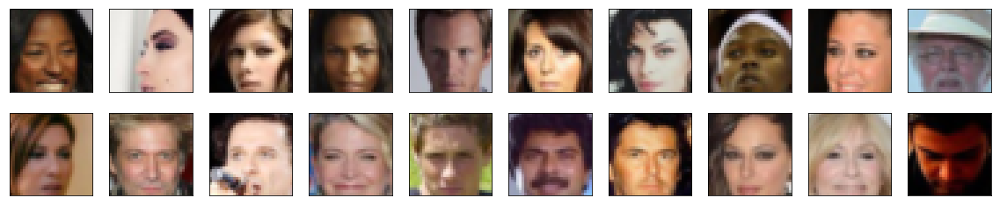

In [48]:
# helper display function
def imshow(img):
    npimg = img.numpy()
    plt.imshow(np.transpose(npimg, (1, 2, 0)))

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# obtain one batch of training images
dataiter = iter(celeba_train_loader)
images, _ = dataiter.next() # _ for no labels

# plot the images in the batch, along with the corresponding labels
fig = plt.figure(figsize=(20, 4))
plot_size=20
for idx in np.arange(plot_size):
    ax = fig.add_subplot(2, plot_size/2, idx+1, xticks=[], yticks=[])
    imshow(images[idx])

#### Exercise: Pre-process your image data and scale it to a pixel range of -1 to 1

You need to do a bit of pre-processing; you know that the output of a `tanh` activated generator will contain pixel values in a range from -1 to 1, and so, we need to rescale our training images to a range of -1 to 1. (Right now, they are in a range from 0-1.)

In [7]:
# TODO: Complete the scale function
def scale(x, feature_range=(-1, 1)):
    ''' Scale takes in an image x and returns that image, scaled
       with a feature_range of pixel values from -1 to 1. 
       This function assumes that the input x is already scaled from 0-1.'''
    # assume x is scaled to (0, 1)
    # scale to feature_range and return scaled x
    min, max = feature_range
    x = x*(max - min) - 1
    
    return x


In [8]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
# check scaled range
# should be close to -1 to 1
img = images[0]
scaled_img = scale(img)

print('Min: ', scaled_img.min())
print('Max: ', scaled_img.max())

Min:  tensor(-0.9608)
Max:  tensor(1.)


---
# Define the Model

A GAN is comprised of two adversarial networks, a discriminator and a generator.

## Discriminator

Your first task will be to define the discriminator. This is a convolutional classifier like you've built before, only without any maxpooling layers. To deal with this complex data, it's suggested you use a deep network with **normalization**. You are also allowed to create any helper functions that may be useful.

#### Exercise: Complete the Discriminator class
* The inputs to the discriminator are 32x32x3 tensor images
* The output should be a single value that will indicate whether a given image is real or fake


In [9]:
import torch.nn as nn
import torch.nn.functional as F

In [10]:
def conv(in_channels, out_channels, kernel_size=4, stride=2, padding=1, batch_norm=False):
    layers = []
    conv = nn.Conv2d(in_channels, out_channels, kernel_size, stride, padding, bias=False)
    layers.append(conv)
    if batch_norm:
        batch_norm_layer = nn.BatchNorm2d(out_channels)
        layers.append(batch_norm_layer)
        
    return nn.Sequential(*layers)

In [11]:
class Discriminator(nn.Module):

    def __init__(self, conv_dim):
        """
        Initialize the Discriminator Module
        :param conv_dim: The depth of the first convolutional layer
        """
        super(Discriminator, self).__init__()
        self.conv_dim = conv_dim

        # complete init function
        self.conv1 = conv(3, conv_dim, 4)
        self.conv2 = conv(conv_dim, conv_dim*2, 4, batch_norm=True)
        self.conv3 = conv(conv_dim*2, conv_dim*4, 4, batch_norm=True)
        
        self.fc = nn.Linear(conv_dim*4*4*4, 1)
        

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: Discriminator logits; the output of the neural network
        """
        # define feedforward behavior
        x = F.leaky_relu(self.conv1(x), 0.2)
        x = F.leaky_relu(self.conv2(x), 0.2)
        x = F.leaky_relu(self.conv3(x), 0.2)
        
        x = x.view(-1, 4*4*4*self.conv_dim)
        x = self.fc(x)
        
        return x


"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_discriminator(Discriminator)

Tests Passed


## Generator

The generator should upsample an input and generate a *new* image of the same size as our training data `32x32x3`. This should be mostly transpose convolutional layers with normalization applied to the outputs.

#### Exercise: Complete the Generator class
* The inputs to the generator are vectors of some length `z_size`
* The output should be a image of shape `32x32x3`

In [12]:
def deconv(in_channel, out_channel, kernel_size=4, stride=2, padding=1, batch_norm=False):
    layers = []
    decon = nn.ConvTranspose2d(in_channel, out_channel, kernel_size, stride, padding, bias=False)
    layers.append(decon)
    if batch_norm:
        batch_layer = nn.BatchNorm2d(out_channel)
        layers.append(batch_layer)
        
    return nn.Sequential(*layers)

In [13]:
class Generator(nn.Module):
    
    def __init__(self, z_size, conv_dim):
        """
        Initialize the Generator Module
        :param z_size: The length of the input latent vector, z
        :param conv_dim: The depth of the inputs to the *last* transpose convolutional layer
        """
        super(Generator, self).__init__()
        self.conv_dim = conv_dim

        # complete init function
        self.fc = nn.Linear(z_size, 4*4*4*conv_dim)
        self.deconv1 = deconv(4*conv_dim, conv_dim*2, 4, batch_norm=True)
        self.deconv2 = deconv(conv_dim*2, conv_dim, 4, batch_norm=True)
        self.deconv3 = deconv(conv_dim, 3, 4)
        

    def forward(self, x):
        """
        Forward propagation of the neural network
        :param x: The input to the neural network     
        :return: A 32x32x3 Tensor image as output
        """
        # define feedforward behavior
        x = self.fc(x)
        x = x.view(-1, 4*self.conv_dim, 4, 4)
        x = F.relu(self.deconv1(x))
        x = F.relu(self.deconv2(x))
        x = torch.tanh(self.deconv3(x))
        
        return x

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
tests.test_generator(Generator)

Tests Passed


## Initialize the weights of your networks

To help your models converge, you should initialize the weights of the convolutional and linear layers in your model. From reading the [original DCGAN paper](https://arxiv.org/pdf/1511.06434.pdf), they say:
> All weights were initialized from a zero-centered Normal distribution with standard deviation 0.02.

So, your next task will be to define a weight initialization function that does just this!

You can refer back to the lesson on weight initialization or even consult existing model code, such as that from [the `networks.py` file in CycleGAN Github repository](https://github.com/junyanz/pytorch-CycleGAN-and-pix2pix/blob/master/models/networks.py) to help you complete this function.

#### Exercise: Complete the weight initialization function

* This should initialize only **convolutional** and **linear** layers
* Initialize the weights to a normal distribution, centered around 0, with a standard deviation of 0.02.
* The bias terms, if they exist, may be left alone or set to 0.

In [14]:
def weights_init_normal(m):
    """
    Applies initial weights to certain layers in a model .
    The weights are taken from a normal distribution 
    with mean = 0, std dev = 0.02.
    :param m: A module or layer in a network    
    """
    # classname will be something like:
    # `Conv`, `BatchNorm2d`, `Linear`, etc.
    classname = m.__class__.__name__
    
    # TODO: Apply initial weights to convolutional and linear layers
    if classname.find('Linear') != -1:
        m.weight.data.normal_(0.0, 0.02)
        
    if classname.find('Conv') != -1:
        m.weight.data.normal_(0.0, 0.02)
    
    

## Build complete network

Define your models' hyperparameters and instantiate the discriminator and generator from the classes defined above. Make sure you've passed in the correct input arguments.

In [15]:
"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
def build_network(d_conv_dim, g_conv_dim, z_size):
    # define discriminator and generator
    D = Discriminator(d_conv_dim)
    G = Generator(z_size=z_size, conv_dim=g_conv_dim)

    # initialize model weights
    D.apply(weights_init_normal)
    G.apply(weights_init_normal)

    print(D)
    print()
    print(G)
    
    return D, G


#### Exercise: Define model hyperparameters

In [16]:
# Define model hyperparams
d_conv_dim = 32
g_conv_dim = 32
z_size = 100

"""
DON'T MODIFY ANYTHING IN THIS CELL THAT IS BELOW THIS LINE
"""
D, G = build_network(d_conv_dim, g_conv_dim, z_size)

Discriminator(
  (conv1): Sequential(
    (0): Conv2d(3, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
  )
  (conv2): Sequential(
    (0): Conv2d(32, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (conv3): Sequential(
    (0): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (fc): Linear(in_features=2048, out_features=1, bias=True)
)

Generator(
  (fc): Linear(in_features=100, out_features=2048, bias=True)
  (deconv1): Sequential(
    (0): ConvTranspose2d(128, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): BatchNorm2d(64, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
  )
  (deconv2): Sequential(
    (0): ConvTranspose2d(64, 32, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias

### Training on GPU

Check if you can train on GPU. Here, we'll set this as a boolean variable `train_on_gpu`. Later, you'll be responsible for making sure that 
>* Models,
* Model inputs, and
* Loss function arguments

Are moved to GPU, where appropriate.

In [17]:
"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
import torch

# Check for a GPU
train_on_gpu = torch.cuda.is_available()
if not train_on_gpu:
    print('No GPU found. Please use a GPU to train your neural network.')
else:
    print('Training on GPU!')

Training on GPU!


---
## Discriminator and Generator Losses

Now we need to calculate the losses for both types of adversarial networks.

### Discriminator Losses

> * For the discriminator, the total loss is the sum of the losses for real and fake images, `d_loss = d_real_loss + d_fake_loss`. 
* Remember that we want the discriminator to output 1 for real images and 0 for fake images, so we need to set up the losses to reflect that.


### Generator Loss

The generator loss will look similar only with flipped labels. The generator's goal is to get the discriminator to *think* its generated images are *real*.

#### Exercise: Complete real and fake loss functions

**You may choose to use either cross entropy or a least squares error loss to complete the following `real_loss` and `fake_loss` functions.**

In [18]:
def real_loss(D_out, smooth=False):
    batch_size = D_out.size(0)
    if smooth:
        labels = torch.ones(batch_size)*0.9
    else:
        labels = torch.ones(batch_size)
    if train_on_gpu:
        labels = labels.cuda()
        
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(D_out.squeeze(), labels)
    
    return loss

def fake_loss(D_out):
    batch_size = D_out.size(0)
    labels = torch.zeros(batch_size)
    if train_on_gpu:
        labels = labels.cuda()
        
    criterion = nn.BCEWithLogitsLoss()
    loss = criterion(D_out.squeeze(), labels)
    
    return loss

## Optimizers

#### Exercise: Define optimizers for your Discriminator (D) and Generator (G)

Define optimizers for your models with appropriate hyperparameters.

In [19]:
import torch.optim as optim
lr = 0.0002
beta1 = 0.5
beta2 = 0.99
# Create optimizers for the discriminator D and generator G
d_optimizer = optim.Adam(D.parameters(), lr, [beta1, beta2])
g_optimizer = optim.Adam(G.parameters(), lr, [beta1, beta2])

---
## Training

Training will involve alternating between training the discriminator and the generator. You'll use your functions `real_loss` and `fake_loss` to help you calculate the discriminator losses.

* You should train the discriminator by alternating on real and fake images
* Then the generator, which tries to trick the discriminator and should have an opposing loss function


#### Saving Samples

You've been given some code to print out some loss statistics and save some generated "fake" samples.

#### Exercise: Complete the training function

Keep in mind that, if you've moved your models to GPU, you'll also have to move any model inputs to GPU.

In [43]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(16,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((32,32,3)))
    
    plt.show()

In [51]:
def train(D, G, n_epochs, print_every=50):
    '''Trains adversarial networks for some number of epochs
       param, D: the discriminator network
       param, G: the generator network
       param, n_epochs: number of epochs to train for
       param, print_every: when to print and record the models' losses
       return: D and G losses'''
    
    # move models to GPU
    if train_on_gpu:
        D.cuda()
        G.cuda()

    # keep track of loss and generated, "fake" samples
    samples = []
    losses = []

    # Get some fixed data for sampling. These are images that are held
    # constant throughout training, and allow us to inspect the model's performance
    sample_size=16
    fixed_z = np.random.uniform(-1, 1, size=(sample_size, z_size))
    fixed_z = torch.from_numpy(fixed_z).float()
    # move z to GPU if available
    if train_on_gpu:
        fixed_z = fixed_z.cuda()

    # epoch training loop
    for epoch in range(n_epochs):
        # batch training loop
        for batch_i, (real_images, _) in enumerate(celeba_train_loader):

            batch_size = real_images.size(0)
            real_images = scale(real_images)

            # ===============================================
            #         YOUR CODE HERE: TRAIN THE NETWORKS
            # ===============================================
            
            # 1. Train the discriminator on real and fake images
            if train_on_gpu:
                real_images = real_images.cuda()
            realLoss = real_loss(D(real_images))
            
            z_vec = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z_vec = torch.from_numpy(z_vec).float()
            if train_on_gpu:
                z_vec = z_vec.cuda()
                
            fake_images = G(z_vec)
            fakeLoss = fake_loss(D(fake_images))
            d_loss = realLoss + fakeLoss
            d_optimizer.zero_grad()
            d_loss.backward()
            d_optimizer.step()

            # 2. Train the generator with an adversarial loss
            z_vec = np.random.uniform(-1, 1, size=(batch_size, z_size))
            z_vec = torch.from_numpy(z_vec).float()
            if train_on_gpu:
                z_vec = z_vec.cuda()
            fake_image = G(z_vec)
            
            g_loss = real_loss(D(fake_image))
            g_optimizer.zero_grad()
            g_loss.backward()
            g_optimizer.step()
            
            
            # ===============================================
            #              END OF YOUR CODE
            # ===============================================

            # Print some loss stats
            if batch_i % print_every == 0:
                # append discriminator loss and generator loss
                losses.append((d_loss.item(), g_loss.item()))
                # print discriminator and generator loss
                print('Epoch [{:2d}/{:2d}] | Cal[{:1d}/{:1d}] | d_loss: {:6.4f} | g_loss: {:6.4f}'.format(
                        epoch+1, n_epochs, batch_i, len(celeba_train_loader), d_loss.item(), g_loss.item()))


    ## AFTER EACH EPOCH##    
    # this code assumes your generator is named G, feel free to change the name
    # generate and save sample, fake images
        G.eval() # for generating samples
        with torch.no_grad():
            samples_z = G(fixed_z)
            samples.append(samples_z)
            _ = view_samples(-1, samples)
        G.train() # back to training mode

    # Save training generator samples
    with open('train_samples.pkl', 'wb') as f:
        pkl.dump(samples, f)
    
    # finally return losses
    return losses

Set your number of training epochs and train your GAN!

Epoch [ 1/2000] | Cal[0/1406] | d_loss: 0.7490 | g_loss: 1.6494
Epoch [ 1/2000] | Cal[50/1406] | d_loss: 0.7143 | g_loss: 1.5394
Epoch [ 1/2000] | Cal[100/1406] | d_loss: 0.8742 | g_loss: 2.1657
Epoch [ 1/2000] | Cal[150/1406] | d_loss: 0.6275 | g_loss: 1.7681
Epoch [ 1/2000] | Cal[200/1406] | d_loss: 0.8138 | g_loss: 1.5192
Epoch [ 1/2000] | Cal[250/1406] | d_loss: 0.7051 | g_loss: 1.4976
Epoch [ 1/2000] | Cal[300/1406] | d_loss: 0.6646 | g_loss: 1.4549
Epoch [ 1/2000] | Cal[350/1406] | d_loss: 0.9779 | g_loss: 2.0224
Epoch [ 1/2000] | Cal[400/1406] | d_loss: 0.8940 | g_loss: 1.9697
Epoch [ 1/2000] | Cal[450/1406] | d_loss: 0.5852 | g_loss: 1.4463
Epoch [ 1/2000] | Cal[500/1406] | d_loss: 1.0937 | g_loss: 1.7957
Epoch [ 1/2000] | Cal[550/1406] | d_loss: 0.8109 | g_loss: 2.0149
Epoch [ 1/2000] | Cal[600/1406] | d_loss: 0.8445 | g_loss: 2.0184
Epoch [ 1/2000] | Cal[650/1406] | d_loss: 0.8478 | g_loss: 1.3032
Epoch [ 1/2000] | Cal[700/1406] | d_loss: 0.7663 | g_loss: 1.4585
Epoch [ 1/200

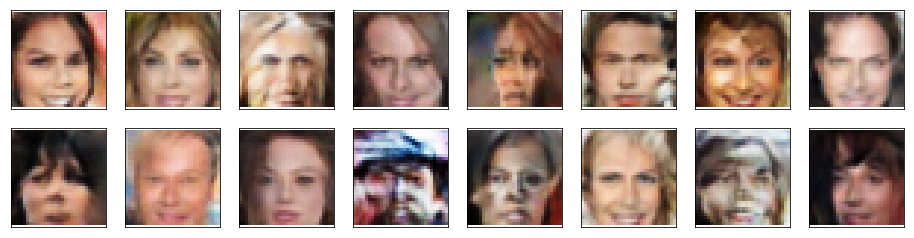

Epoch [ 2/2000] | Cal[0/1406] | d_loss: 1.3475 | g_loss: 2.4444
Epoch [ 2/2000] | Cal[50/1406] | d_loss: 1.0197 | g_loss: 1.5746
Epoch [ 2/2000] | Cal[100/1406] | d_loss: 0.7847 | g_loss: 1.2017
Epoch [ 2/2000] | Cal[150/1406] | d_loss: 1.0615 | g_loss: 1.0099
Epoch [ 2/2000] | Cal[200/1406] | d_loss: 0.5636 | g_loss: 1.8432
Epoch [ 2/2000] | Cal[250/1406] | d_loss: 0.6772 | g_loss: 1.7812
Epoch [ 2/2000] | Cal[300/1406] | d_loss: 0.7115 | g_loss: 1.6182
Epoch [ 2/2000] | Cal[350/1406] | d_loss: 0.6780 | g_loss: 1.7297
Epoch [ 2/2000] | Cal[400/1406] | d_loss: 0.8580 | g_loss: 1.1686
Epoch [ 2/2000] | Cal[450/1406] | d_loss: 0.5648 | g_loss: 1.5662
Epoch [ 2/2000] | Cal[500/1406] | d_loss: 0.8254 | g_loss: 1.8766
Epoch [ 2/2000] | Cal[550/1406] | d_loss: 0.7420 | g_loss: 0.8380
Epoch [ 2/2000] | Cal[600/1406] | d_loss: 0.8983 | g_loss: 1.2895
Epoch [ 2/2000] | Cal[650/1406] | d_loss: 0.7854 | g_loss: 1.9688
Epoch [ 2/2000] | Cal[700/1406] | d_loss: 0.7573 | g_loss: 0.9904
Epoch [ 2/200

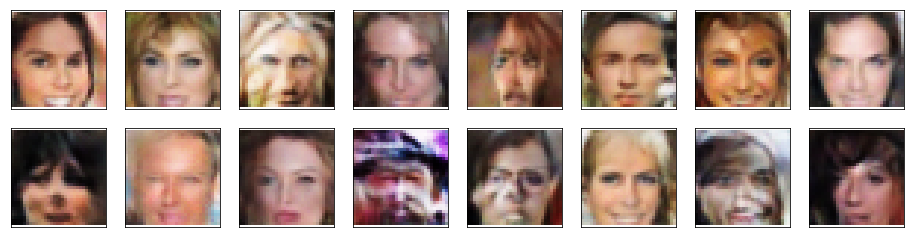

Epoch [ 3/2000] | Cal[0/1406] | d_loss: 1.0810 | g_loss: 3.2518
Epoch [ 3/2000] | Cal[50/1406] | d_loss: 0.7377 | g_loss: 2.1402
Epoch [ 3/2000] | Cal[100/1406] | d_loss: 0.6520 | g_loss: 1.2131
Epoch [ 3/2000] | Cal[150/1406] | d_loss: 0.7825 | g_loss: 2.0275
Epoch [ 3/2000] | Cal[200/1406] | d_loss: 0.7051 | g_loss: 1.2892
Epoch [ 3/2000] | Cal[250/1406] | d_loss: 0.5980 | g_loss: 2.0906
Epoch [ 3/2000] | Cal[300/1406] | d_loss: 0.7638 | g_loss: 2.5354
Epoch [ 3/2000] | Cal[350/1406] | d_loss: 0.5429 | g_loss: 1.8966
Epoch [ 3/2000] | Cal[400/1406] | d_loss: 0.8221 | g_loss: 0.4735
Epoch [ 3/2000] | Cal[450/1406] | d_loss: 1.1674 | g_loss: 2.1577
Epoch [ 3/2000] | Cal[500/1406] | d_loss: 0.5886 | g_loss: 1.8341
Epoch [ 3/2000] | Cal[550/1406] | d_loss: 0.6229 | g_loss: 1.1872
Epoch [ 3/2000] | Cal[600/1406] | d_loss: 0.7739 | g_loss: 1.3791
Epoch [ 3/2000] | Cal[650/1406] | d_loss: 0.5763 | g_loss: 1.7010
Epoch [ 3/2000] | Cal[700/1406] | d_loss: 0.9976 | g_loss: 3.0737
Epoch [ 3/200

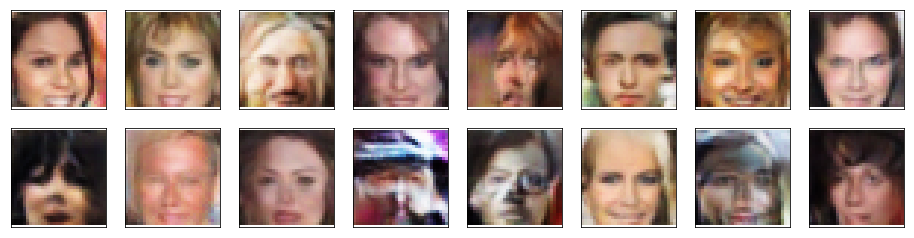

Epoch [ 4/2000] | Cal[0/1406] | d_loss: 0.6202 | g_loss: 1.6946
Epoch [ 4/2000] | Cal[50/1406] | d_loss: 1.2809 | g_loss: 3.6592
Epoch [ 4/2000] | Cal[100/1406] | d_loss: 0.5912 | g_loss: 1.6692
Epoch [ 4/2000] | Cal[150/1406] | d_loss: 0.7144 | g_loss: 1.4869
Epoch [ 4/2000] | Cal[200/1406] | d_loss: 0.5564 | g_loss: 1.4749
Epoch [ 4/2000] | Cal[250/1406] | d_loss: 0.8723 | g_loss: 2.2111
Epoch [ 4/2000] | Cal[300/1406] | d_loss: 0.5685 | g_loss: 1.4268
Epoch [ 4/2000] | Cal[350/1406] | d_loss: 0.5470 | g_loss: 1.6817
Epoch [ 4/2000] | Cal[400/1406] | d_loss: 0.7288 | g_loss: 1.6202
Epoch [ 4/2000] | Cal[450/1406] | d_loss: 0.9496 | g_loss: 0.8047
Epoch [ 4/2000] | Cal[500/1406] | d_loss: 0.7460 | g_loss: 1.5695
Epoch [ 4/2000] | Cal[550/1406] | d_loss: 0.6000 | g_loss: 1.7561
Epoch [ 4/2000] | Cal[600/1406] | d_loss: 0.6930 | g_loss: 1.5087
Epoch [ 4/2000] | Cal[650/1406] | d_loss: 0.6374 | g_loss: 2.1713
Epoch [ 4/2000] | Cal[700/1406] | d_loss: 0.8393 | g_loss: 1.9899
Epoch [ 4/200

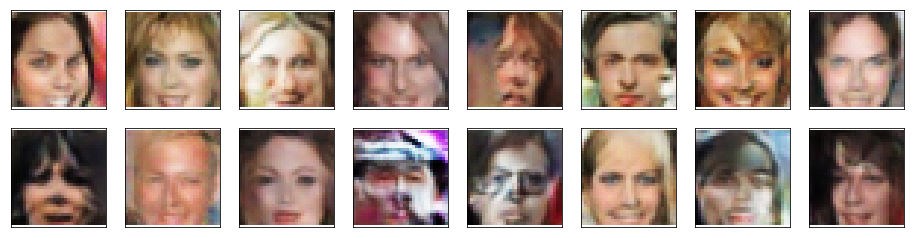

Epoch [ 5/2000] | Cal[0/1406] | d_loss: 1.0697 | g_loss: 0.7713
Epoch [ 5/2000] | Cal[50/1406] | d_loss: 0.7580 | g_loss: 2.9079
Epoch [ 5/2000] | Cal[100/1406] | d_loss: 0.8507 | g_loss: 2.7110
Epoch [ 5/2000] | Cal[150/1406] | d_loss: 0.9431 | g_loss: 1.0224
Epoch [ 5/2000] | Cal[200/1406] | d_loss: 0.7521 | g_loss: 1.7271
Epoch [ 5/2000] | Cal[250/1406] | d_loss: 0.7934 | g_loss: 2.4579
Epoch [ 5/2000] | Cal[300/1406] | d_loss: 0.5324 | g_loss: 2.5143
Epoch [ 5/2000] | Cal[350/1406] | d_loss: 0.7582 | g_loss: 1.9310
Epoch [ 5/2000] | Cal[400/1406] | d_loss: 0.7031 | g_loss: 2.0650
Epoch [ 5/2000] | Cal[450/1406] | d_loss: 0.4254 | g_loss: 1.9130
Epoch [ 5/2000] | Cal[500/1406] | d_loss: 0.6765 | g_loss: 1.7140
Epoch [ 5/2000] | Cal[550/1406] | d_loss: 0.6238 | g_loss: 2.1632
Epoch [ 5/2000] | Cal[600/1406] | d_loss: 0.5095 | g_loss: 1.8095
Epoch [ 5/2000] | Cal[650/1406] | d_loss: 0.9563 | g_loss: 0.7547
Epoch [ 5/2000] | Cal[700/1406] | d_loss: 0.6299 | g_loss: 2.0106
Epoch [ 5/200

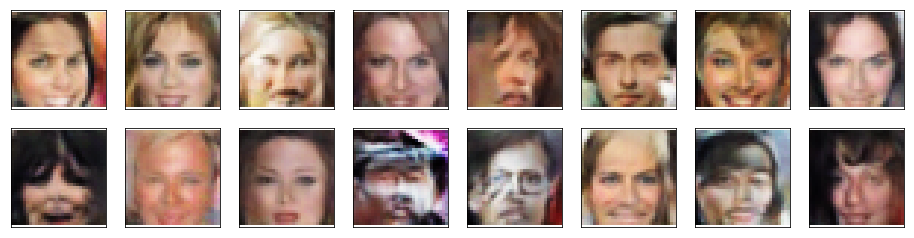

Epoch [ 6/2000] | Cal[0/1406] | d_loss: 1.1638 | g_loss: 1.0294
Epoch [ 6/2000] | Cal[50/1406] | d_loss: 0.4033 | g_loss: 2.2326
Epoch [ 6/2000] | Cal[100/1406] | d_loss: 0.6039 | g_loss: 3.4577
Epoch [ 6/2000] | Cal[150/1406] | d_loss: 0.4171 | g_loss: 2.4054
Epoch [ 6/2000] | Cal[200/1406] | d_loss: 0.5731 | g_loss: 2.9836
Epoch [ 6/2000] | Cal[250/1406] | d_loss: 0.6955 | g_loss: 1.0276
Epoch [ 6/2000] | Cal[300/1406] | d_loss: 0.4716 | g_loss: 1.8392
Epoch [ 6/2000] | Cal[350/1406] | d_loss: 0.5920 | g_loss: 1.7452
Epoch [ 6/2000] | Cal[400/1406] | d_loss: 1.4797 | g_loss: 5.7952
Epoch [ 6/2000] | Cal[450/1406] | d_loss: 0.6758 | g_loss: 1.5368
Epoch [ 6/2000] | Cal[500/1406] | d_loss: 0.4693 | g_loss: 2.2351
Epoch [ 6/2000] | Cal[550/1406] | d_loss: 0.5308 | g_loss: 1.9606
Epoch [ 6/2000] | Cal[600/1406] | d_loss: 0.8840 | g_loss: 0.3613
Epoch [ 6/2000] | Cal[650/1406] | d_loss: 0.6836 | g_loss: 1.8540
Epoch [ 6/2000] | Cal[700/1406] | d_loss: 0.4139 | g_loss: 1.4655
Epoch [ 6/200

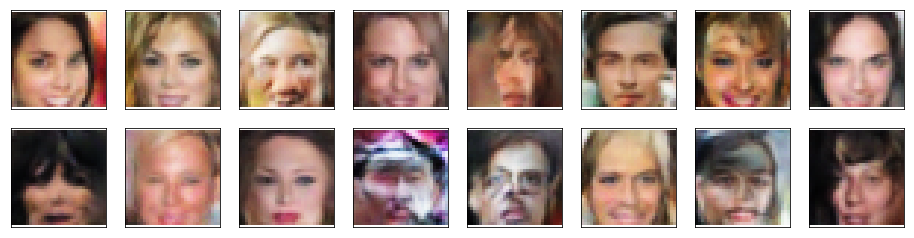

Epoch [ 7/2000] | Cal[0/1406] | d_loss: 0.6734 | g_loss: 1.4191
Epoch [ 7/2000] | Cal[50/1406] | d_loss: 0.4923 | g_loss: 1.3922
Epoch [ 7/2000] | Cal[100/1406] | d_loss: 1.0043 | g_loss: 0.9445
Epoch [ 7/2000] | Cal[150/1406] | d_loss: 0.6082 | g_loss: 2.5074
Epoch [ 7/2000] | Cal[200/1406] | d_loss: 0.4569 | g_loss: 1.6213
Epoch [ 7/2000] | Cal[250/1406] | d_loss: 0.5356 | g_loss: 2.7773
Epoch [ 7/2000] | Cal[300/1406] | d_loss: 1.9985 | g_loss: 3.1946
Epoch [ 7/2000] | Cal[350/1406] | d_loss: 0.3759 | g_loss: 2.0490
Epoch [ 7/2000] | Cal[400/1406] | d_loss: 0.2991 | g_loss: 2.2983
Epoch [ 7/2000] | Cal[450/1406] | d_loss: 0.5662 | g_loss: 1.4714
Epoch [ 7/2000] | Cal[500/1406] | d_loss: 0.5044 | g_loss: 2.0921
Epoch [ 7/2000] | Cal[550/1406] | d_loss: 0.5341 | g_loss: 2.4276
Epoch [ 7/2000] | Cal[600/1406] | d_loss: 0.6805 | g_loss: 1.1782
Epoch [ 7/2000] | Cal[650/1406] | d_loss: 0.4186 | g_loss: 2.5087
Epoch [ 7/2000] | Cal[700/1406] | d_loss: 0.2921 | g_loss: 2.5913
Epoch [ 7/200

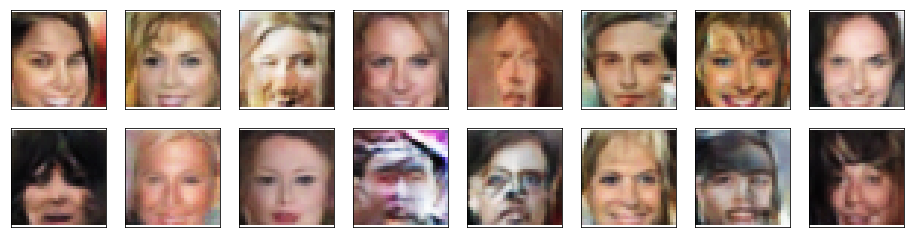

Epoch [ 8/2000] | Cal[0/1406] | d_loss: 1.1419 | g_loss: 3.3370
Epoch [ 8/2000] | Cal[50/1406] | d_loss: 0.7412 | g_loss: 2.1783
Epoch [ 8/2000] | Cal[100/1406] | d_loss: 0.5240 | g_loss: 2.0360
Epoch [ 8/2000] | Cal[150/1406] | d_loss: 0.7191 | g_loss: 1.7918
Epoch [ 8/2000] | Cal[200/1406] | d_loss: 0.5062 | g_loss: 2.9565
Epoch [ 8/2000] | Cal[250/1406] | d_loss: 0.5725 | g_loss: 1.9523
Epoch [ 8/2000] | Cal[300/1406] | d_loss: 0.5928 | g_loss: 1.5010
Epoch [ 8/2000] | Cal[350/1406] | d_loss: 0.3832 | g_loss: 2.1198
Epoch [ 8/2000] | Cal[400/1406] | d_loss: 0.3237 | g_loss: 3.8067
Epoch [ 8/2000] | Cal[450/1406] | d_loss: 0.4690 | g_loss: 2.0280
Epoch [ 8/2000] | Cal[500/1406] | d_loss: 0.4464 | g_loss: 1.8342
Epoch [ 8/2000] | Cal[550/1406] | d_loss: 1.2257 | g_loss: 2.4640
Epoch [ 8/2000] | Cal[600/1406] | d_loss: 0.7984 | g_loss: 1.4198
Epoch [ 8/2000] | Cal[650/1406] | d_loss: 0.6854 | g_loss: 1.7567
Epoch [ 8/2000] | Cal[700/1406] | d_loss: 0.5941 | g_loss: 1.9982
Epoch [ 8/200

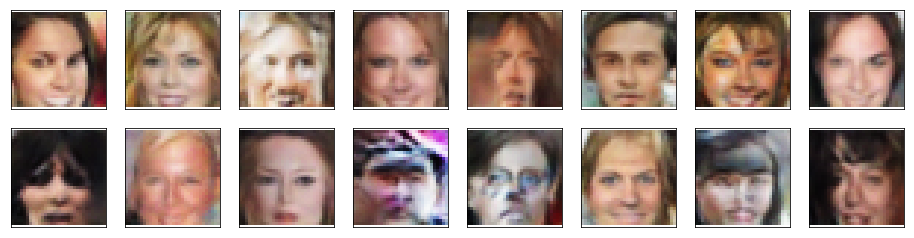

Epoch [ 9/2000] | Cal[0/1406] | d_loss: 0.5335 | g_loss: 1.9716
Epoch [ 9/2000] | Cal[50/1406] | d_loss: 0.3701 | g_loss: 2.1103
Epoch [ 9/2000] | Cal[100/1406] | d_loss: 0.4354 | g_loss: 1.3278
Epoch [ 9/2000] | Cal[150/1406] | d_loss: 0.7139 | g_loss: 3.4660
Epoch [ 9/2000] | Cal[200/1406] | d_loss: 0.5242 | g_loss: 2.0561
Epoch [ 9/2000] | Cal[250/1406] | d_loss: 0.3793 | g_loss: 2.9468
Epoch [ 9/2000] | Cal[300/1406] | d_loss: 0.5816 | g_loss: 1.6506
Epoch [ 9/2000] | Cal[350/1406] | d_loss: 0.5745 | g_loss: 3.0706
Epoch [ 9/2000] | Cal[400/1406] | d_loss: 0.4304 | g_loss: 2.6231
Epoch [ 9/2000] | Cal[450/1406] | d_loss: 0.5074 | g_loss: 2.4978
Epoch [ 9/2000] | Cal[500/1406] | d_loss: 0.9636 | g_loss: 1.2183
Epoch [ 9/2000] | Cal[550/1406] | d_loss: 0.9009 | g_loss: 3.1008
Epoch [ 9/2000] | Cal[600/1406] | d_loss: 0.2936 | g_loss: 2.4395
Epoch [ 9/2000] | Cal[650/1406] | d_loss: 0.5408 | g_loss: 1.4747
Epoch [ 9/2000] | Cal[700/1406] | d_loss: 0.6724 | g_loss: 2.4345
Epoch [ 9/200

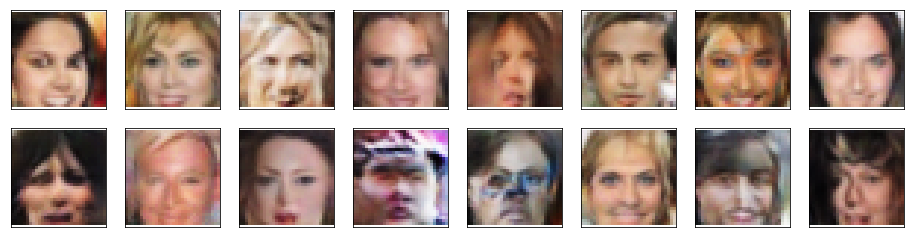

Epoch [10/2000] | Cal[0/1406] | d_loss: 0.3550 | g_loss: 2.3345
Epoch [10/2000] | Cal[50/1406] | d_loss: 0.8164 | g_loss: 3.4474
Epoch [10/2000] | Cal[100/1406] | d_loss: 1.7386 | g_loss: 0.4128
Epoch [10/2000] | Cal[150/1406] | d_loss: 0.4052 | g_loss: 2.3782
Epoch [10/2000] | Cal[200/1406] | d_loss: 0.2614 | g_loss: 2.8631
Epoch [10/2000] | Cal[250/1406] | d_loss: 0.5015 | g_loss: 2.5007
Epoch [10/2000] | Cal[300/1406] | d_loss: 0.4175 | g_loss: 2.1450
Epoch [10/2000] | Cal[350/1406] | d_loss: 2.3837 | g_loss: 0.7549
Epoch [10/2000] | Cal[400/1406] | d_loss: 0.3593 | g_loss: 2.9480
Epoch [10/2000] | Cal[450/1406] | d_loss: 0.2557 | g_loss: 3.2847
Epoch [10/2000] | Cal[500/1406] | d_loss: 0.2786 | g_loss: 2.9499
Epoch [10/2000] | Cal[550/1406] | d_loss: 0.2425 | g_loss: 2.5958
Epoch [10/2000] | Cal[600/1406] | d_loss: 0.4332 | g_loss: 2.3436
Epoch [10/2000] | Cal[650/1406] | d_loss: 0.4470 | g_loss: 3.1527
Epoch [10/2000] | Cal[700/1406] | d_loss: 0.7523 | g_loss: 4.1829
Epoch [10/200

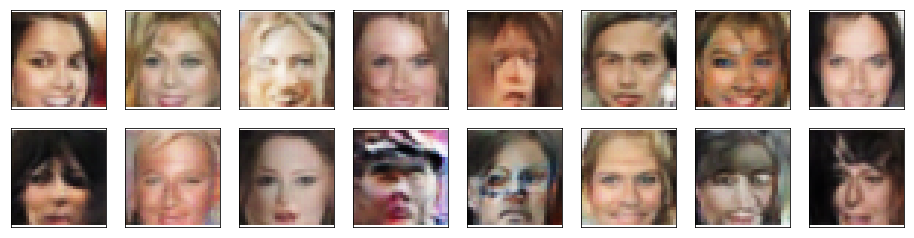

Epoch [11/2000] | Cal[0/1406] | d_loss: 1.3535 | g_loss: 0.1271
Epoch [11/2000] | Cal[50/1406] | d_loss: 0.3448 | g_loss: 2.2570
Epoch [11/2000] | Cal[100/1406] | d_loss: 0.5559 | g_loss: 2.5679
Epoch [11/2000] | Cal[150/1406] | d_loss: 0.4182 | g_loss: 3.3692
Epoch [11/2000] | Cal[200/1406] | d_loss: 0.3471 | g_loss: 3.0870
Epoch [11/2000] | Cal[250/1406] | d_loss: 0.5462 | g_loss: 3.3050
Epoch [11/2000] | Cal[300/1406] | d_loss: 0.6665 | g_loss: 3.3906
Epoch [11/2000] | Cal[350/1406] | d_loss: 0.3113 | g_loss: 2.2076
Epoch [11/2000] | Cal[400/1406] | d_loss: 0.2647 | g_loss: 2.8107
Epoch [11/2000] | Cal[450/1406] | d_loss: 0.3596 | g_loss: 2.6308
Epoch [11/2000] | Cal[500/1406] | d_loss: 0.2678 | g_loss: 2.7528
Epoch [11/2000] | Cal[550/1406] | d_loss: 0.4136 | g_loss: 1.7692
Epoch [11/2000] | Cal[600/1406] | d_loss: 0.2894 | g_loss: 3.2146
Epoch [11/2000] | Cal[650/1406] | d_loss: 0.3526 | g_loss: 1.9816
Epoch [11/2000] | Cal[700/1406] | d_loss: 0.8528 | g_loss: 5.0735
Epoch [11/200

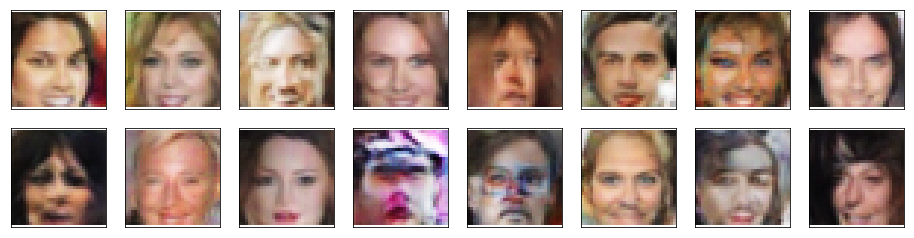

Epoch [12/2000] | Cal[0/1406] | d_loss: 0.3955 | g_loss: 2.4908
Epoch [12/2000] | Cal[50/1406] | d_loss: 0.2655 | g_loss: 2.9230
Epoch [12/2000] | Cal[100/1406] | d_loss: 0.3890 | g_loss: 2.2244
Epoch [12/2000] | Cal[150/1406] | d_loss: 0.3206 | g_loss: 3.2200
Epoch [12/2000] | Cal[200/1406] | d_loss: 0.4448 | g_loss: 0.9863
Epoch [12/2000] | Cal[250/1406] | d_loss: 0.3021 | g_loss: 3.3411
Epoch [12/2000] | Cal[300/1406] | d_loss: 0.3013 | g_loss: 3.2492
Epoch [12/2000] | Cal[350/1406] | d_loss: 0.6763 | g_loss: 3.5967
Epoch [12/2000] | Cal[400/1406] | d_loss: 0.5750 | g_loss: 2.2018
Epoch [12/2000] | Cal[450/1406] | d_loss: 0.3694 | g_loss: 2.2084
Epoch [12/2000] | Cal[500/1406] | d_loss: 0.4442 | g_loss: 2.5974
Epoch [12/2000] | Cal[550/1406] | d_loss: 0.2748 | g_loss: 2.6314
Epoch [12/2000] | Cal[600/1406] | d_loss: 0.3064 | g_loss: 2.6571
Epoch [12/2000] | Cal[650/1406] | d_loss: 0.8542 | g_loss: 3.5786
Epoch [12/2000] | Cal[700/1406] | d_loss: 0.2632 | g_loss: 3.4660
Epoch [12/200

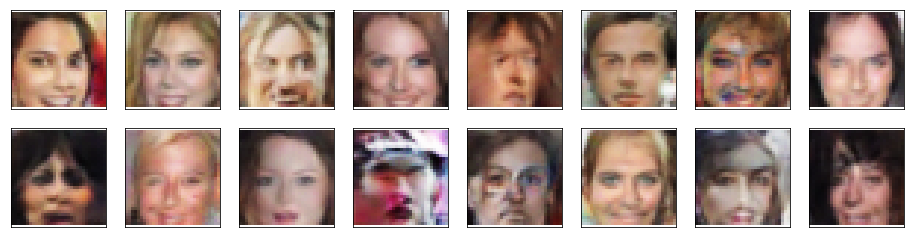

Epoch [13/2000] | Cal[0/1406] | d_loss: 0.6735 | g_loss: 3.6013
Epoch [13/2000] | Cal[50/1406] | d_loss: 0.2558 | g_loss: 3.8353
Epoch [13/2000] | Cal[100/1406] | d_loss: 0.3026 | g_loss: 2.1671
Epoch [13/2000] | Cal[150/1406] | d_loss: 0.2229 | g_loss: 3.1836
Epoch [13/2000] | Cal[200/1406] | d_loss: 1.1445 | g_loss: 3.9953
Epoch [13/2000] | Cal[250/1406] | d_loss: 0.2661 | g_loss: 2.9212
Epoch [13/2000] | Cal[300/1406] | d_loss: 0.2732 | g_loss: 3.0378
Epoch [13/2000] | Cal[350/1406] | d_loss: 0.4401 | g_loss: 3.0085
Epoch [13/2000] | Cal[400/1406] | d_loss: 0.1354 | g_loss: 2.5767
Epoch [13/2000] | Cal[450/1406] | d_loss: 0.4428 | g_loss: 2.6167
Epoch [13/2000] | Cal[500/1406] | d_loss: 0.4905 | g_loss: 1.4544
Epoch [13/2000] | Cal[550/1406] | d_loss: 0.5001 | g_loss: 3.6828
Epoch [13/2000] | Cal[600/1406] | d_loss: 0.4399 | g_loss: 2.7644
Epoch [13/2000] | Cal[650/1406] | d_loss: 0.3557 | g_loss: 3.1579
Epoch [13/2000] | Cal[700/1406] | d_loss: 0.2192 | g_loss: 3.3644
Epoch [13/200

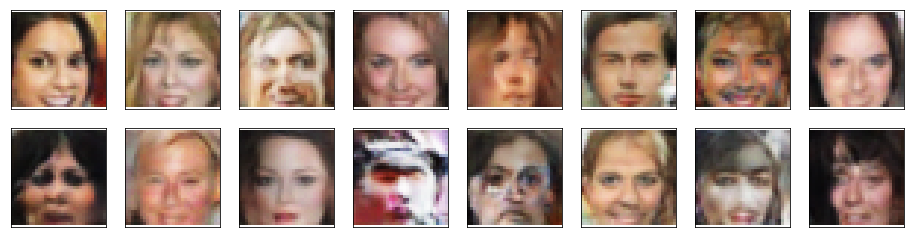

Epoch [14/2000] | Cal[0/1406] | d_loss: 0.2205 | g_loss: 3.0507
Epoch [14/2000] | Cal[50/1406] | d_loss: 0.2878 | g_loss: 2.8853
Epoch [14/2000] | Cal[100/1406] | d_loss: 0.2134 | g_loss: 3.2068
Epoch [14/2000] | Cal[150/1406] | d_loss: 0.2713 | g_loss: 2.9162
Epoch [14/2000] | Cal[200/1406] | d_loss: 1.9800 | g_loss: 3.4634
Epoch [14/2000] | Cal[250/1406] | d_loss: 0.4568 | g_loss: 2.5027
Epoch [14/2000] | Cal[300/1406] | d_loss: 0.2455 | g_loss: 3.1550
Epoch [14/2000] | Cal[350/1406] | d_loss: 0.4631 | g_loss: 3.7760
Epoch [14/2000] | Cal[400/1406] | d_loss: 0.1878 | g_loss: 2.7126
Epoch [14/2000] | Cal[450/1406] | d_loss: 0.2619 | g_loss: 2.1751
Epoch [14/2000] | Cal[500/1406] | d_loss: 0.4675 | g_loss: 2.5051
Epoch [14/2000] | Cal[550/1406] | d_loss: 0.2879 | g_loss: 2.2120
Epoch [14/2000] | Cal[600/1406] | d_loss: 0.2407 | g_loss: 3.1600
Epoch [14/2000] | Cal[650/1406] | d_loss: 0.3062 | g_loss: 3.4449
Epoch [14/2000] | Cal[700/1406] | d_loss: 0.2724 | g_loss: 2.4048
Epoch [14/200

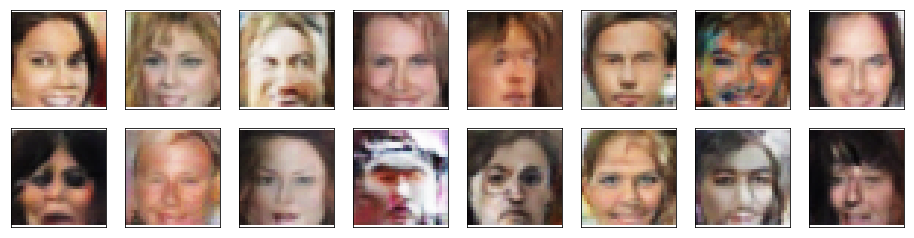

Epoch [15/2000] | Cal[0/1406] | d_loss: 0.1619 | g_loss: 2.7289
Epoch [15/2000] | Cal[50/1406] | d_loss: 0.4270 | g_loss: 2.3801
Epoch [15/2000] | Cal[100/1406] | d_loss: 0.3060 | g_loss: 2.4373
Epoch [15/2000] | Cal[150/1406] | d_loss: 0.2982 | g_loss: 2.4861
Epoch [15/2000] | Cal[200/1406] | d_loss: 0.2587 | g_loss: 3.7053
Epoch [15/2000] | Cal[250/1406] | d_loss: 0.2628 | g_loss: 2.3807
Epoch [15/2000] | Cal[300/1406] | d_loss: 0.3378 | g_loss: 3.4323
Epoch [15/2000] | Cal[350/1406] | d_loss: 0.7283 | g_loss: 1.1687
Epoch [15/2000] | Cal[400/1406] | d_loss: 0.2340 | g_loss: 3.7321
Epoch [15/2000] | Cal[450/1406] | d_loss: 0.2380 | g_loss: 2.7714
Epoch [15/2000] | Cal[500/1406] | d_loss: 0.1788 | g_loss: 4.3142
Epoch [15/2000] | Cal[550/1406] | d_loss: 0.2444 | g_loss: 3.4533
Epoch [15/2000] | Cal[600/1406] | d_loss: 0.5210 | g_loss: 2.3760
Epoch [15/2000] | Cal[650/1406] | d_loss: 0.3445 | g_loss: 3.0722
Epoch [15/2000] | Cal[700/1406] | d_loss: 0.2451 | g_loss: 3.2368
Epoch [15/200

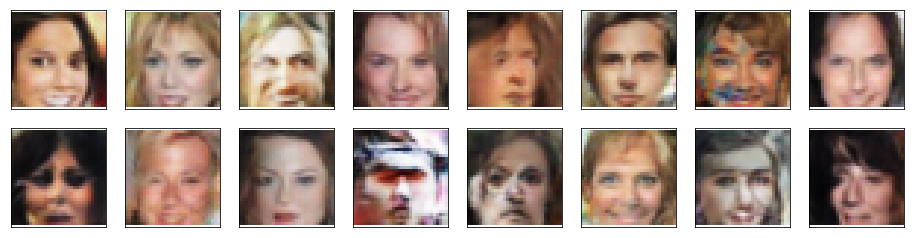

Epoch [16/2000] | Cal[0/1406] | d_loss: 1.0391 | g_loss: 6.4256
Epoch [16/2000] | Cal[50/1406] | d_loss: 0.2522 | g_loss: 2.5028
Epoch [16/2000] | Cal[100/1406] | d_loss: 0.8872 | g_loss: 6.6475
Epoch [16/2000] | Cal[150/1406] | d_loss: 0.2434 | g_loss: 2.4596
Epoch [16/2000] | Cal[200/1406] | d_loss: 0.7321 | g_loss: 1.4940
Epoch [16/2000] | Cal[250/1406] | d_loss: 0.2131 | g_loss: 3.9691
Epoch [16/2000] | Cal[300/1406] | d_loss: 0.3893 | g_loss: 3.8326
Epoch [16/2000] | Cal[350/1406] | d_loss: 0.2651 | g_loss: 3.2509
Epoch [16/2000] | Cal[400/1406] | d_loss: 0.2745 | g_loss: 2.9779
Epoch [16/2000] | Cal[450/1406] | d_loss: 0.2607 | g_loss: 3.8510
Epoch [16/2000] | Cal[500/1406] | d_loss: 0.2871 | g_loss: 2.8355
Epoch [16/2000] | Cal[550/1406] | d_loss: 0.2981 | g_loss: 4.4391
Epoch [16/2000] | Cal[600/1406] | d_loss: 0.2205 | g_loss: 3.0047
Epoch [16/2000] | Cal[650/1406] | d_loss: 0.3455 | g_loss: 3.9744
Epoch [16/2000] | Cal[700/1406] | d_loss: 0.2849 | g_loss: 3.0029
Epoch [16/200

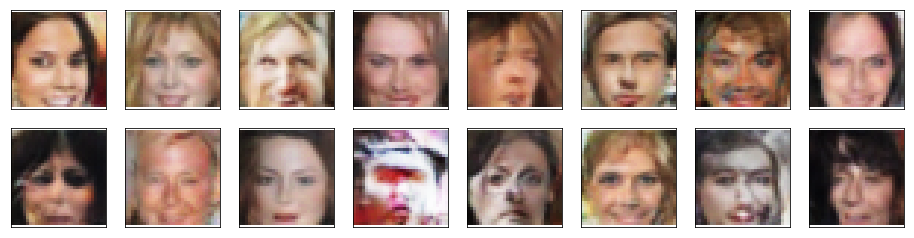

Epoch [17/2000] | Cal[0/1406] | d_loss: 1.1210 | g_loss: 5.1990
Epoch [17/2000] | Cal[50/1406] | d_loss: 0.3859 | g_loss: 3.0689
Epoch [17/2000] | Cal[100/1406] | d_loss: 0.1801 | g_loss: 3.3865
Epoch [17/2000] | Cal[150/1406] | d_loss: 0.2041 | g_loss: 3.4559
Epoch [17/2000] | Cal[200/1406] | d_loss: 0.2132 | g_loss: 2.6997
Epoch [17/2000] | Cal[250/1406] | d_loss: 0.2472 | g_loss: 3.2279
Epoch [17/2000] | Cal[300/1406] | d_loss: 0.2983 | g_loss: 2.0643
Epoch [17/2000] | Cal[350/1406] | d_loss: 0.1688 | g_loss: 3.6181
Epoch [17/2000] | Cal[400/1406] | d_loss: 0.2329 | g_loss: 4.5299
Epoch [17/2000] | Cal[450/1406] | d_loss: 0.2768 | g_loss: 3.6381
Epoch [17/2000] | Cal[500/1406] | d_loss: 0.1883 | g_loss: 4.5838
Epoch [17/2000] | Cal[550/1406] | d_loss: 0.2177 | g_loss: 2.7518
Epoch [17/2000] | Cal[600/1406] | d_loss: 0.2718 | g_loss: 3.3601
Epoch [17/2000] | Cal[650/1406] | d_loss: 0.3318 | g_loss: 2.8213
Epoch [17/2000] | Cal[700/1406] | d_loss: 0.2766 | g_loss: 2.9695
Epoch [17/200

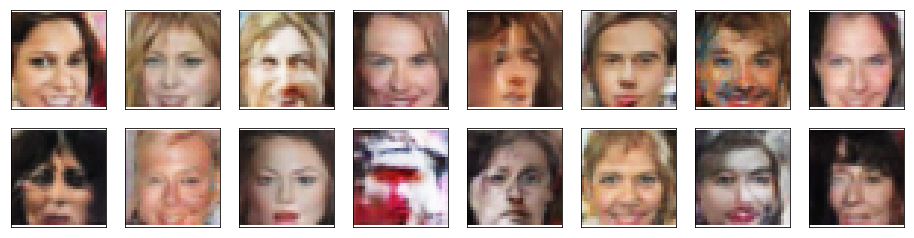

Epoch [18/2000] | Cal[0/1406] | d_loss: 0.2650 | g_loss: 2.3619
Epoch [18/2000] | Cal[50/1406] | d_loss: 0.2441 | g_loss: 4.2139
Epoch [18/2000] | Cal[100/1406] | d_loss: 0.3776 | g_loss: 2.0069
Epoch [18/2000] | Cal[150/1406] | d_loss: 0.2925 | g_loss: 3.3791
Epoch [18/2000] | Cal[200/1406] | d_loss: 0.3478 | g_loss: 3.5769
Epoch [18/2000] | Cal[250/1406] | d_loss: 0.3340 | g_loss: 3.6779
Epoch [18/2000] | Cal[300/1406] | d_loss: 0.2203 | g_loss: 2.2063
Epoch [18/2000] | Cal[350/1406] | d_loss: 0.2803 | g_loss: 3.2398
Epoch [18/2000] | Cal[400/1406] | d_loss: 0.2475 | g_loss: 2.4998
Epoch [18/2000] | Cal[450/1406] | d_loss: 0.2072 | g_loss: 4.2995
Epoch [18/2000] | Cal[500/1406] | d_loss: 0.2613 | g_loss: 3.7156
Epoch [18/2000] | Cal[550/1406] | d_loss: 0.4187 | g_loss: 1.9492
Epoch [18/2000] | Cal[600/1406] | d_loss: 0.3133 | g_loss: 3.2059
Epoch [18/2000] | Cal[650/1406] | d_loss: 0.1513 | g_loss: 3.0689
Epoch [18/2000] | Cal[700/1406] | d_loss: 0.3656 | g_loss: 2.9781
Epoch [18/200

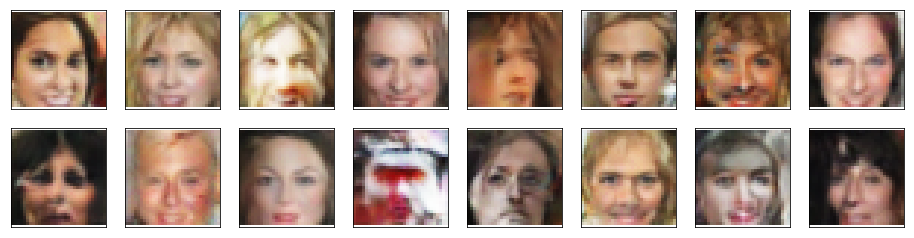

Epoch [19/2000] | Cal[0/1406] | d_loss: 0.2270 | g_loss: 2.5251
Epoch [19/2000] | Cal[50/1406] | d_loss: 0.2172 | g_loss: 2.9484
Epoch [19/2000] | Cal[100/1406] | d_loss: 0.2542 | g_loss: 2.9632
Epoch [19/2000] | Cal[150/1406] | d_loss: 0.3755 | g_loss: 2.8812
Epoch [19/2000] | Cal[200/1406] | d_loss: 0.6336 | g_loss: 6.3021
Epoch [19/2000] | Cal[250/1406] | d_loss: 0.1180 | g_loss: 3.3884
Epoch [19/2000] | Cal[300/1406] | d_loss: 0.1198 | g_loss: 3.5637
Epoch [19/2000] | Cal[350/1406] | d_loss: 0.3309 | g_loss: 3.0910
Epoch [19/2000] | Cal[400/1406] | d_loss: 0.2366 | g_loss: 4.2546
Epoch [19/2000] | Cal[450/1406] | d_loss: 0.4284 | g_loss: 2.0815
Epoch [19/2000] | Cal[500/1406] | d_loss: 0.2761 | g_loss: 4.0323
Epoch [19/2000] | Cal[550/1406] | d_loss: 0.2377 | g_loss: 3.9900
Epoch [19/2000] | Cal[600/1406] | d_loss: 0.1490 | g_loss: 3.4613
Epoch [19/2000] | Cal[650/1406] | d_loss: 0.2899 | g_loss: 3.0388
Epoch [19/2000] | Cal[700/1406] | d_loss: 0.2620 | g_loss: 3.1236
Epoch [19/200

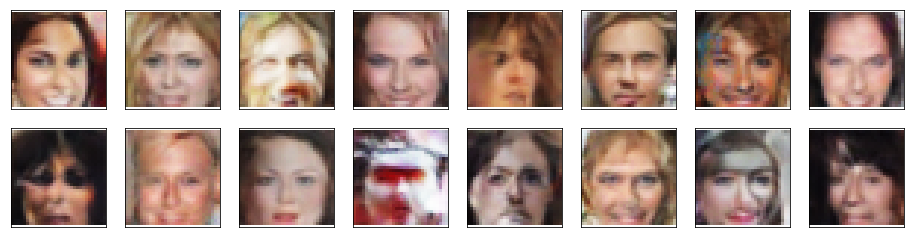

Epoch [20/2000] | Cal[0/1406] | d_loss: 0.6613 | g_loss: 1.0754
Epoch [20/2000] | Cal[50/1406] | d_loss: 0.1943 | g_loss: 2.6577
Epoch [20/2000] | Cal[100/1406] | d_loss: 0.1395 | g_loss: 3.8381
Epoch [20/2000] | Cal[150/1406] | d_loss: 1.8169 | g_loss: 0.5845
Epoch [20/2000] | Cal[200/1406] | d_loss: 0.1905 | g_loss: 2.5152
Epoch [20/2000] | Cal[250/1406] | d_loss: 0.2037 | g_loss: 4.3043
Epoch [20/2000] | Cal[300/1406] | d_loss: 0.3027 | g_loss: 3.6386
Epoch [20/2000] | Cal[350/1406] | d_loss: 0.2197 | g_loss: 3.1838
Epoch [20/2000] | Cal[400/1406] | d_loss: 0.1669 | g_loss: 3.7965
Epoch [20/2000] | Cal[450/1406] | d_loss: 0.1673 | g_loss: 3.3304
Epoch [20/2000] | Cal[500/1406] | d_loss: 0.1966 | g_loss: 3.4180
Epoch [20/2000] | Cal[550/1406] | d_loss: 0.3652 | g_loss: 2.7861
Epoch [20/2000] | Cal[600/1406] | d_loss: 0.0906 | g_loss: 3.4062
Epoch [20/2000] | Cal[650/1406] | d_loss: 0.2296 | g_loss: 3.7463
Epoch [20/2000] | Cal[700/1406] | d_loss: 0.2423 | g_loss: 2.6037
Epoch [20/200

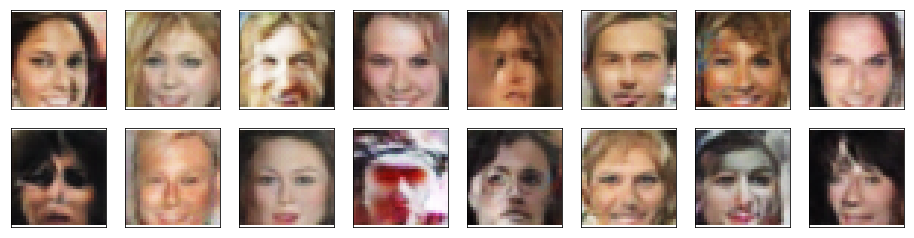

Epoch [21/2000] | Cal[0/1406] | d_loss: 0.2794 | g_loss: 3.4086
Epoch [21/2000] | Cal[50/1406] | d_loss: 0.2119 | g_loss: 2.9172
Epoch [21/2000] | Cal[100/1406] | d_loss: 0.2074 | g_loss: 4.3331
Epoch [21/2000] | Cal[150/1406] | d_loss: 0.2478 | g_loss: 2.5051
Epoch [21/2000] | Cal[200/1406] | d_loss: 0.3978 | g_loss: 3.2137
Epoch [21/2000] | Cal[250/1406] | d_loss: 0.2390 | g_loss: 3.6144
Epoch [21/2000] | Cal[300/1406] | d_loss: 1.4623 | g_loss: 6.7063
Epoch [21/2000] | Cal[350/1406] | d_loss: 0.1157 | g_loss: 3.2449
Epoch [21/2000] | Cal[400/1406] | d_loss: 0.1939 | g_loss: 3.1666
Epoch [21/2000] | Cal[450/1406] | d_loss: 0.2344 | g_loss: 4.0119
Epoch [21/2000] | Cal[500/1406] | d_loss: 0.3408 | g_loss: 3.1359
Epoch [21/2000] | Cal[550/1406] | d_loss: 0.3595 | g_loss: 4.6663
Epoch [21/2000] | Cal[600/1406] | d_loss: 0.1873 | g_loss: 3.8939
Epoch [21/2000] | Cal[650/1406] | d_loss: 0.2517 | g_loss: 3.6763
Epoch [21/2000] | Cal[700/1406] | d_loss: 0.1304 | g_loss: 4.1652
Epoch [21/200

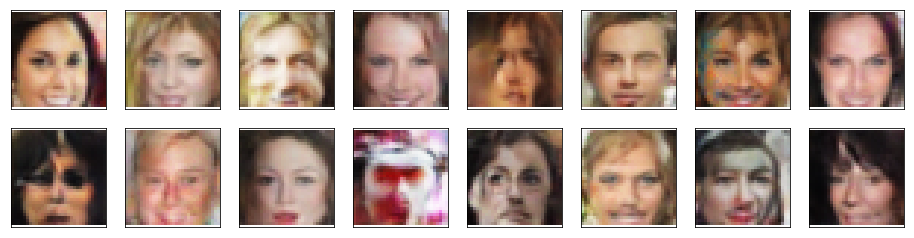

Epoch [22/2000] | Cal[0/1406] | d_loss: 0.1359 | g_loss: 3.0363
Epoch [22/2000] | Cal[50/1406] | d_loss: 0.2213 | g_loss: 2.9955
Epoch [22/2000] | Cal[100/1406] | d_loss: 0.4721 | g_loss: 5.8812
Epoch [22/2000] | Cal[150/1406] | d_loss: 0.2041 | g_loss: 2.8009
Epoch [22/2000] | Cal[200/1406] | d_loss: 0.1380 | g_loss: 3.5568
Epoch [22/2000] | Cal[250/1406] | d_loss: 0.1811 | g_loss: 3.2476
Epoch [22/2000] | Cal[300/1406] | d_loss: 0.1676 | g_loss: 3.2009
Epoch [22/2000] | Cal[350/1406] | d_loss: 0.5456 | g_loss: 1.2366
Epoch [22/2000] | Cal[400/1406] | d_loss: 0.2080 | g_loss: 3.3895
Epoch [22/2000] | Cal[450/1406] | d_loss: 0.2087 | g_loss: 3.9185
Epoch [22/2000] | Cal[500/1406] | d_loss: 0.3157 | g_loss: 1.6211
Epoch [22/2000] | Cal[550/1406] | d_loss: 0.1909 | g_loss: 4.8086
Epoch [22/2000] | Cal[600/1406] | d_loss: 0.1509 | g_loss: 3.8097
Epoch [22/2000] | Cal[650/1406] | d_loss: 0.1528 | g_loss: 3.4536
Epoch [22/2000] | Cal[700/1406] | d_loss: 0.1636 | g_loss: 4.1175
Epoch [22/200

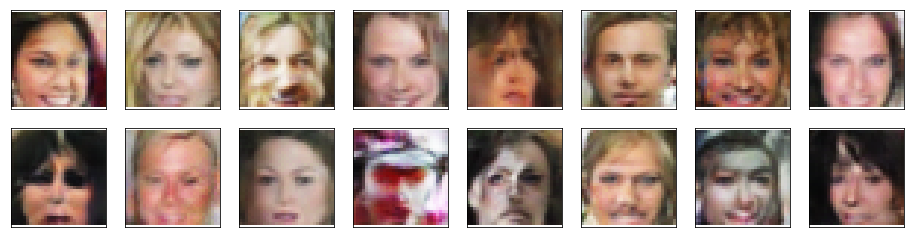

Epoch [23/2000] | Cal[0/1406] | d_loss: 0.3639 | g_loss: 3.9796
Epoch [23/2000] | Cal[50/1406] | d_loss: 0.4039 | g_loss: 3.3657
Epoch [23/2000] | Cal[100/1406] | d_loss: 0.2537 | g_loss: 2.7211
Epoch [23/2000] | Cal[150/1406] | d_loss: 0.3089 | g_loss: 3.1343
Epoch [23/2000] | Cal[200/1406] | d_loss: 0.3683 | g_loss: 4.4983
Epoch [23/2000] | Cal[250/1406] | d_loss: 0.1593 | g_loss: 3.9224
Epoch [23/2000] | Cal[300/1406] | d_loss: 0.4517 | g_loss: 4.0440
Epoch [23/2000] | Cal[350/1406] | d_loss: 0.0928 | g_loss: 3.9087
Epoch [23/2000] | Cal[400/1406] | d_loss: 0.2140 | g_loss: 3.7519
Epoch [23/2000] | Cal[450/1406] | d_loss: 1.4858 | g_loss: 1.4417
Epoch [23/2000] | Cal[500/1406] | d_loss: 0.2862 | g_loss: 3.7947
Epoch [23/2000] | Cal[550/1406] | d_loss: 0.2182 | g_loss: 3.6075
Epoch [23/2000] | Cal[600/1406] | d_loss: 0.9444 | g_loss: 0.4162
Epoch [23/2000] | Cal[650/1406] | d_loss: 0.2293 | g_loss: 2.7708
Epoch [23/2000] | Cal[700/1406] | d_loss: 0.3466 | g_loss: 4.1936
Epoch [23/200

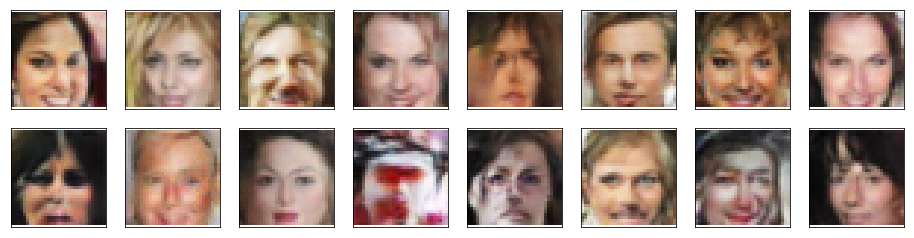

Epoch [24/2000] | Cal[0/1406] | d_loss: 0.1475 | g_loss: 3.3142
Epoch [24/2000] | Cal[50/1406] | d_loss: 0.2800 | g_loss: 2.9235
Epoch [24/2000] | Cal[100/1406] | d_loss: 0.1651 | g_loss: 2.4686
Epoch [24/2000] | Cal[150/1406] | d_loss: 0.1434 | g_loss: 3.5108
Epoch [24/2000] | Cal[200/1406] | d_loss: 0.1975 | g_loss: 3.4624
Epoch [24/2000] | Cal[250/1406] | d_loss: 0.1900 | g_loss: 3.8596
Epoch [24/2000] | Cal[300/1406] | d_loss: 0.3784 | g_loss: 2.0262
Epoch [24/2000] | Cal[350/1406] | d_loss: 0.2020 | g_loss: 4.2400
Epoch [24/2000] | Cal[400/1406] | d_loss: 0.1952 | g_loss: 2.4821
Epoch [24/2000] | Cal[450/1406] | d_loss: 0.1611 | g_loss: 2.9969
Epoch [24/2000] | Cal[500/1406] | d_loss: 0.2036 | g_loss: 3.7868
Epoch [24/2000] | Cal[550/1406] | d_loss: 0.7562 | g_loss: 6.3964
Epoch [24/2000] | Cal[600/1406] | d_loss: 0.1923 | g_loss: 3.5946
Epoch [24/2000] | Cal[650/1406] | d_loss: 0.1203 | g_loss: 3.4855
Epoch [24/2000] | Cal[700/1406] | d_loss: 0.3971 | g_loss: 3.7558
Epoch [24/200

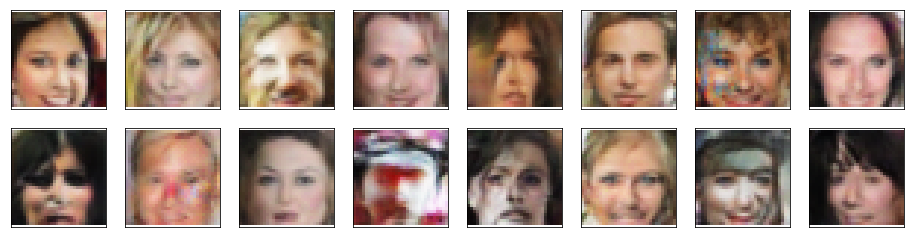

Epoch [25/2000] | Cal[0/1406] | d_loss: 0.9169 | g_loss: 6.1890
Epoch [25/2000] | Cal[50/1406] | d_loss: 0.0891 | g_loss: 3.9794
Epoch [25/2000] | Cal[100/1406] | d_loss: 0.0828 | g_loss: 4.2737
Epoch [25/2000] | Cal[150/1406] | d_loss: 0.0858 | g_loss: 2.7274
Epoch [25/2000] | Cal[200/1406] | d_loss: 0.1623 | g_loss: 4.1967
Epoch [25/2000] | Cal[250/1406] | d_loss: 0.2156 | g_loss: 3.0443
Epoch [25/2000] | Cal[300/1406] | d_loss: 0.2691 | g_loss: 3.6554
Epoch [25/2000] | Cal[350/1406] | d_loss: 0.1700 | g_loss: 4.0424
Epoch [25/2000] | Cal[400/1406] | d_loss: 0.1932 | g_loss: 3.8915
Epoch [25/2000] | Cal[450/1406] | d_loss: 0.0954 | g_loss: 4.1283
Epoch [25/2000] | Cal[500/1406] | d_loss: 0.3641 | g_loss: 5.2996
Epoch [25/2000] | Cal[550/1406] | d_loss: 0.1689 | g_loss: 3.8775
Epoch [25/2000] | Cal[600/1406] | d_loss: 0.2296 | g_loss: 3.7325
Epoch [25/2000] | Cal[650/1406] | d_loss: 0.1273 | g_loss: 3.4611
Epoch [25/2000] | Cal[700/1406] | d_loss: 0.1364 | g_loss: 3.7338
Epoch [25/200

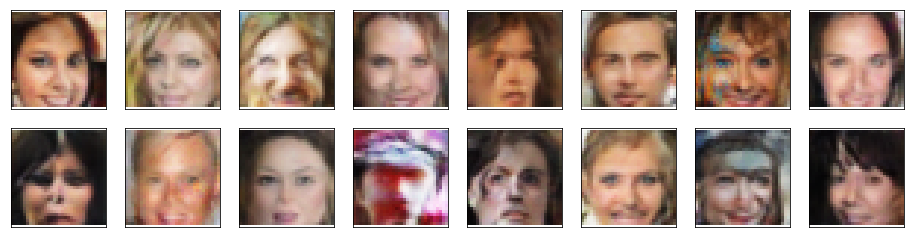

Epoch [26/2000] | Cal[0/1406] | d_loss: 0.2626 | g_loss: 2.8845
Epoch [26/2000] | Cal[50/1406] | d_loss: 0.1306 | g_loss: 3.9099
Epoch [26/2000] | Cal[100/1406] | d_loss: 0.2953 | g_loss: 2.9444
Epoch [26/2000] | Cal[150/1406] | d_loss: 0.1514 | g_loss: 3.2769
Epoch [26/2000] | Cal[200/1406] | d_loss: 0.1679 | g_loss: 3.6180
Epoch [26/2000] | Cal[250/1406] | d_loss: 0.2648 | g_loss: 4.0884
Epoch [26/2000] | Cal[300/1406] | d_loss: 0.2830 | g_loss: 4.5551
Epoch [26/2000] | Cal[350/1406] | d_loss: 0.0699 | g_loss: 4.0503
Epoch [26/2000] | Cal[400/1406] | d_loss: 0.2153 | g_loss: 3.0646
Epoch [26/2000] | Cal[450/1406] | d_loss: 0.0791 | g_loss: 3.8359
Epoch [26/2000] | Cal[500/1406] | d_loss: 0.2358 | g_loss: 3.8998
Epoch [26/2000] | Cal[550/1406] | d_loss: 0.1149 | g_loss: 3.8410
Epoch [26/2000] | Cal[600/1406] | d_loss: 0.1362 | g_loss: 5.4817
Epoch [26/2000] | Cal[650/1406] | d_loss: 0.2632 | g_loss: 5.3820
Epoch [26/2000] | Cal[700/1406] | d_loss: 0.0733 | g_loss: 4.3612
Epoch [26/200

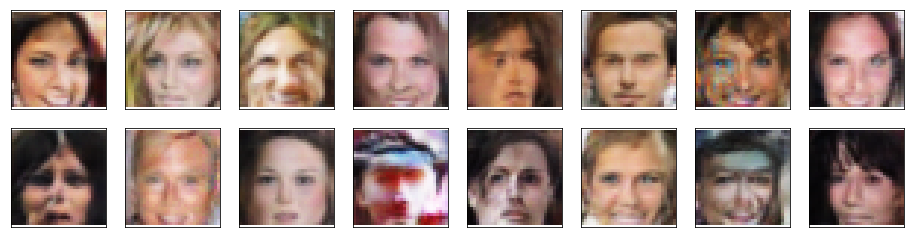

Epoch [27/2000] | Cal[0/1406] | d_loss: 0.1544 | g_loss: 4.5051
Epoch [27/2000] | Cal[50/1406] | d_loss: 0.1023 | g_loss: 4.4319
Epoch [27/2000] | Cal[100/1406] | d_loss: 0.2732 | g_loss: 2.4414
Epoch [27/2000] | Cal[150/1406] | d_loss: 0.2576 | g_loss: 3.6653
Epoch [27/2000] | Cal[200/1406] | d_loss: 0.1832 | g_loss: 4.0074
Epoch [27/2000] | Cal[250/1406] | d_loss: 0.0953 | g_loss: 4.3880
Epoch [27/2000] | Cal[300/1406] | d_loss: 0.1034 | g_loss: 3.9039
Epoch [27/2000] | Cal[350/1406] | d_loss: 0.1923 | g_loss: 3.6267
Epoch [27/2000] | Cal[400/1406] | d_loss: 0.0883 | g_loss: 4.0182
Epoch [27/2000] | Cal[450/1406] | d_loss: 0.3719 | g_loss: 1.7106
Epoch [27/2000] | Cal[500/1406] | d_loss: 0.1128 | g_loss: 3.5088
Epoch [27/2000] | Cal[550/1406] | d_loss: 0.1888 | g_loss: 3.1726
Epoch [27/2000] | Cal[600/1406] | d_loss: 0.1335 | g_loss: 6.3779
Epoch [27/2000] | Cal[650/1406] | d_loss: 0.0459 | g_loss: 5.6667
Epoch [27/2000] | Cal[700/1406] | d_loss: 0.1793 | g_loss: 3.9406
Epoch [27/200

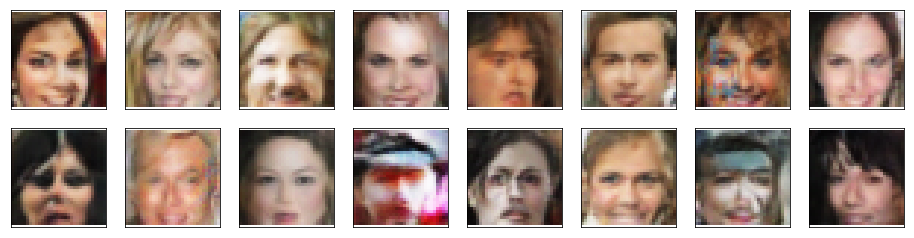

Epoch [28/2000] | Cal[0/1406] | d_loss: 0.2629 | g_loss: 3.0493
Epoch [28/2000] | Cal[50/1406] | d_loss: 0.3767 | g_loss: 4.7749
Epoch [28/2000] | Cal[100/1406] | d_loss: 0.2082 | g_loss: 4.1985
Epoch [28/2000] | Cal[150/1406] | d_loss: 0.2214 | g_loss: 3.5480
Epoch [28/2000] | Cal[200/1406] | d_loss: 0.1879 | g_loss: 4.9615
Epoch [28/2000] | Cal[250/1406] | d_loss: 0.4790 | g_loss: 2.7646
Epoch [28/2000] | Cal[300/1406] | d_loss: 0.2850 | g_loss: 5.7251
Epoch [28/2000] | Cal[350/1406] | d_loss: 0.2235 | g_loss: 3.4963
Epoch [28/2000] | Cal[400/1406] | d_loss: 4.9106 | g_loss: 6.6169
Epoch [28/2000] | Cal[450/1406] | d_loss: 0.1251 | g_loss: 3.7717
Epoch [28/2000] | Cal[500/1406] | d_loss: 0.2348 | g_loss: 3.4953
Epoch [28/2000] | Cal[550/1406] | d_loss: 0.1532 | g_loss: 4.0646
Epoch [28/2000] | Cal[600/1406] | d_loss: 0.2383 | g_loss: 3.7877
Epoch [28/2000] | Cal[650/1406] | d_loss: 0.2406 | g_loss: 4.2105
Epoch [28/2000] | Cal[700/1406] | d_loss: 0.1696 | g_loss: 3.5131
Epoch [28/200

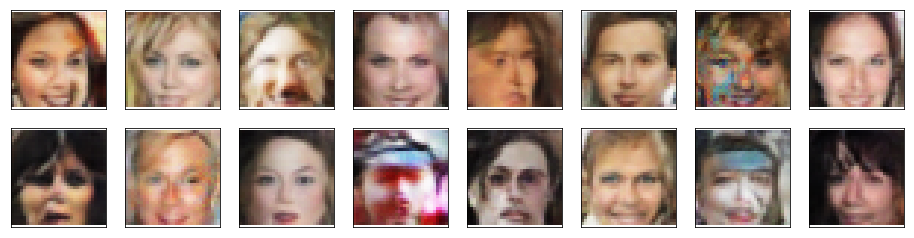

Epoch [29/2000] | Cal[0/1406] | d_loss: 0.0657 | g_loss: 3.9036
Epoch [29/2000] | Cal[50/1406] | d_loss: 0.4216 | g_loss: 2.9195
Epoch [29/2000] | Cal[100/1406] | d_loss: 0.2069 | g_loss: 3.8479
Epoch [29/2000] | Cal[150/1406] | d_loss: 0.2617 | g_loss: 5.0608
Epoch [29/2000] | Cal[200/1406] | d_loss: 0.1114 | g_loss: 5.2283
Epoch [29/2000] | Cal[250/1406] | d_loss: 0.0888 | g_loss: 4.2708
Epoch [29/2000] | Cal[300/1406] | d_loss: 0.3851 | g_loss: 6.0650
Epoch [29/2000] | Cal[350/1406] | d_loss: 0.1571 | g_loss: 4.6700
Epoch [29/2000] | Cal[400/1406] | d_loss: 0.1094 | g_loss: 4.2973
Epoch [29/2000] | Cal[450/1406] | d_loss: 0.0466 | g_loss: 4.2928
Epoch [29/2000] | Cal[500/1406] | d_loss: 0.2623 | g_loss: 2.6715
Epoch [29/2000] | Cal[550/1406] | d_loss: 0.1663 | g_loss: 4.7100
Epoch [29/2000] | Cal[600/1406] | d_loss: 0.1297 | g_loss: 4.2941
Epoch [29/2000] | Cal[650/1406] | d_loss: 0.2088 | g_loss: 4.6604
Epoch [29/2000] | Cal[700/1406] | d_loss: 0.2966 | g_loss: 4.0469
Epoch [29/200

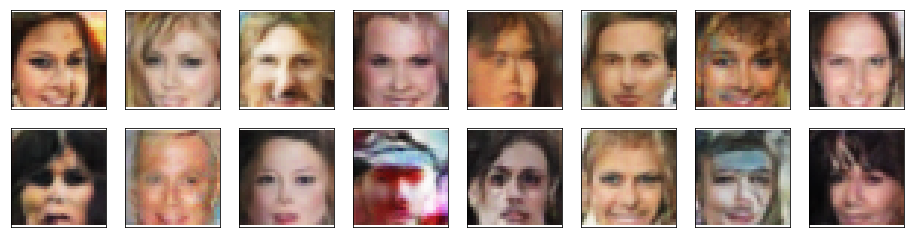

Epoch [30/2000] | Cal[0/1406] | d_loss: 0.2951 | g_loss: 3.6089
Epoch [30/2000] | Cal[50/1406] | d_loss: 0.2337 | g_loss: 3.2912
Epoch [30/2000] | Cal[100/1406] | d_loss: 0.1201 | g_loss: 3.4111
Epoch [30/2000] | Cal[150/1406] | d_loss: 0.0673 | g_loss: 4.6785
Epoch [30/2000] | Cal[200/1406] | d_loss: 0.8893 | g_loss: 4.3217
Epoch [30/2000] | Cal[250/1406] | d_loss: 0.1204 | g_loss: 3.4044
Epoch [30/2000] | Cal[300/1406] | d_loss: 0.3005 | g_loss: 2.8256
Epoch [30/2000] | Cal[350/1406] | d_loss: 0.3300 | g_loss: 2.9681
Epoch [30/2000] | Cal[400/1406] | d_loss: 0.0664 | g_loss: 3.8830
Epoch [30/2000] | Cal[450/1406] | d_loss: 0.0707 | g_loss: 4.4703
Epoch [30/2000] | Cal[500/1406] | d_loss: 0.1692 | g_loss: 3.3772
Epoch [30/2000] | Cal[550/1406] | d_loss: 0.0901 | g_loss: 4.4510
Epoch [30/2000] | Cal[600/1406] | d_loss: 0.1269 | g_loss: 2.8679
Epoch [30/2000] | Cal[650/1406] | d_loss: 0.1378 | g_loss: 3.2940
Epoch [30/2000] | Cal[700/1406] | d_loss: 0.1658 | g_loss: 3.6181
Epoch [30/200

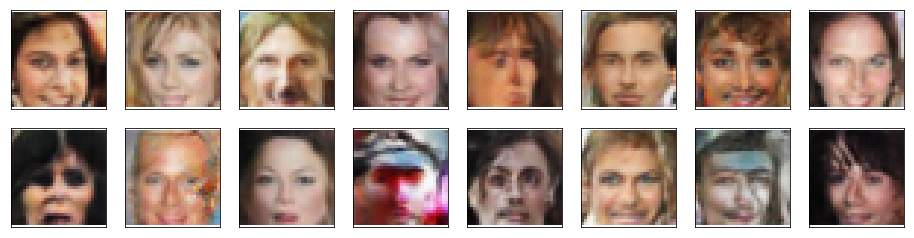

Epoch [31/2000] | Cal[0/1406] | d_loss: 0.2053 | g_loss: 3.5029
Epoch [31/2000] | Cal[50/1406] | d_loss: 0.1109 | g_loss: 4.0345
Epoch [31/2000] | Cal[100/1406] | d_loss: 0.1754 | g_loss: 3.3291
Epoch [31/2000] | Cal[150/1406] | d_loss: 0.0683 | g_loss: 3.8918
Epoch [31/2000] | Cal[200/1406] | d_loss: 0.0906 | g_loss: 4.9145
Epoch [31/2000] | Cal[250/1406] | d_loss: 0.1850 | g_loss: 3.2608
Epoch [31/2000] | Cal[300/1406] | d_loss: 0.1101 | g_loss: 3.5440
Epoch [31/2000] | Cal[350/1406] | d_loss: 0.1248 | g_loss: 3.8154
Epoch [31/2000] | Cal[400/1406] | d_loss: 0.0569 | g_loss: 4.0457
Epoch [31/2000] | Cal[450/1406] | d_loss: 0.0667 | g_loss: 4.4829
Epoch [31/2000] | Cal[500/1406] | d_loss: 0.1024 | g_loss: 3.2490
Epoch [31/2000] | Cal[550/1406] | d_loss: 0.1978 | g_loss: 4.9699
Epoch [31/2000] | Cal[600/1406] | d_loss: 0.2924 | g_loss: 2.8946
Epoch [31/2000] | Cal[650/1406] | d_loss: 0.0766 | g_loss: 4.8789
Epoch [31/2000] | Cal[700/1406] | d_loss: 0.1782 | g_loss: 2.2978
Epoch [31/200

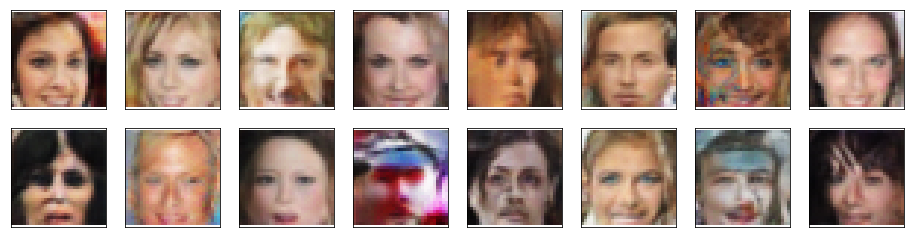

Epoch [32/2000] | Cal[0/1406] | d_loss: 0.3653 | g_loss: 4.1912
Epoch [32/2000] | Cal[50/1406] | d_loss: 0.1673 | g_loss: 3.0629
Epoch [32/2000] | Cal[100/1406] | d_loss: 0.2726 | g_loss: 2.6786
Epoch [32/2000] | Cal[150/1406] | d_loss: 0.2843 | g_loss: 2.1061
Epoch [32/2000] | Cal[200/1406] | d_loss: 0.2024 | g_loss: 4.2615
Epoch [32/2000] | Cal[250/1406] | d_loss: 0.1913 | g_loss: 5.7254
Epoch [32/2000] | Cal[300/1406] | d_loss: 0.1225 | g_loss: 5.0163
Epoch [32/2000] | Cal[350/1406] | d_loss: 3.4723 | g_loss: 11.0188
Epoch [32/2000] | Cal[400/1406] | d_loss: 0.1362 | g_loss: 4.3651
Epoch [32/2000] | Cal[450/1406] | d_loss: 0.0498 | g_loss: 4.1183
Epoch [32/2000] | Cal[500/1406] | d_loss: 0.1265 | g_loss: 3.8076
Epoch [32/2000] | Cal[550/1406] | d_loss: 0.0460 | g_loss: 5.2705
Epoch [32/2000] | Cal[600/1406] | d_loss: 0.2345 | g_loss: 4.8634
Epoch [32/2000] | Cal[650/1406] | d_loss: 0.1977 | g_loss: 4.7150
Epoch [32/2000] | Cal[700/1406] | d_loss: 0.1136 | g_loss: 4.8644
Epoch [32/20

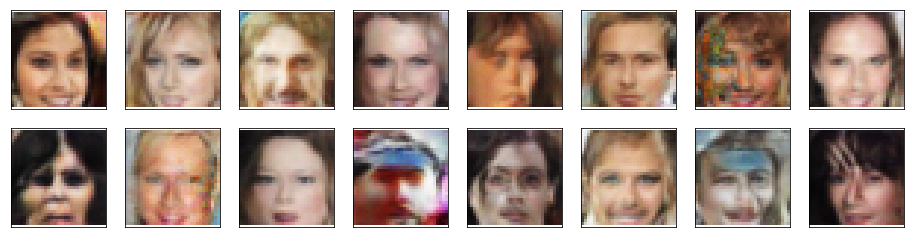

Epoch [33/2000] | Cal[0/1406] | d_loss: 0.2975 | g_loss: 4.0345
Epoch [33/2000] | Cal[50/1406] | d_loss: 0.2125 | g_loss: 4.2131
Epoch [33/2000] | Cal[100/1406] | d_loss: 0.1011 | g_loss: 4.8192
Epoch [33/2000] | Cal[150/1406] | d_loss: 0.1104 | g_loss: 4.6224
Epoch [33/2000] | Cal[200/1406] | d_loss: 0.1607 | g_loss: 4.1595
Epoch [33/2000] | Cal[250/1406] | d_loss: 0.0769 | g_loss: 3.7023
Epoch [33/2000] | Cal[300/1406] | d_loss: 0.0838 | g_loss: 4.4861
Epoch [33/2000] | Cal[350/1406] | d_loss: 0.2320 | g_loss: 4.5429
Epoch [33/2000] | Cal[400/1406] | d_loss: 0.1696 | g_loss: 3.3130
Epoch [33/2000] | Cal[450/1406] | d_loss: 0.1184 | g_loss: 4.3006
Epoch [33/2000] | Cal[500/1406] | d_loss: 0.2335 | g_loss: 4.1338
Epoch [33/2000] | Cal[550/1406] | d_loss: 0.2090 | g_loss: 4.0140
Epoch [33/2000] | Cal[600/1406] | d_loss: 0.1626 | g_loss: 5.3483
Epoch [33/2000] | Cal[650/1406] | d_loss: 0.1154 | g_loss: 3.6825
Epoch [33/2000] | Cal[700/1406] | d_loss: 0.0714 | g_loss: 4.2619
Epoch [33/200

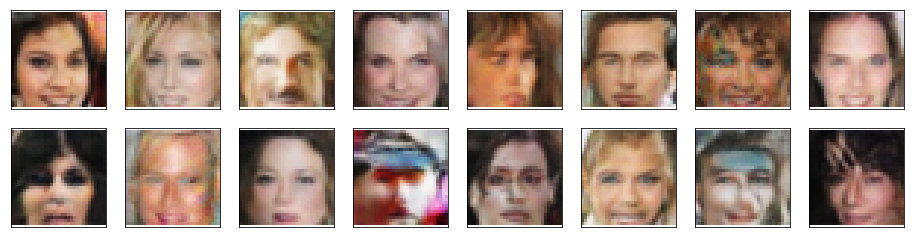

Epoch [34/2000] | Cal[0/1406] | d_loss: 0.3252 | g_loss: 4.1586
Epoch [34/2000] | Cal[50/1406] | d_loss: 0.0707 | g_loss: 3.7463
Epoch [34/2000] | Cal[100/1406] | d_loss: 0.3723 | g_loss: 3.8425
Epoch [34/2000] | Cal[150/1406] | d_loss: 0.0850 | g_loss: 4.7340
Epoch [34/2000] | Cal[200/1406] | d_loss: 0.2964 | g_loss: 6.1590
Epoch [34/2000] | Cal[250/1406] | d_loss: 0.1646 | g_loss: 4.7065
Epoch [34/2000] | Cal[300/1406] | d_loss: 0.1348 | g_loss: 4.2417
Epoch [34/2000] | Cal[350/1406] | d_loss: 0.2380 | g_loss: 5.3684
Epoch [34/2000] | Cal[400/1406] | d_loss: 0.6558 | g_loss: 3.0463
Epoch [34/2000] | Cal[450/1406] | d_loss: 0.1257 | g_loss: 3.4872
Epoch [34/2000] | Cal[500/1406] | d_loss: 0.2180 | g_loss: 4.5559
Epoch [34/2000] | Cal[550/1406] | d_loss: 0.1569 | g_loss: 2.7284
Epoch [34/2000] | Cal[600/1406] | d_loss: 0.0964 | g_loss: 3.1349
Epoch [34/2000] | Cal[650/1406] | d_loss: 0.0541 | g_loss: 3.7576
Epoch [34/2000] | Cal[700/1406] | d_loss: 0.2493 | g_loss: 3.5758
Epoch [34/200

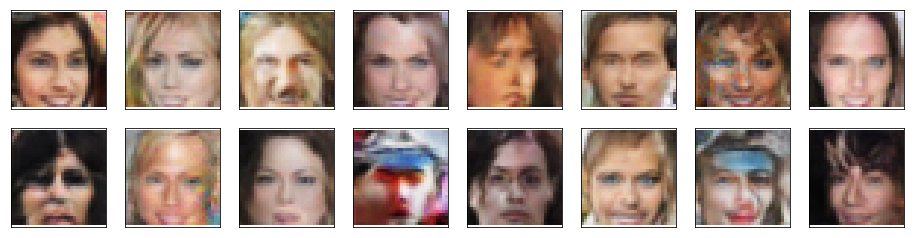

Epoch [35/2000] | Cal[0/1406] | d_loss: 0.1435 | g_loss: 4.9410
Epoch [35/2000] | Cal[50/1406] | d_loss: 0.1210 | g_loss: 4.4835
Epoch [35/2000] | Cal[100/1406] | d_loss: 0.1508 | g_loss: 3.4816
Epoch [35/2000] | Cal[150/1406] | d_loss: 0.2530 | g_loss: 3.7410
Epoch [35/2000] | Cal[200/1406] | d_loss: 0.1551 | g_loss: 5.0155
Epoch [35/2000] | Cal[250/1406] | d_loss: 0.1740 | g_loss: 3.6450
Epoch [35/2000] | Cal[300/1406] | d_loss: 0.0466 | g_loss: 4.4440
Epoch [35/2000] | Cal[350/1406] | d_loss: 0.1398 | g_loss: 3.1365
Epoch [35/2000] | Cal[400/1406] | d_loss: 0.1051 | g_loss: 4.2359
Epoch [35/2000] | Cal[450/1406] | d_loss: 0.0821 | g_loss: 4.5488
Epoch [35/2000] | Cal[500/1406] | d_loss: 0.1182 | g_loss: 3.9208
Epoch [35/2000] | Cal[550/1406] | d_loss: 0.2627 | g_loss: 5.0418
Epoch [35/2000] | Cal[600/1406] | d_loss: 0.1517 | g_loss: 4.5380
Epoch [35/2000] | Cal[650/1406] | d_loss: 0.1090 | g_loss: 4.1053
Epoch [35/2000] | Cal[700/1406] | d_loss: 0.5504 | g_loss: 7.3788
Epoch [35/200

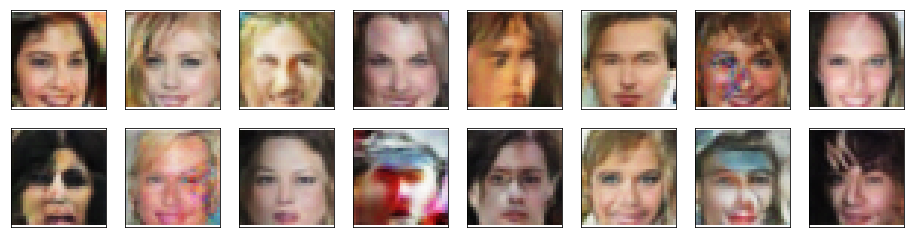

Epoch [36/2000] | Cal[0/1406] | d_loss: 0.3827 | g_loss: 3.0129
Epoch [36/2000] | Cal[50/1406] | d_loss: 0.0982 | g_loss: 4.7115
Epoch [36/2000] | Cal[100/1406] | d_loss: 0.1091 | g_loss: 4.6557
Epoch [36/2000] | Cal[150/1406] | d_loss: 0.0629 | g_loss: 3.3208
Epoch [36/2000] | Cal[200/1406] | d_loss: 0.0655 | g_loss: 4.8460
Epoch [36/2000] | Cal[250/1406] | d_loss: 0.1314 | g_loss: 4.9118
Epoch [36/2000] | Cal[300/1406] | d_loss: 0.0519 | g_loss: 5.0539
Epoch [36/2000] | Cal[350/1406] | d_loss: 0.0519 | g_loss: 5.7523
Epoch [36/2000] | Cal[400/1406] | d_loss: 0.2999 | g_loss: 3.0994
Epoch [36/2000] | Cal[450/1406] | d_loss: 10.1993 | g_loss: 4.8046
Epoch [36/2000] | Cal[500/1406] | d_loss: 0.2168 | g_loss: 5.3843
Epoch [36/2000] | Cal[550/1406] | d_loss: 0.1730 | g_loss: 4.5963
Epoch [36/2000] | Cal[600/1406] | d_loss: 0.0473 | g_loss: 5.4424
Epoch [36/2000] | Cal[650/1406] | d_loss: 0.1255 | g_loss: 5.4173
Epoch [36/2000] | Cal[700/1406] | d_loss: 0.2531 | g_loss: 4.5775
Epoch [36/20

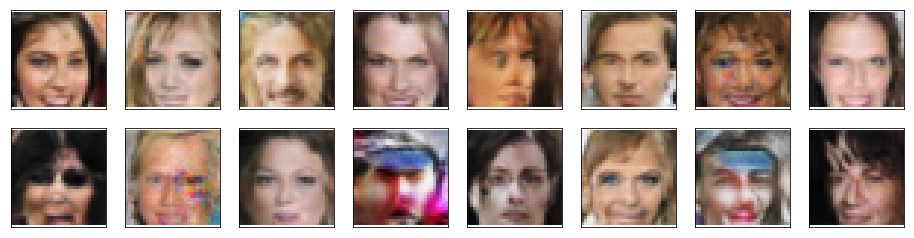

Epoch [37/2000] | Cal[0/1406] | d_loss: 0.1437 | g_loss: 4.8864
Epoch [37/2000] | Cal[50/1406] | d_loss: 0.0472 | g_loss: 4.2633
Epoch [37/2000] | Cal[100/1406] | d_loss: 0.2758 | g_loss: 2.5079
Epoch [37/2000] | Cal[150/1406] | d_loss: 0.1446 | g_loss: 4.7570
Epoch [37/2000] | Cal[200/1406] | d_loss: 0.0686 | g_loss: 5.1248
Epoch [37/2000] | Cal[250/1406] | d_loss: 0.2115 | g_loss: 5.9453
Epoch [37/2000] | Cal[300/1406] | d_loss: 0.2223 | g_loss: 3.5673
Epoch [37/2000] | Cal[350/1406] | d_loss: 0.0862 | g_loss: 5.2891
Epoch [37/2000] | Cal[400/1406] | d_loss: 0.1389 | g_loss: 4.1000
Epoch [37/2000] | Cal[450/1406] | d_loss: 0.0898 | g_loss: 4.0791
Epoch [37/2000] | Cal[500/1406] | d_loss: 0.0789 | g_loss: 4.1011
Epoch [37/2000] | Cal[550/1406] | d_loss: 0.2598 | g_loss: 4.1921
Epoch [37/2000] | Cal[600/1406] | d_loss: 0.1151 | g_loss: 5.1732
Epoch [37/2000] | Cal[650/1406] | d_loss: 0.3401 | g_loss: 4.6293
Epoch [37/2000] | Cal[700/1406] | d_loss: 0.1723 | g_loss: 4.1968
Epoch [37/200

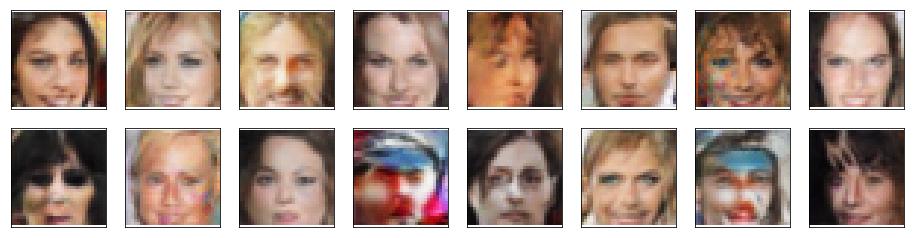

Epoch [38/2000] | Cal[0/1406] | d_loss: 1.2165 | g_loss: 0.3478
Epoch [38/2000] | Cal[50/1406] | d_loss: 0.1920 | g_loss: 4.3170
Epoch [38/2000] | Cal[100/1406] | d_loss: 0.1137 | g_loss: 4.6099
Epoch [38/2000] | Cal[150/1406] | d_loss: 0.1084 | g_loss: 3.6539
Epoch [38/2000] | Cal[200/1406] | d_loss: 0.0592 | g_loss: 5.7216
Epoch [38/2000] | Cal[250/1406] | d_loss: 0.1230 | g_loss: 3.9263
Epoch [38/2000] | Cal[300/1406] | d_loss: 0.2086 | g_loss: 2.3157
Epoch [38/2000] | Cal[350/1406] | d_loss: 0.1347 | g_loss: 3.8037
Epoch [38/2000] | Cal[400/1406] | d_loss: 0.5175 | g_loss: 2.8172
Epoch [38/2000] | Cal[450/1406] | d_loss: 0.1028 | g_loss: 5.3580
Epoch [38/2000] | Cal[500/1406] | d_loss: 0.1617 | g_loss: 3.4243
Epoch [38/2000] | Cal[550/1406] | d_loss: 0.0803 | g_loss: 3.2444
Epoch [38/2000] | Cal[600/1406] | d_loss: 0.0640 | g_loss: 5.1566
Epoch [38/2000] | Cal[650/1406] | d_loss: 0.0546 | g_loss: 5.0972
Epoch [38/2000] | Cal[700/1406] | d_loss: 0.1061 | g_loss: 4.2040
Epoch [38/200

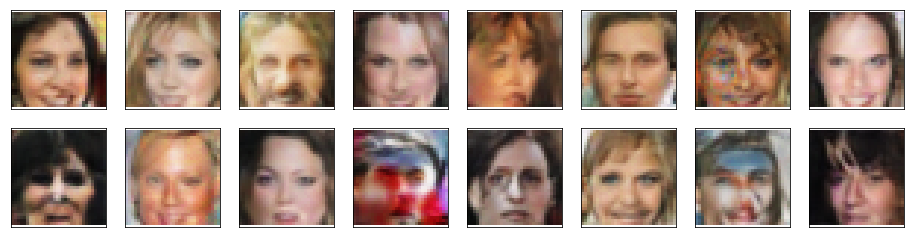

Epoch [39/2000] | Cal[0/1406] | d_loss: 0.2256 | g_loss: 6.6753
Epoch [39/2000] | Cal[50/1406] | d_loss: 0.0502 | g_loss: 5.2228
Epoch [39/2000] | Cal[100/1406] | d_loss: 0.4074 | g_loss: 6.1730
Epoch [39/2000] | Cal[150/1406] | d_loss: 0.1509 | g_loss: 4.8196
Epoch [39/2000] | Cal[200/1406] | d_loss: 0.0576 | g_loss: 4.4402
Epoch [39/2000] | Cal[250/1406] | d_loss: 0.1196 | g_loss: 4.8289
Epoch [39/2000] | Cal[300/1406] | d_loss: 0.1134 | g_loss: 3.6137
Epoch [39/2000] | Cal[350/1406] | d_loss: 0.0603 | g_loss: 4.7811
Epoch [39/2000] | Cal[400/1406] | d_loss: 0.2024 | g_loss: 4.4060
Epoch [39/2000] | Cal[450/1406] | d_loss: 0.1743 | g_loss: 4.0967
Epoch [39/2000] | Cal[500/1406] | d_loss: 0.2581 | g_loss: 4.4599
Epoch [39/2000] | Cal[550/1406] | d_loss: 0.3340 | g_loss: 4.8243
Epoch [39/2000] | Cal[600/1406] | d_loss: 0.0762 | g_loss: 4.8666
Epoch [39/2000] | Cal[650/1406] | d_loss: 0.0894 | g_loss: 4.4696
Epoch [39/2000] | Cal[700/1406] | d_loss: 0.1916 | g_loss: 4.5978
Epoch [39/200

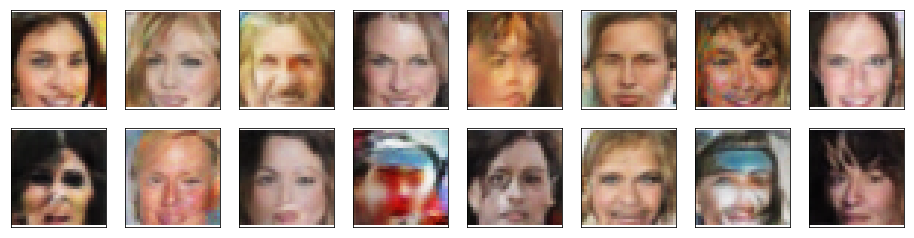

Epoch [40/2000] | Cal[0/1406] | d_loss: 0.2172 | g_loss: 5.7584
Epoch [40/2000] | Cal[50/1406] | d_loss: 0.1137 | g_loss: 2.6367
Epoch [40/2000] | Cal[100/1406] | d_loss: 0.0422 | g_loss: 5.8139
Epoch [40/2000] | Cal[150/1406] | d_loss: 0.0551 | g_loss: 3.1969
Epoch [40/2000] | Cal[200/1406] | d_loss: 0.2040 | g_loss: 3.8380
Epoch [40/2000] | Cal[250/1406] | d_loss: 0.1031 | g_loss: 5.0291
Epoch [40/2000] | Cal[300/1406] | d_loss: 0.1019 | g_loss: 4.3916
Epoch [40/2000] | Cal[350/1406] | d_loss: 0.0915 | g_loss: 3.2393
Epoch [40/2000] | Cal[400/1406] | d_loss: 0.1481 | g_loss: 5.0966
Epoch [40/2000] | Cal[450/1406] | d_loss: 0.1992 | g_loss: 2.9513
Epoch [40/2000] | Cal[500/1406] | d_loss: 0.0670 | g_loss: 5.0078
Epoch [40/2000] | Cal[550/1406] | d_loss: 0.1312 | g_loss: 5.0789
Epoch [40/2000] | Cal[600/1406] | d_loss: 0.4238 | g_loss: 4.9319
Epoch [40/2000] | Cal[650/1406] | d_loss: 0.0619 | g_loss: 5.6977
Epoch [40/2000] | Cal[700/1406] | d_loss: 0.3259 | g_loss: 3.8782
Epoch [40/200

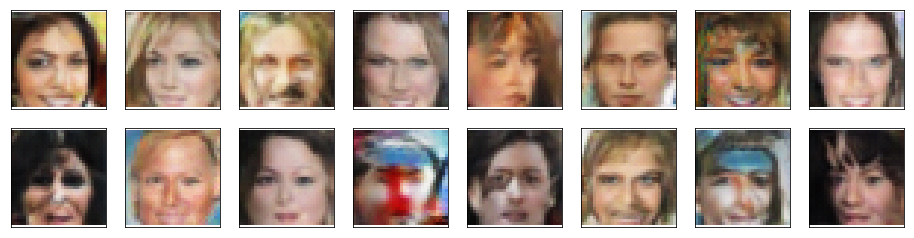

Epoch [41/2000] | Cal[0/1406] | d_loss: 0.0636 | g_loss: 3.4495
Epoch [41/2000] | Cal[50/1406] | d_loss: 0.1140 | g_loss: 3.5717
Epoch [41/2000] | Cal[100/1406] | d_loss: 0.0611 | g_loss: 4.5469
Epoch [41/2000] | Cal[150/1406] | d_loss: 0.0999 | g_loss: 4.8738
Epoch [41/2000] | Cal[200/1406] | d_loss: 0.2975 | g_loss: 6.3231
Epoch [41/2000] | Cal[250/1406] | d_loss: 0.6320 | g_loss: 3.0527
Epoch [41/2000] | Cal[300/1406] | d_loss: 0.1395 | g_loss: 3.2543
Epoch [41/2000] | Cal[350/1406] | d_loss: 0.1644 | g_loss: 4.4917
Epoch [41/2000] | Cal[400/1406] | d_loss: 0.0913 | g_loss: 3.2080
Epoch [41/2000] | Cal[450/1406] | d_loss: 0.3012 | g_loss: 3.5207
Epoch [41/2000] | Cal[500/1406] | d_loss: 0.1429 | g_loss: 2.9031
Epoch [41/2000] | Cal[550/1406] | d_loss: 0.0674 | g_loss: 4.2268
Epoch [41/2000] | Cal[600/1406] | d_loss: 0.0516 | g_loss: 4.7274
Epoch [41/2000] | Cal[650/1406] | d_loss: 0.0913 | g_loss: 4.9173
Epoch [41/2000] | Cal[700/1406] | d_loss: 3.0469 | g_loss: 0.5802
Epoch [41/200

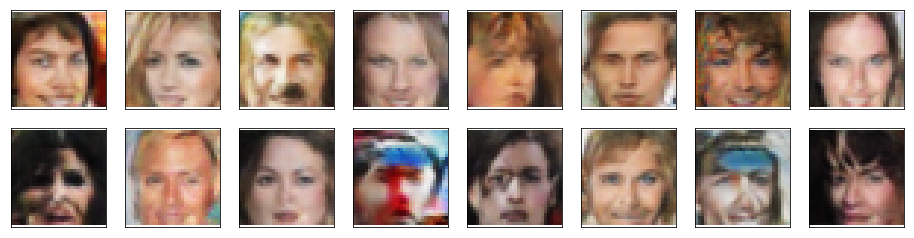

Epoch [42/2000] | Cal[0/1406] | d_loss: 0.0884 | g_loss: 5.4786
Epoch [42/2000] | Cal[50/1406] | d_loss: 0.0452 | g_loss: 4.5394
Epoch [42/2000] | Cal[100/1406] | d_loss: 0.3502 | g_loss: 3.6114
Epoch [42/2000] | Cal[150/1406] | d_loss: 0.2150 | g_loss: 4.3908
Epoch [42/2000] | Cal[200/1406] | d_loss: 0.0448 | g_loss: 5.3795
Epoch [42/2000] | Cal[250/1406] | d_loss: 2.0841 | g_loss: 6.8601
Epoch [42/2000] | Cal[300/1406] | d_loss: 0.1953 | g_loss: 4.7380
Epoch [42/2000] | Cal[350/1406] | d_loss: 0.0513 | g_loss: 4.6948
Epoch [42/2000] | Cal[400/1406] | d_loss: 0.1042 | g_loss: 6.1022
Epoch [42/2000] | Cal[450/1406] | d_loss: 0.1769 | g_loss: 3.9524
Epoch [42/2000] | Cal[500/1406] | d_loss: 0.0724 | g_loss: 4.3125
Epoch [42/2000] | Cal[550/1406] | d_loss: 0.2431 | g_loss: 2.9961
Epoch [42/2000] | Cal[600/1406] | d_loss: 0.0226 | g_loss: 6.0802
Epoch [42/2000] | Cal[650/1406] | d_loss: 0.1729 | g_loss: 4.8099
Epoch [42/2000] | Cal[700/1406] | d_loss: 0.0894 | g_loss: 4.2192
Epoch [42/200

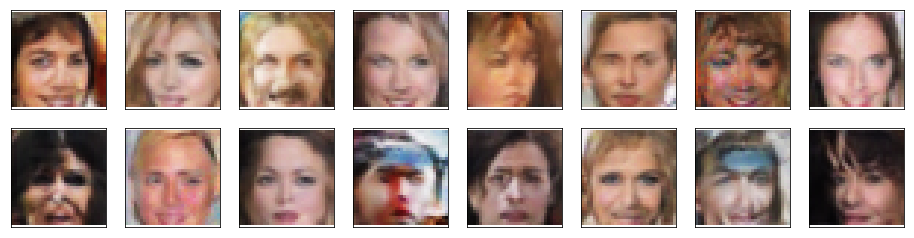

Epoch [43/2000] | Cal[0/1406] | d_loss: 0.1768 | g_loss: 3.4374
Epoch [43/2000] | Cal[50/1406] | d_loss: 0.1687 | g_loss: 5.1814
Epoch [43/2000] | Cal[100/1406] | d_loss: 0.6123 | g_loss: 9.4155
Epoch [43/2000] | Cal[150/1406] | d_loss: 0.1201 | g_loss: 4.0756
Epoch [43/2000] | Cal[200/1406] | d_loss: 0.1018 | g_loss: 5.1372
Epoch [43/2000] | Cal[250/1406] | d_loss: 0.0696 | g_loss: 4.3531
Epoch [43/2000] | Cal[300/1406] | d_loss: 0.0945 | g_loss: 3.3362
Epoch [43/2000] | Cal[350/1406] | d_loss: 0.2552 | g_loss: 2.8265
Epoch [43/2000] | Cal[400/1406] | d_loss: 0.0882 | g_loss: 2.7915
Epoch [43/2000] | Cal[450/1406] | d_loss: 0.0689 | g_loss: 3.3420
Epoch [43/2000] | Cal[500/1406] | d_loss: 0.0514 | g_loss: 4.2537
Epoch [43/2000] | Cal[550/1406] | d_loss: 0.0500 | g_loss: 4.5840
Epoch [43/2000] | Cal[600/1406] | d_loss: 0.0569 | g_loss: 3.4768
Epoch [43/2000] | Cal[650/1406] | d_loss: 0.0749 | g_loss: 4.4449
Epoch [43/2000] | Cal[700/1406] | d_loss: 0.1141 | g_loss: 5.5240
Epoch [43/200

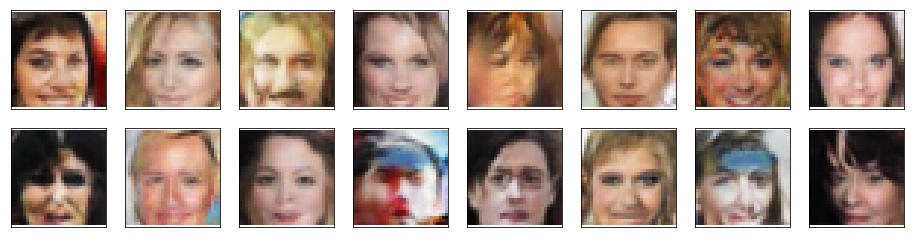

Epoch [44/2000] | Cal[0/1406] | d_loss: 0.0798 | g_loss: 5.8204
Epoch [44/2000] | Cal[50/1406] | d_loss: 0.0280 | g_loss: 5.6057
Epoch [44/2000] | Cal[100/1406] | d_loss: 0.0959 | g_loss: 4.7267
Epoch [44/2000] | Cal[150/1406] | d_loss: 0.0847 | g_loss: 5.1712
Epoch [44/2000] | Cal[200/1406] | d_loss: 0.0523 | g_loss: 4.5725
Epoch [44/2000] | Cal[250/1406] | d_loss: 0.1082 | g_loss: 4.4488
Epoch [44/2000] | Cal[300/1406] | d_loss: 0.2231 | g_loss: 1.5388
Epoch [44/2000] | Cal[350/1406] | d_loss: 1.6136 | g_loss: 5.9676
Epoch [44/2000] | Cal[400/1406] | d_loss: 0.1529 | g_loss: 5.1492
Epoch [44/2000] | Cal[450/1406] | d_loss: 0.1238 | g_loss: 3.8215
Epoch [44/2000] | Cal[500/1406] | d_loss: 0.1621 | g_loss: 4.3996
Epoch [44/2000] | Cal[550/1406] | d_loss: 0.0619 | g_loss: 4.0313
Epoch [44/2000] | Cal[600/1406] | d_loss: 0.1766 | g_loss: 4.3654
Epoch [44/2000] | Cal[650/1406] | d_loss: 0.1348 | g_loss: 3.2678
Epoch [44/2000] | Cal[700/1406] | d_loss: 0.1170 | g_loss: 4.3491
Epoch [44/200

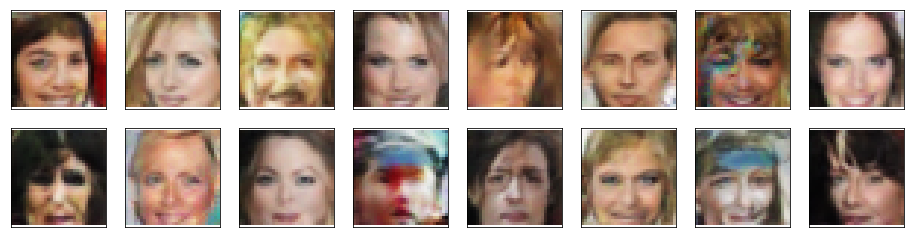

Epoch [45/2000] | Cal[0/1406] | d_loss: 0.2691 | g_loss: 5.9462
Epoch [45/2000] | Cal[50/1406] | d_loss: 2.4877 | g_loss: 6.5217
Epoch [45/2000] | Cal[100/1406] | d_loss: 0.1029 | g_loss: 3.8053
Epoch [45/2000] | Cal[150/1406] | d_loss: 0.0791 | g_loss: 4.2166
Epoch [45/2000] | Cal[200/1406] | d_loss: 0.0226 | g_loss: 4.9746
Epoch [45/2000] | Cal[250/1406] | d_loss: 0.2352 | g_loss: 5.3440
Epoch [45/2000] | Cal[300/1406] | d_loss: 0.1507 | g_loss: 4.4311
Epoch [45/2000] | Cal[350/1406] | d_loss: 0.0854 | g_loss: 5.1470
Epoch [45/2000] | Cal[400/1406] | d_loss: 2.2756 | g_loss: 0.8663
Epoch [45/2000] | Cal[450/1406] | d_loss: 0.0807 | g_loss: 5.7284
Epoch [45/2000] | Cal[500/1406] | d_loss: 0.0622 | g_loss: 4.7705
Epoch [45/2000] | Cal[550/1406] | d_loss: 0.0407 | g_loss: 5.7371
Epoch [45/2000] | Cal[600/1406] | d_loss: 0.1637 | g_loss: 3.4539
Epoch [45/2000] | Cal[650/1406] | d_loss: 1.1217 | g_loss: 6.4070
Epoch [45/2000] | Cal[700/1406] | d_loss: 0.1283 | g_loss: 5.0232
Epoch [45/200

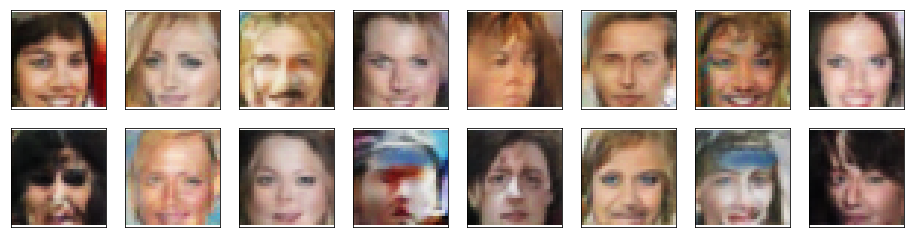

Epoch [46/2000] | Cal[0/1406] | d_loss: 0.2303 | g_loss: 4.5838
Epoch [46/2000] | Cal[50/1406] | d_loss: 0.1173 | g_loss: 6.0095
Epoch [46/2000] | Cal[100/1406] | d_loss: 0.0369 | g_loss: 5.7916
Epoch [46/2000] | Cal[150/1406] | d_loss: 0.0669 | g_loss: 4.7817
Epoch [46/2000] | Cal[200/1406] | d_loss: 0.1753 | g_loss: 5.9738
Epoch [46/2000] | Cal[250/1406] | d_loss: 0.0743 | g_loss: 4.3593
Epoch [46/2000] | Cal[300/1406] | d_loss: 0.1383 | g_loss: 5.4058
Epoch [46/2000] | Cal[350/1406] | d_loss: 0.0794 | g_loss: 4.8655
Epoch [46/2000] | Cal[400/1406] | d_loss: 0.3928 | g_loss: 2.9926
Epoch [46/2000] | Cal[450/1406] | d_loss: 0.1140 | g_loss: 5.6780
Epoch [46/2000] | Cal[500/1406] | d_loss: 0.0962 | g_loss: 3.8919
Epoch [46/2000] | Cal[550/1406] | d_loss: 0.1038 | g_loss: 5.2709
Epoch [46/2000] | Cal[600/1406] | d_loss: 0.0952 | g_loss: 4.5972
Epoch [46/2000] | Cal[650/1406] | d_loss: 0.0285 | g_loss: 3.8745
Epoch [46/2000] | Cal[700/1406] | d_loss: 0.1744 | g_loss: 3.2417
Epoch [46/200

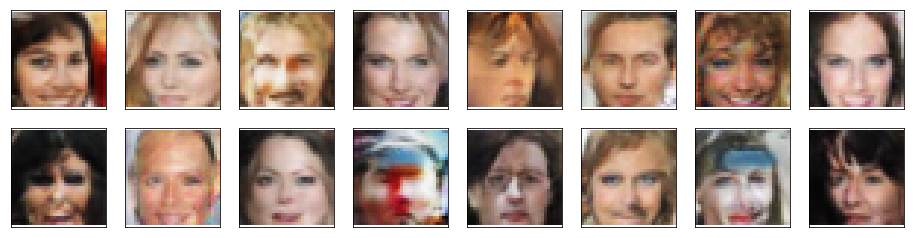

Epoch [47/2000] | Cal[0/1406] | d_loss: 1.6141 | g_loss: 3.9775
Epoch [47/2000] | Cal[50/1406] | d_loss: 0.2952 | g_loss: 3.8550
Epoch [47/2000] | Cal[100/1406] | d_loss: 0.0289 | g_loss: 6.0612
Epoch [47/2000] | Cal[150/1406] | d_loss: 0.0875 | g_loss: 5.0223
Epoch [47/2000] | Cal[200/1406] | d_loss: 0.1971 | g_loss: 5.8683
Epoch [47/2000] | Cal[250/1406] | d_loss: 0.1051 | g_loss: 4.9709
Epoch [47/2000] | Cal[300/1406] | d_loss: 0.0653 | g_loss: 4.7519
Epoch [47/2000] | Cal[350/1406] | d_loss: 0.0649 | g_loss: 5.7654
Epoch [47/2000] | Cal[400/1406] | d_loss: 0.2957 | g_loss: 1.7126
Epoch [47/2000] | Cal[450/1406] | d_loss: 0.0509 | g_loss: 3.8933
Epoch [47/2000] | Cal[500/1406] | d_loss: 0.0443 | g_loss: 5.7045
Epoch [47/2000] | Cal[550/1406] | d_loss: 0.2285 | g_loss: 4.6534
Epoch [47/2000] | Cal[600/1406] | d_loss: 0.1357 | g_loss: 3.0928
Epoch [47/2000] | Cal[650/1406] | d_loss: 0.1070 | g_loss: 4.9204
Epoch [47/2000] | Cal[700/1406] | d_loss: 0.3069 | g_loss: 7.4789
Epoch [47/200

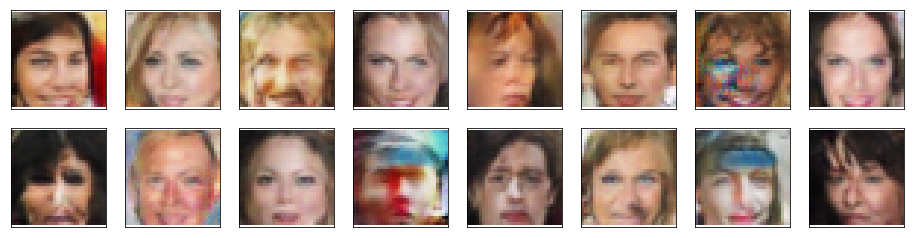

Epoch [48/2000] | Cal[0/1406] | d_loss: 0.0956 | g_loss: 4.0366
Epoch [48/2000] | Cal[50/1406] | d_loss: 0.0906 | g_loss: 5.4355
Epoch [48/2000] | Cal[100/1406] | d_loss: 0.0477 | g_loss: 5.5992
Epoch [48/2000] | Cal[150/1406] | d_loss: 0.4790 | g_loss: 3.8923
Epoch [48/2000] | Cal[200/1406] | d_loss: 0.0722 | g_loss: 4.8448
Epoch [48/2000] | Cal[250/1406] | d_loss: 0.0619 | g_loss: 4.9371
Epoch [48/2000] | Cal[300/1406] | d_loss: 0.0344 | g_loss: 5.4122
Epoch [48/2000] | Cal[350/1406] | d_loss: 0.2390 | g_loss: 3.2370
Epoch [48/2000] | Cal[400/1406] | d_loss: 0.0669 | g_loss: 5.6815
Epoch [48/2000] | Cal[450/1406] | d_loss: 0.0667 | g_loss: 5.3195
Epoch [48/2000] | Cal[500/1406] | d_loss: 0.1291 | g_loss: 5.6029
Epoch [48/2000] | Cal[550/1406] | d_loss: 0.0683 | g_loss: 3.7484
Epoch [48/2000] | Cal[600/1406] | d_loss: 0.0649 | g_loss: 4.3309
Epoch [48/2000] | Cal[650/1406] | d_loss: 0.1070 | g_loss: 5.5008
Epoch [48/2000] | Cal[700/1406] | d_loss: 0.1130 | g_loss: 6.8192
Epoch [48/200

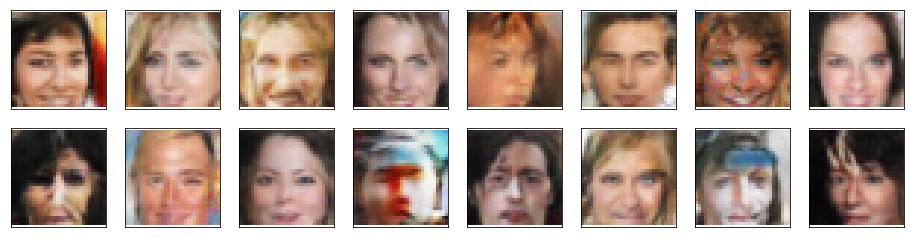

Epoch [49/2000] | Cal[0/1406] | d_loss: 1.0653 | g_loss: 1.8196
Epoch [49/2000] | Cal[50/1406] | d_loss: 0.1593 | g_loss: 4.9936
Epoch [49/2000] | Cal[100/1406] | d_loss: 0.0298 | g_loss: 4.9566
Epoch [49/2000] | Cal[150/1406] | d_loss: 0.0433 | g_loss: 5.1896
Epoch [49/2000] | Cal[200/1406] | d_loss: 0.0643 | g_loss: 3.8844
Epoch [49/2000] | Cal[250/1406] | d_loss: 0.1777 | g_loss: 4.0221
Epoch [49/2000] | Cal[300/1406] | d_loss: 0.0750 | g_loss: 4.0726
Epoch [49/2000] | Cal[350/1406] | d_loss: 0.1127 | g_loss: 3.6546
Epoch [49/2000] | Cal[400/1406] | d_loss: 0.1697 | g_loss: 3.6441
Epoch [49/2000] | Cal[450/1406] | d_loss: 0.2259 | g_loss: 6.0619
Epoch [49/2000] | Cal[500/1406] | d_loss: 0.0266 | g_loss: 5.3051
Epoch [49/2000] | Cal[550/1406] | d_loss: 0.2618 | g_loss: 7.6455
Epoch [49/2000] | Cal[600/1406] | d_loss: 0.0541 | g_loss: 4.5096
Epoch [49/2000] | Cal[650/1406] | d_loss: 0.1246 | g_loss: 5.4307
Epoch [49/2000] | Cal[700/1406] | d_loss: 0.0346 | g_loss: 4.3121
Epoch [49/200

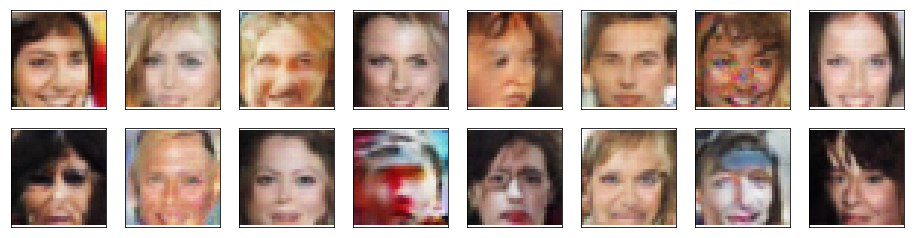

Epoch [50/2000] | Cal[0/1406] | d_loss: 0.6395 | g_loss: 2.9270
Epoch [50/2000] | Cal[50/1406] | d_loss: 0.0736 | g_loss: 6.1253
Epoch [50/2000] | Cal[100/1406] | d_loss: 0.0423 | g_loss: 5.3448
Epoch [50/2000] | Cal[150/1406] | d_loss: 0.0362 | g_loss: 4.8227
Epoch [50/2000] | Cal[200/1406] | d_loss: 0.0444 | g_loss: 6.3108
Epoch [50/2000] | Cal[250/1406] | d_loss: 0.0771 | g_loss: 5.5082
Epoch [50/2000] | Cal[300/1406] | d_loss: 0.1271 | g_loss: 3.8147
Epoch [50/2000] | Cal[350/1406] | d_loss: 0.1542 | g_loss: 3.6451
Epoch [50/2000] | Cal[400/1406] | d_loss: 0.0313 | g_loss: 5.4922
Epoch [50/2000] | Cal[450/1406] | d_loss: 0.1555 | g_loss: 3.8325
Epoch [50/2000] | Cal[500/1406] | d_loss: 0.2527 | g_loss: 5.2399
Epoch [50/2000] | Cal[550/1406] | d_loss: 0.0630 | g_loss: 5.6100
Epoch [50/2000] | Cal[600/1406] | d_loss: 0.1081 | g_loss: 5.7240
Epoch [50/2000] | Cal[650/1406] | d_loss: 0.1449 | g_loss: 4.3538
Epoch [50/2000] | Cal[700/1406] | d_loss: 1.5089 | g_loss: 0.1181
Epoch [50/200

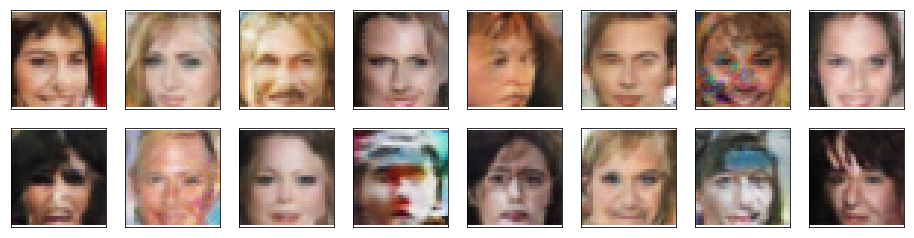

Epoch [51/2000] | Cal[0/1406] | d_loss: 0.2743 | g_loss: 7.0518
Epoch [51/2000] | Cal[50/1406] | d_loss: 0.0773 | g_loss: 4.1059
Epoch [51/2000] | Cal[100/1406] | d_loss: 0.0229 | g_loss: 5.9769
Epoch [51/2000] | Cal[150/1406] | d_loss: 0.0785 | g_loss: 6.1397
Epoch [51/2000] | Cal[200/1406] | d_loss: 0.1201 | g_loss: 3.8894
Epoch [51/2000] | Cal[250/1406] | d_loss: 0.0921 | g_loss: 5.5765
Epoch [51/2000] | Cal[300/1406] | d_loss: 0.1156 | g_loss: 3.9142
Epoch [51/2000] | Cal[350/1406] | d_loss: 0.4914 | g_loss: 3.0085
Epoch [51/2000] | Cal[400/1406] | d_loss: 0.1201 | g_loss: 4.2084
Epoch [51/2000] | Cal[450/1406] | d_loss: 0.0398 | g_loss: 5.0694
Epoch [51/2000] | Cal[500/1406] | d_loss: 0.1528 | g_loss: 4.5532
Epoch [51/2000] | Cal[550/1406] | d_loss: 0.0506 | g_loss: 4.3335
Epoch [51/2000] | Cal[600/1406] | d_loss: 0.1873 | g_loss: 5.0222
Epoch [51/2000] | Cal[650/1406] | d_loss: 0.0672 | g_loss: 4.7442
Epoch [51/2000] | Cal[700/1406] | d_loss: 0.2785 | g_loss: 3.4754
Epoch [51/200

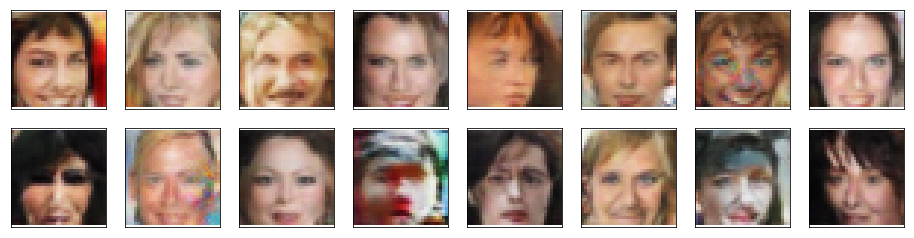

Epoch [52/2000] | Cal[0/1406] | d_loss: 0.0516 | g_loss: 6.1243
Epoch [52/2000] | Cal[50/1406] | d_loss: 0.3231 | g_loss: 4.5921
Epoch [52/2000] | Cal[100/1406] | d_loss: 0.1094 | g_loss: 3.6555
Epoch [52/2000] | Cal[150/1406] | d_loss: 0.0211 | g_loss: 5.6519
Epoch [52/2000] | Cal[200/1406] | d_loss: 0.1376 | g_loss: 4.4111
Epoch [52/2000] | Cal[250/1406] | d_loss: 0.0746 | g_loss: 7.1121
Epoch [52/2000] | Cal[300/1406] | d_loss: 0.1332 | g_loss: 3.4939
Epoch [52/2000] | Cal[350/1406] | d_loss: 1.2080 | g_loss: 2.2395
Epoch [52/2000] | Cal[400/1406] | d_loss: 0.1167 | g_loss: 3.7426
Epoch [52/2000] | Cal[450/1406] | d_loss: 0.0726 | g_loss: 5.2304
Epoch [52/2000] | Cal[500/1406] | d_loss: 0.0437 | g_loss: 5.8358
Epoch [52/2000] | Cal[550/1406] | d_loss: 0.0307 | g_loss: 4.5173
Epoch [52/2000] | Cal[600/1406] | d_loss: 0.1283 | g_loss: 4.7801
Epoch [52/2000] | Cal[650/1406] | d_loss: 1.5760 | g_loss: 9.1993
Epoch [52/2000] | Cal[700/1406] | d_loss: 0.0723 | g_loss: 5.5294
Epoch [52/200

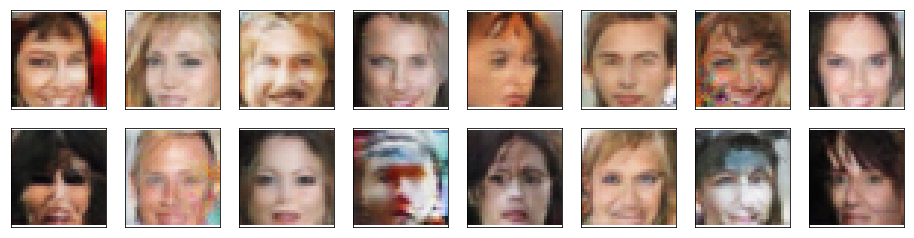

Epoch [53/2000] | Cal[0/1406] | d_loss: 0.1000 | g_loss: 3.7234
Epoch [53/2000] | Cal[50/1406] | d_loss: 0.0797 | g_loss: 5.2964
Epoch [53/2000] | Cal[100/1406] | d_loss: 0.0642 | g_loss: 5.2971
Epoch [53/2000] | Cal[150/1406] | d_loss: 0.0237 | g_loss: 4.9139
Epoch [53/2000] | Cal[200/1406] | d_loss: 0.5514 | g_loss: 1.9407
Epoch [53/2000] | Cal[250/1406] | d_loss: 0.1624 | g_loss: 3.8801
Epoch [53/2000] | Cal[300/1406] | d_loss: 0.0696 | g_loss: 5.9357
Epoch [53/2000] | Cal[350/1406] | d_loss: 0.1309 | g_loss: 4.5967
Epoch [53/2000] | Cal[400/1406] | d_loss: 0.1371 | g_loss: 5.6551
Epoch [53/2000] | Cal[450/1406] | d_loss: 1.1002 | g_loss: 3.7638
Epoch [53/2000] | Cal[500/1406] | d_loss: 0.1804 | g_loss: 4.4727
Epoch [53/2000] | Cal[550/1406] | d_loss: 0.1510 | g_loss: 3.0442
Epoch [53/2000] | Cal[600/1406] | d_loss: 0.0257 | g_loss: 5.3490
Epoch [53/2000] | Cal[650/1406] | d_loss: 0.1268 | g_loss: 3.5072
Epoch [53/2000] | Cal[700/1406] | d_loss: 0.5462 | g_loss: 5.0693
Epoch [53/200

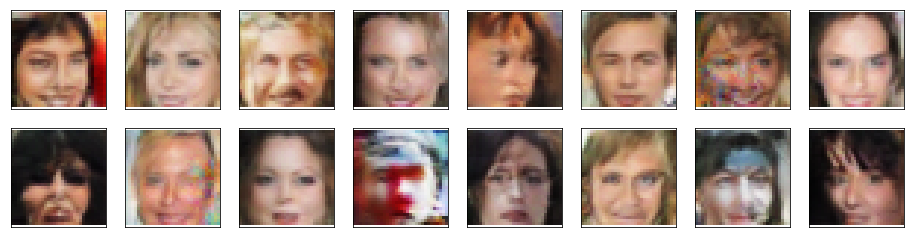

Epoch [54/2000] | Cal[0/1406] | d_loss: 0.3681 | g_loss: 1.4498
Epoch [54/2000] | Cal[50/1406] | d_loss: 0.0343 | g_loss: 5.8650
Epoch [54/2000] | Cal[100/1406] | d_loss: 0.3050 | g_loss: 3.0712
Epoch [54/2000] | Cal[150/1406] | d_loss: 0.0201 | g_loss: 4.9142
Epoch [54/2000] | Cal[200/1406] | d_loss: 0.0409 | g_loss: 4.9995
Epoch [54/2000] | Cal[250/1406] | d_loss: 0.3068 | g_loss: 4.0182
Epoch [54/2000] | Cal[300/1406] | d_loss: 0.0737 | g_loss: 5.0184
Epoch [54/2000] | Cal[350/1406] | d_loss: 0.1626 | g_loss: 5.3283
Epoch [54/2000] | Cal[400/1406] | d_loss: 0.0487 | g_loss: 4.9781
Epoch [54/2000] | Cal[450/1406] | d_loss: 0.0194 | g_loss: 4.1983
Epoch [54/2000] | Cal[500/1406] | d_loss: 0.1158 | g_loss: 4.5995
Epoch [54/2000] | Cal[550/1406] | d_loss: 0.0509 | g_loss: 2.7255
Epoch [54/2000] | Cal[600/1406] | d_loss: 0.1560 | g_loss: 3.9827
Epoch [54/2000] | Cal[650/1406] | d_loss: 0.0804 | g_loss: 4.2976
Epoch [54/2000] | Cal[700/1406] | d_loss: 1.0482 | g_loss: 3.1485
Epoch [54/200

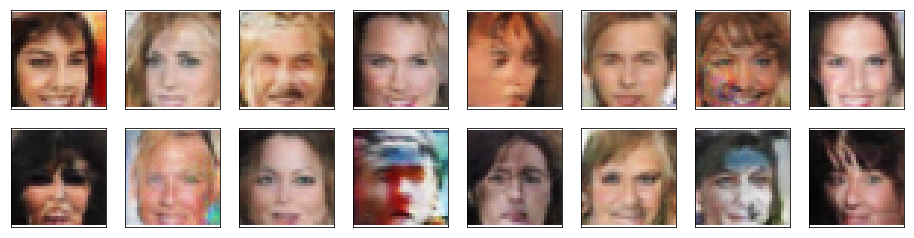

Epoch [55/2000] | Cal[0/1406] | d_loss: 0.1064 | g_loss: 5.6956
Epoch [55/2000] | Cal[50/1406] | d_loss: 0.0402 | g_loss: 6.1221
Epoch [55/2000] | Cal[100/1406] | d_loss: 0.0619 | g_loss: 5.5440
Epoch [55/2000] | Cal[150/1406] | d_loss: 0.0832 | g_loss: 6.3194
Epoch [55/2000] | Cal[200/1406] | d_loss: 0.1534 | g_loss: 4.4727
Epoch [55/2000] | Cal[250/1406] | d_loss: 0.0323 | g_loss: 4.4146
Epoch [55/2000] | Cal[300/1406] | d_loss: 0.0413 | g_loss: 6.0444
Epoch [55/2000] | Cal[350/1406] | d_loss: 0.0304 | g_loss: 5.9788
Epoch [55/2000] | Cal[400/1406] | d_loss: 0.1671 | g_loss: 4.1565
Epoch [55/2000] | Cal[450/1406] | d_loss: 0.0181 | g_loss: 5.6922
Epoch [55/2000] | Cal[500/1406] | d_loss: 0.0396 | g_loss: 5.9080
Epoch [55/2000] | Cal[550/1406] | d_loss: 0.0805 | g_loss: 7.1373
Epoch [55/2000] | Cal[600/1406] | d_loss: 0.1503 | g_loss: 5.8403
Epoch [55/2000] | Cal[650/1406] | d_loss: 0.1021 | g_loss: 5.5188
Epoch [55/2000] | Cal[700/1406] | d_loss: 0.0858 | g_loss: 3.8253
Epoch [55/200

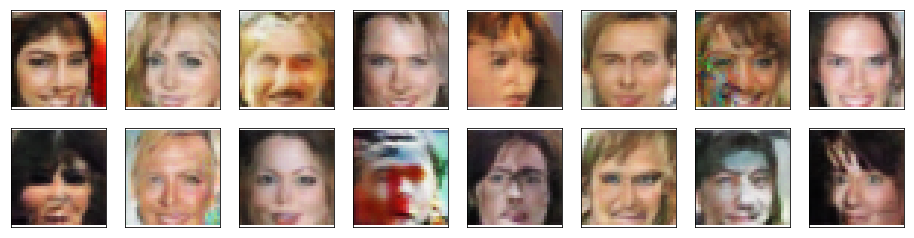

Epoch [56/2000] | Cal[0/1406] | d_loss: 0.9583 | g_loss: 4.4379
Epoch [56/2000] | Cal[50/1406] | d_loss: 0.0584 | g_loss: 5.6673
Epoch [56/2000] | Cal[100/1406] | d_loss: 0.1127 | g_loss: 4.0614
Epoch [56/2000] | Cal[150/1406] | d_loss: 0.0790 | g_loss: 4.5604
Epoch [56/2000] | Cal[200/1406] | d_loss: 0.0748 | g_loss: 6.3671
Epoch [56/2000] | Cal[250/1406] | d_loss: 0.0671 | g_loss: 5.2932
Epoch [56/2000] | Cal[300/1406] | d_loss: 0.0439 | g_loss: 4.6207
Epoch [56/2000] | Cal[350/1406] | d_loss: 0.1065 | g_loss: 5.2276
Epoch [56/2000] | Cal[400/1406] | d_loss: 0.0686 | g_loss: 5.8181
Epoch [56/2000] | Cal[450/1406] | d_loss: 0.1843 | g_loss: 6.4480
Epoch [56/2000] | Cal[500/1406] | d_loss: 0.0406 | g_loss: 6.6519
Epoch [56/2000] | Cal[550/1406] | d_loss: 0.4754 | g_loss: 5.5969
Epoch [56/2000] | Cal[600/1406] | d_loss: 0.0832 | g_loss: 5.1361
Epoch [56/2000] | Cal[650/1406] | d_loss: 0.0463 | g_loss: 5.9087
Epoch [56/2000] | Cal[700/1406] | d_loss: 0.1208 | g_loss: 4.3834
Epoch [56/200

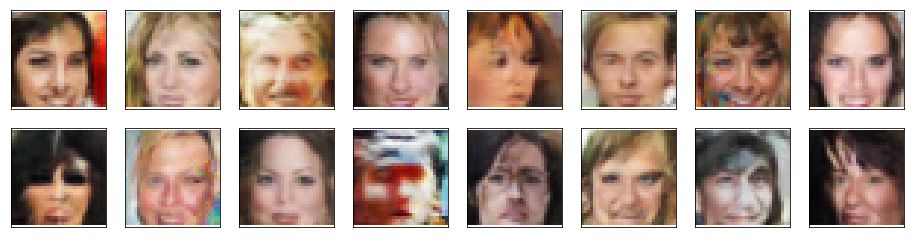

Epoch [57/2000] | Cal[0/1406] | d_loss: 0.3560 | g_loss: 2.6707
Epoch [57/2000] | Cal[50/1406] | d_loss: 0.0365 | g_loss: 5.9389
Epoch [57/2000] | Cal[100/1406] | d_loss: 0.0783 | g_loss: 6.2531
Epoch [57/2000] | Cal[150/1406] | d_loss: 0.0295 | g_loss: 6.4301
Epoch [57/2000] | Cal[200/1406] | d_loss: 0.0505 | g_loss: 4.8872
Epoch [57/2000] | Cal[250/1406] | d_loss: 0.1030 | g_loss: 5.5697
Epoch [57/2000] | Cal[300/1406] | d_loss: 0.0514 | g_loss: 5.6497
Epoch [57/2000] | Cal[350/1406] | d_loss: 1.0606 | g_loss: 8.4327
Epoch [57/2000] | Cal[400/1406] | d_loss: 0.0852 | g_loss: 5.5051
Epoch [57/2000] | Cal[450/1406] | d_loss: 0.1020 | g_loss: 5.0819
Epoch [57/2000] | Cal[500/1406] | d_loss: 0.1037 | g_loss: 5.0639
Epoch [57/2000] | Cal[550/1406] | d_loss: 0.1060 | g_loss: 2.7318
Epoch [57/2000] | Cal[600/1406] | d_loss: 0.1795 | g_loss: 3.1636
Epoch [57/2000] | Cal[650/1406] | d_loss: 0.0288 | g_loss: 5.2130
Epoch [57/2000] | Cal[700/1406] | d_loss: 0.0604 | g_loss: 4.9846
Epoch [57/200

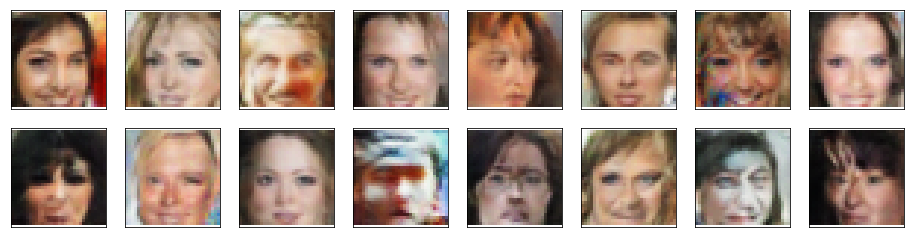

Epoch [58/2000] | Cal[0/1406] | d_loss: 0.1050 | g_loss: 3.8170
Epoch [58/2000] | Cal[50/1406] | d_loss: 0.0701 | g_loss: 5.2767
Epoch [58/2000] | Cal[100/1406] | d_loss: 0.0305 | g_loss: 4.7654
Epoch [58/2000] | Cal[150/1406] | d_loss: 0.0389 | g_loss: 3.7830
Epoch [58/2000] | Cal[200/1406] | d_loss: 0.1099 | g_loss: 5.1700
Epoch [58/2000] | Cal[250/1406] | d_loss: 0.0914 | g_loss: 4.9028
Epoch [58/2000] | Cal[300/1406] | d_loss: 0.0690 | g_loss: 6.5235
Epoch [58/2000] | Cal[350/1406] | d_loss: 0.0889 | g_loss: 4.5652
Epoch [58/2000] | Cal[400/1406] | d_loss: 0.1787 | g_loss: 3.7965
Epoch [58/2000] | Cal[450/1406] | d_loss: 0.0590 | g_loss: 5.5229
Epoch [58/2000] | Cal[500/1406] | d_loss: 0.1217 | g_loss: 3.9356
Epoch [58/2000] | Cal[550/1406] | d_loss: 0.0748 | g_loss: 4.1092
Epoch [58/2000] | Cal[600/1406] | d_loss: 0.0561 | g_loss: 5.9255
Epoch [58/2000] | Cal[650/1406] | d_loss: 3.6303 | g_loss: 0.4050
Epoch [58/2000] | Cal[700/1406] | d_loss: 0.0882 | g_loss: 4.5908
Epoch [58/200

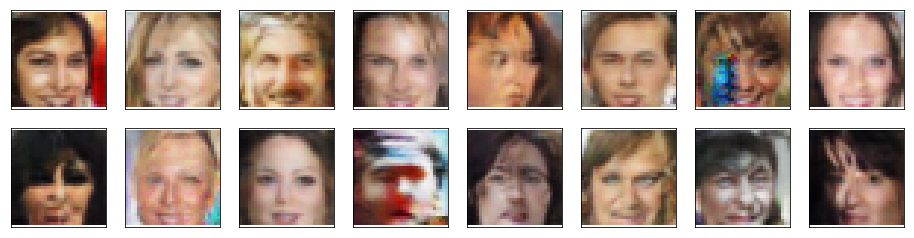

Epoch [59/2000] | Cal[0/1406] | d_loss: 0.1355 | g_loss: 3.3949
Epoch [59/2000] | Cal[50/1406] | d_loss: 0.0822 | g_loss: 4.2981
Epoch [59/2000] | Cal[100/1406] | d_loss: 0.0766 | g_loss: 4.6134
Epoch [59/2000] | Cal[150/1406] | d_loss: 0.0273 | g_loss: 4.6724
Epoch [59/2000] | Cal[200/1406] | d_loss: 0.0640 | g_loss: 5.0044
Epoch [59/2000] | Cal[250/1406] | d_loss: 0.1107 | g_loss: 4.6495
Epoch [59/2000] | Cal[300/1406] | d_loss: 0.1753 | g_loss: 4.9124
Epoch [59/2000] | Cal[350/1406] | d_loss: 0.0815 | g_loss: 4.4147
Epoch [59/2000] | Cal[400/1406] | d_loss: 0.2958 | g_loss: 7.7612
Epoch [59/2000] | Cal[450/1406] | d_loss: 0.0657 | g_loss: 4.8104
Epoch [59/2000] | Cal[500/1406] | d_loss: 0.0830 | g_loss: 6.8309
Epoch [59/2000] | Cal[550/1406] | d_loss: 0.1242 | g_loss: 5.7510
Epoch [59/2000] | Cal[600/1406] | d_loss: 1.0739 | g_loss: 8.0317
Epoch [59/2000] | Cal[650/1406] | d_loss: 0.0672 | g_loss: 4.3589
Epoch [59/2000] | Cal[700/1406] | d_loss: 0.0213 | g_loss: 5.0287
Epoch [59/200

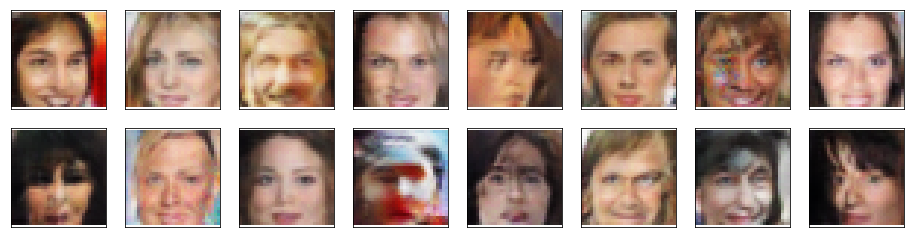

Epoch [60/2000] | Cal[0/1406] | d_loss: 0.1336 | g_loss: 4.6928
Epoch [60/2000] | Cal[50/1406] | d_loss: 0.0328 | g_loss: 4.7886
Epoch [60/2000] | Cal[100/1406] | d_loss: 0.8620 | g_loss: 3.5263
Epoch [60/2000] | Cal[150/1406] | d_loss: 0.0588 | g_loss: 3.6498
Epoch [60/2000] | Cal[200/1406] | d_loss: 0.0660 | g_loss: 5.0289
Epoch [60/2000] | Cal[250/1406] | d_loss: 0.0114 | g_loss: 5.9036
Epoch [60/2000] | Cal[300/1406] | d_loss: 0.1170 | g_loss: 6.1278
Epoch [60/2000] | Cal[350/1406] | d_loss: 0.0974 | g_loss: 5.4744
Epoch [60/2000] | Cal[400/1406] | d_loss: 0.0775 | g_loss: 6.3892
Epoch [60/2000] | Cal[450/1406] | d_loss: 0.0889 | g_loss: 4.3319
Epoch [60/2000] | Cal[500/1406] | d_loss: 0.0633 | g_loss: 4.6807
Epoch [60/2000] | Cal[550/1406] | d_loss: 0.0472 | g_loss: 5.2939
Epoch [60/2000] | Cal[600/1406] | d_loss: 0.1008 | g_loss: 4.0409
Epoch [60/2000] | Cal[650/1406] | d_loss: 0.0269 | g_loss: 6.0859
Epoch [60/2000] | Cal[700/1406] | d_loss: 0.0470 | g_loss: 5.0423
Epoch [60/200

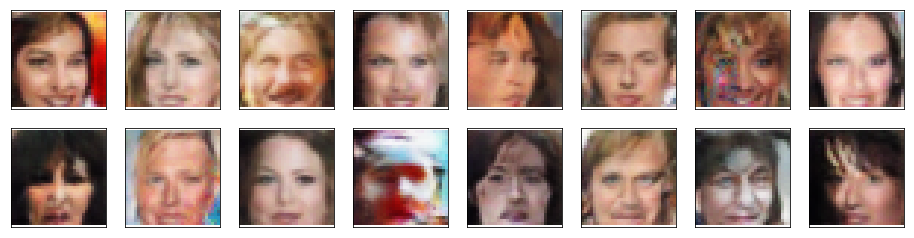

Epoch [61/2000] | Cal[0/1406] | d_loss: 0.1469 | g_loss: 5.6440
Epoch [61/2000] | Cal[50/1406] | d_loss: 0.0432 | g_loss: 5.3859
Epoch [61/2000] | Cal[100/1406] | d_loss: 0.0219 | g_loss: 5.9893
Epoch [61/2000] | Cal[150/1406] | d_loss: 0.0538 | g_loss: 5.1971
Epoch [61/2000] | Cal[200/1406] | d_loss: 0.0295 | g_loss: 4.9389
Epoch [61/2000] | Cal[250/1406] | d_loss: 0.0520 | g_loss: 6.6429
Epoch [61/2000] | Cal[300/1406] | d_loss: 0.1043 | g_loss: 5.5461
Epoch [61/2000] | Cal[350/1406] | d_loss: 0.1107 | g_loss: 5.6988
Epoch [61/2000] | Cal[400/1406] | d_loss: 0.1668 | g_loss: 2.9780
Epoch [61/2000] | Cal[450/1406] | d_loss: 0.0726 | g_loss: 3.9986
Epoch [61/2000] | Cal[500/1406] | d_loss: 0.0564 | g_loss: 5.5440
Epoch [61/2000] | Cal[550/1406] | d_loss: 1.2142 | g_loss: 2.5794
Epoch [61/2000] | Cal[600/1406] | d_loss: 0.0423 | g_loss: 5.5510
Epoch [61/2000] | Cal[650/1406] | d_loss: 0.0407 | g_loss: 4.7656
Epoch [61/2000] | Cal[700/1406] | d_loss: 0.0410 | g_loss: 6.3633
Epoch [61/200

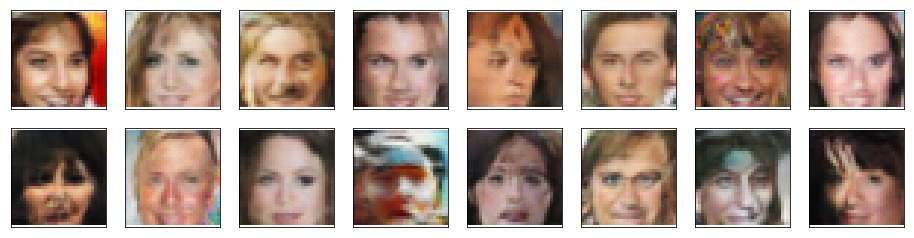

Epoch [62/2000] | Cal[0/1406] | d_loss: 0.0530 | g_loss: 4.4847
Epoch [62/2000] | Cal[50/1406] | d_loss: 0.1343 | g_loss: 4.0798
Epoch [62/2000] | Cal[100/1406] | d_loss: 0.0615 | g_loss: 5.6334
Epoch [62/2000] | Cal[150/1406] | d_loss: 0.3361 | g_loss: 5.5199
Epoch [62/2000] | Cal[200/1406] | d_loss: 0.0589 | g_loss: 6.0783
Epoch [62/2000] | Cal[250/1406] | d_loss: 0.0369 | g_loss: 4.7852
Epoch [62/2000] | Cal[300/1406] | d_loss: 0.1026 | g_loss: 5.2897
Epoch [62/2000] | Cal[350/1406] | d_loss: 0.1110 | g_loss: 5.4320
Epoch [62/2000] | Cal[400/1406] | d_loss: 0.0354 | g_loss: 5.0169
Epoch [62/2000] | Cal[450/1406] | d_loss: 0.1031 | g_loss: 3.5263
Epoch [62/2000] | Cal[500/1406] | d_loss: 0.2569 | g_loss: 4.3745
Epoch [62/2000] | Cal[550/1406] | d_loss: 0.1956 | g_loss: 4.1636
Epoch [62/2000] | Cal[600/1406] | d_loss: 0.0870 | g_loss: 5.6771
Epoch [62/2000] | Cal[650/1406] | d_loss: 0.0349 | g_loss: 6.1094
Epoch [62/2000] | Cal[700/1406] | d_loss: 0.0396 | g_loss: 5.3894
Epoch [62/200

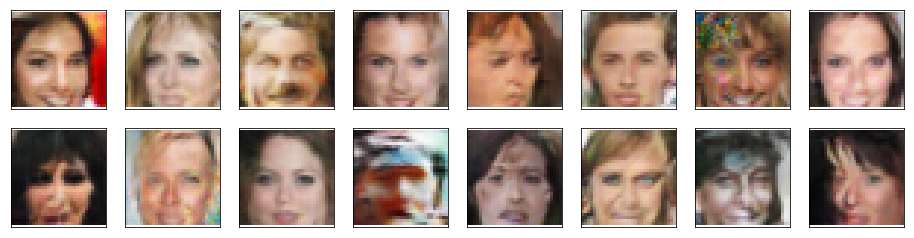

Epoch [63/2000] | Cal[0/1406] | d_loss: 0.0770 | g_loss: 4.7288
Epoch [63/2000] | Cal[50/1406] | d_loss: 0.0414 | g_loss: 5.6067
Epoch [63/2000] | Cal[100/1406] | d_loss: 0.0827 | g_loss: 4.8262
Epoch [63/2000] | Cal[150/1406] | d_loss: 0.0457 | g_loss: 5.6537
Epoch [63/2000] | Cal[200/1406] | d_loss: 0.0344 | g_loss: 5.0819
Epoch [63/2000] | Cal[250/1406] | d_loss: 0.0330 | g_loss: 4.7282
Epoch [63/2000] | Cal[300/1406] | d_loss: 0.2291 | g_loss: 2.9428
Epoch [63/2000] | Cal[350/1406] | d_loss: 0.1296 | g_loss: 5.7994
Epoch [63/2000] | Cal[400/1406] | d_loss: 0.1339 | g_loss: 5.0316
Epoch [63/2000] | Cal[450/1406] | d_loss: 0.9350 | g_loss: 10.2143
Epoch [63/2000] | Cal[500/1406] | d_loss: 0.0970 | g_loss: 4.0628
Epoch [63/2000] | Cal[550/1406] | d_loss: 0.0275 | g_loss: 6.3577
Epoch [63/2000] | Cal[600/1406] | d_loss: 0.0978 | g_loss: 4.7726
Epoch [63/2000] | Cal[650/1406] | d_loss: 0.0461 | g_loss: 3.9532
Epoch [63/2000] | Cal[700/1406] | d_loss: 0.0229 | g_loss: 6.5898
Epoch [63/20

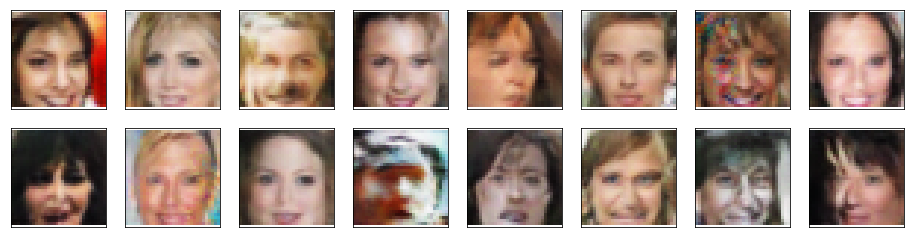

Epoch [64/2000] | Cal[0/1406] | d_loss: 1.7960 | g_loss: 9.5580
Epoch [64/2000] | Cal[50/1406] | d_loss: 0.0627 | g_loss: 4.4438
Epoch [64/2000] | Cal[100/1406] | d_loss: 0.1893 | g_loss: 4.3144
Epoch [64/2000] | Cal[150/1406] | d_loss: 0.0275 | g_loss: 6.2179
Epoch [64/2000] | Cal[200/1406] | d_loss: 0.0371 | g_loss: 5.4609
Epoch [64/2000] | Cal[250/1406] | d_loss: 0.1049 | g_loss: 4.6102
Epoch [64/2000] | Cal[300/1406] | d_loss: 0.0623 | g_loss: 5.6633
Epoch [64/2000] | Cal[350/1406] | d_loss: 0.0400 | g_loss: 4.2677
Epoch [64/2000] | Cal[400/1406] | d_loss: 0.0596 | g_loss: 4.0362
Epoch [64/2000] | Cal[450/1406] | d_loss: 0.1700 | g_loss: 5.9080
Epoch [64/2000] | Cal[500/1406] | d_loss: 0.0411 | g_loss: 6.1495
Epoch [64/2000] | Cal[550/1406] | d_loss: 0.2161 | g_loss: 5.1703
Epoch [64/2000] | Cal[600/1406] | d_loss: 0.2205 | g_loss: 5.2298
Epoch [64/2000] | Cal[650/1406] | d_loss: 0.0398 | g_loss: 4.2822
Epoch [64/2000] | Cal[700/1406] | d_loss: 0.0152 | g_loss: 5.2261
Epoch [64/200

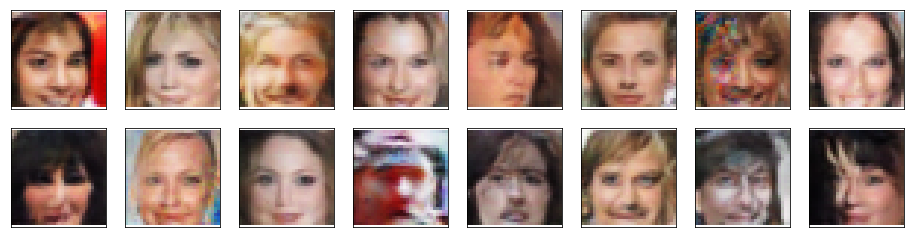

Epoch [65/2000] | Cal[0/1406] | d_loss: 0.0423 | g_loss: 5.3581
Epoch [65/2000] | Cal[50/1406] | d_loss: 0.0332 | g_loss: 5.8325
Epoch [65/2000] | Cal[100/1406] | d_loss: 0.1418 | g_loss: 4.8599
Epoch [65/2000] | Cal[150/1406] | d_loss: 0.0238 | g_loss: 5.8499
Epoch [65/2000] | Cal[200/1406] | d_loss: 10.2159 | g_loss: 6.6795
Epoch [65/2000] | Cal[250/1406] | d_loss: 0.0321 | g_loss: 4.8747
Epoch [65/2000] | Cal[300/1406] | d_loss: 0.1034 | g_loss: 5.0254
Epoch [65/2000] | Cal[350/1406] | d_loss: 0.0375 | g_loss: 6.2303
Epoch [65/2000] | Cal[400/1406] | d_loss: 0.4074 | g_loss: 5.8667
Epoch [65/2000] | Cal[450/1406] | d_loss: 0.0471 | g_loss: 6.1688
Epoch [65/2000] | Cal[500/1406] | d_loss: 0.0637 | g_loss: 4.6250
Epoch [65/2000] | Cal[550/1406] | d_loss: 0.1159 | g_loss: 6.3193
Epoch [65/2000] | Cal[600/1406] | d_loss: 0.0319 | g_loss: 6.7240
Epoch [65/2000] | Cal[650/1406] | d_loss: 0.1725 | g_loss: 3.6135
Epoch [65/2000] | Cal[700/1406] | d_loss: 0.0402 | g_loss: 5.9726
Epoch [65/20

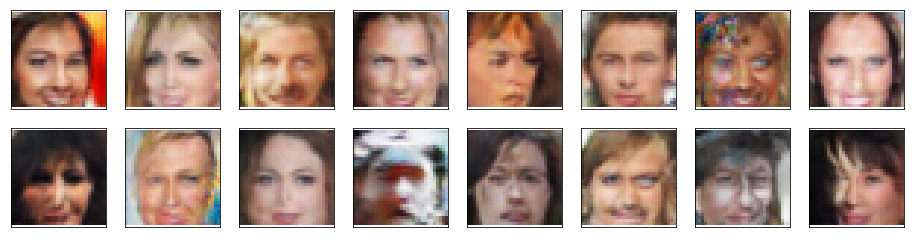

Epoch [66/2000] | Cal[0/1406] | d_loss: 0.0498 | g_loss: 5.6736
Epoch [66/2000] | Cal[50/1406] | d_loss: 0.0315 | g_loss: 5.3884
Epoch [66/2000] | Cal[100/1406] | d_loss: 2.6965 | g_loss: 0.0776
Epoch [66/2000] | Cal[150/1406] | d_loss: 0.1380 | g_loss: 5.1116
Epoch [66/2000] | Cal[200/1406] | d_loss: 0.0622 | g_loss: 5.7301
Epoch [66/2000] | Cal[250/1406] | d_loss: 0.0753 | g_loss: 4.9873
Epoch [66/2000] | Cal[300/1406] | d_loss: 0.0110 | g_loss: 5.6698
Epoch [66/2000] | Cal[350/1406] | d_loss: 0.1832 | g_loss: 3.0836
Epoch [66/2000] | Cal[400/1406] | d_loss: 0.0668 | g_loss: 6.1863
Epoch [66/2000] | Cal[450/1406] | d_loss: 0.0700 | g_loss: 5.5737
Epoch [66/2000] | Cal[500/1406] | d_loss: 0.0347 | g_loss: 4.4892
Epoch [66/2000] | Cal[550/1406] | d_loss: 0.1416 | g_loss: 4.4820
Epoch [66/2000] | Cal[600/1406] | d_loss: 0.2370 | g_loss: 3.8772
Epoch [66/2000] | Cal[650/1406] | d_loss: 0.0404 | g_loss: 4.6487
Epoch [66/2000] | Cal[700/1406] | d_loss: 0.4212 | g_loss: 8.3019
Epoch [66/200

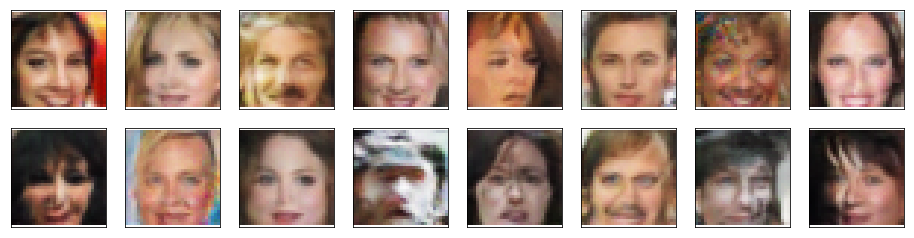

Epoch [67/2000] | Cal[0/1406] | d_loss: 0.0456 | g_loss: 6.3895
Epoch [67/2000] | Cal[50/1406] | d_loss: 0.0471 | g_loss: 5.3543
Epoch [67/2000] | Cal[100/1406] | d_loss: 0.0439 | g_loss: 6.4271
Epoch [67/2000] | Cal[150/1406] | d_loss: 0.0638 | g_loss: 6.3824
Epoch [67/2000] | Cal[200/1406] | d_loss: 0.0555 | g_loss: 4.1356
Epoch [67/2000] | Cal[250/1406] | d_loss: 0.5202 | g_loss: 3.8193
Epoch [67/2000] | Cal[300/1406] | d_loss: 0.0965 | g_loss: 5.8097
Epoch [67/2000] | Cal[350/1406] | d_loss: 0.1894 | g_loss: 5.3910
Epoch [67/2000] | Cal[400/1406] | d_loss: 0.1794 | g_loss: 5.4087
Epoch [67/2000] | Cal[450/1406] | d_loss: 0.0328 | g_loss: 6.0740
Epoch [67/2000] | Cal[500/1406] | d_loss: 0.0275 | g_loss: 7.3391
Epoch [67/2000] | Cal[550/1406] | d_loss: 0.0794 | g_loss: 5.2847
Epoch [67/2000] | Cal[600/1406] | d_loss: 0.0644 | g_loss: 4.0143
Epoch [67/2000] | Cal[650/1406] | d_loss: 0.1348 | g_loss: 4.9313
Epoch [67/2000] | Cal[700/1406] | d_loss: 0.1635 | g_loss: 3.7210
Epoch [67/200

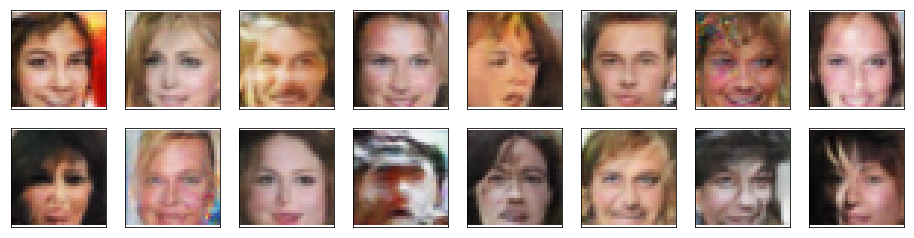

Epoch [68/2000] | Cal[0/1406] | d_loss: 0.1152 | g_loss: 5.4267
Epoch [68/2000] | Cal[50/1406] | d_loss: 0.5422 | g_loss: 3.8155
Epoch [68/2000] | Cal[100/1406] | d_loss: 0.1308 | g_loss: 5.9813
Epoch [68/2000] | Cal[150/1406] | d_loss: 0.0281 | g_loss: 5.6424
Epoch [68/2000] | Cal[200/1406] | d_loss: 0.1422 | g_loss: 6.7775
Epoch [68/2000] | Cal[250/1406] | d_loss: 0.0788 | g_loss: 6.1358
Epoch [68/2000] | Cal[300/1406] | d_loss: 0.0479 | g_loss: 6.4392
Epoch [68/2000] | Cal[350/1406] | d_loss: 0.0338 | g_loss: 4.0175
Epoch [68/2000] | Cal[400/1406] | d_loss: 0.0259 | g_loss: 5.1232
Epoch [68/2000] | Cal[450/1406] | d_loss: 0.1131 | g_loss: 6.2592
Epoch [68/2000] | Cal[500/1406] | d_loss: 0.1044 | g_loss: 5.5535
Epoch [68/2000] | Cal[550/1406] | d_loss: 0.0646 | g_loss: 4.8202
Epoch [68/2000] | Cal[600/1406] | d_loss: 0.1200 | g_loss: 7.5892
Epoch [68/2000] | Cal[650/1406] | d_loss: 0.1510 | g_loss: 6.2837
Epoch [68/2000] | Cal[700/1406] | d_loss: 0.0716 | g_loss: 5.3446
Epoch [68/200

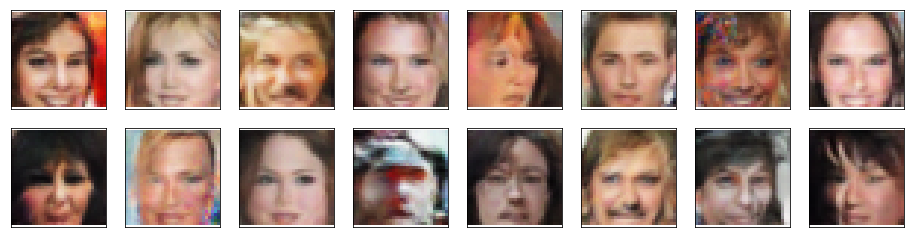

Epoch [69/2000] | Cal[0/1406] | d_loss: 0.1529 | g_loss: 5.4339
Epoch [69/2000] | Cal[50/1406] | d_loss: 0.0254 | g_loss: 5.8253
Epoch [69/2000] | Cal[100/1406] | d_loss: 0.1068 | g_loss: 4.6203
Epoch [69/2000] | Cal[150/1406] | d_loss: 0.0879 | g_loss: 6.3291
Epoch [69/2000] | Cal[200/1406] | d_loss: 0.0574 | g_loss: 4.5718
Epoch [69/2000] | Cal[250/1406] | d_loss: 0.0912 | g_loss: 5.5465
Epoch [69/2000] | Cal[300/1406] | d_loss: 0.0710 | g_loss: 4.0265
Epoch [69/2000] | Cal[350/1406] | d_loss: 0.1101 | g_loss: 4.9182
Epoch [69/2000] | Cal[400/1406] | d_loss: 0.0470 | g_loss: 6.1509
Epoch [69/2000] | Cal[450/1406] | d_loss: 0.0411 | g_loss: 6.5686
Epoch [69/2000] | Cal[500/1406] | d_loss: 0.2347 | g_loss: 5.2937
Epoch [69/2000] | Cal[550/1406] | d_loss: 0.1304 | g_loss: 5.0256
Epoch [69/2000] | Cal[600/1406] | d_loss: 0.0502 | g_loss: 5.5222
Epoch [69/2000] | Cal[650/1406] | d_loss: 0.0330 | g_loss: 5.1804
Epoch [69/2000] | Cal[700/1406] | d_loss: 0.1212 | g_loss: 4.5074
Epoch [69/200

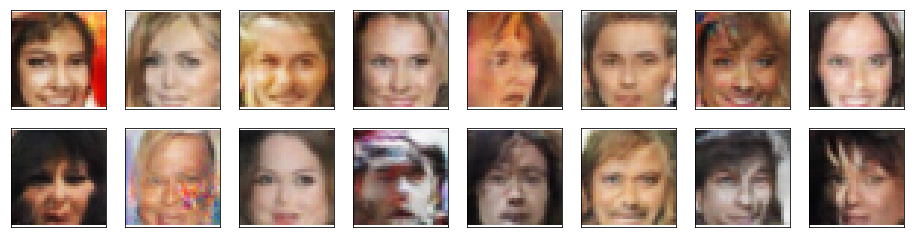

Epoch [70/2000] | Cal[0/1406] | d_loss: 0.2044 | g_loss: 7.6978
Epoch [70/2000] | Cal[50/1406] | d_loss: 0.0794 | g_loss: 6.1217
Epoch [70/2000] | Cal[100/1406] | d_loss: 0.1128 | g_loss: 3.7425
Epoch [70/2000] | Cal[150/1406] | d_loss: 0.0767 | g_loss: 4.5082
Epoch [70/2000] | Cal[200/1406] | d_loss: 0.0300 | g_loss: 4.5038
Epoch [70/2000] | Cal[250/1406] | d_loss: 3.7194 | g_loss: 1.7867
Epoch [70/2000] | Cal[300/1406] | d_loss: 0.0728 | g_loss: 6.6604
Epoch [70/2000] | Cal[350/1406] | d_loss: 0.0277 | g_loss: 5.0008
Epoch [70/2000] | Cal[400/1406] | d_loss: 0.6181 | g_loss: 10.3123
Epoch [70/2000] | Cal[450/1406] | d_loss: 0.0544 | g_loss: 5.0974
Epoch [70/2000] | Cal[500/1406] | d_loss: 0.0376 | g_loss: 5.4672
Epoch [70/2000] | Cal[550/1406] | d_loss: 0.1119 | g_loss: 5.7540
Epoch [70/2000] | Cal[600/1406] | d_loss: 0.0421 | g_loss: 6.4203
Epoch [70/2000] | Cal[650/1406] | d_loss: 0.5703 | g_loss: 4.0801
Epoch [70/2000] | Cal[700/1406] | d_loss: 0.0889 | g_loss: 6.1364
Epoch [70/20

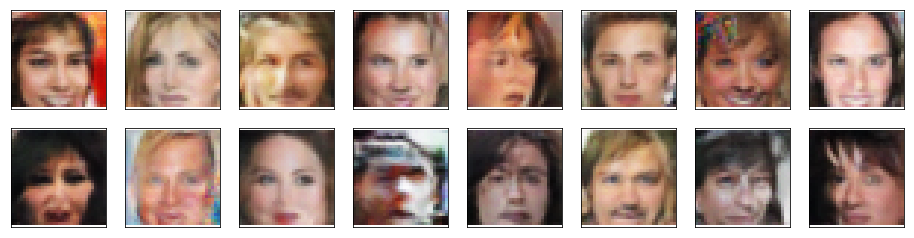

Epoch [71/2000] | Cal[0/1406] | d_loss: 0.0704 | g_loss: 5.4446
Epoch [71/2000] | Cal[50/1406] | d_loss: 0.2555 | g_loss: 2.7599
Epoch [71/2000] | Cal[100/1406] | d_loss: 0.0540 | g_loss: 3.8435
Epoch [71/2000] | Cal[150/1406] | d_loss: 0.0665 | g_loss: 4.6173
Epoch [71/2000] | Cal[200/1406] | d_loss: 0.1157 | g_loss: 3.5317
Epoch [71/2000] | Cal[250/1406] | d_loss: 0.1076 | g_loss: 3.3118
Epoch [71/2000] | Cal[300/1406] | d_loss: 0.1827 | g_loss: 6.0785
Epoch [71/2000] | Cal[350/1406] | d_loss: 0.1186 | g_loss: 3.9185
Epoch [71/2000] | Cal[400/1406] | d_loss: 0.0538 | g_loss: 4.8528
Epoch [71/2000] | Cal[450/1406] | d_loss: 0.1836 | g_loss: 6.0062
Epoch [71/2000] | Cal[500/1406] | d_loss: 0.0824 | g_loss: 5.6786
Epoch [71/2000] | Cal[550/1406] | d_loss: 0.0353 | g_loss: 4.7184
Epoch [71/2000] | Cal[600/1406] | d_loss: 0.0260 | g_loss: 5.9776
Epoch [71/2000] | Cal[650/1406] | d_loss: 0.9181 | g_loss: 3.1354
Epoch [71/2000] | Cal[700/1406] | d_loss: 0.0696 | g_loss: 4.9773
Epoch [71/200

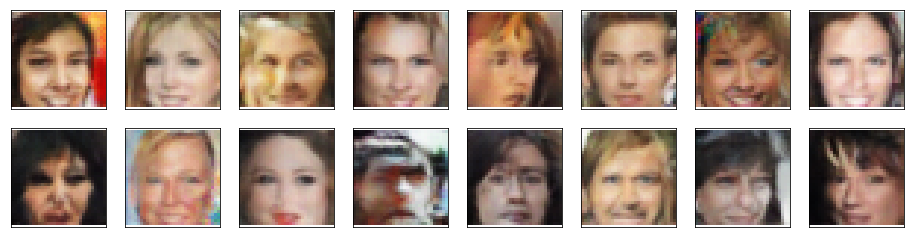

Epoch [72/2000] | Cal[0/1406] | d_loss: 0.2810 | g_loss: 4.7859
Epoch [72/2000] | Cal[50/1406] | d_loss: 0.0726 | g_loss: 5.1636
Epoch [72/2000] | Cal[100/1406] | d_loss: 0.0291 | g_loss: 6.4317
Epoch [72/2000] | Cal[150/1406] | d_loss: 0.0348 | g_loss: 6.6021
Epoch [72/2000] | Cal[200/1406] | d_loss: 0.0756 | g_loss: 6.4241
Epoch [72/2000] | Cal[250/1406] | d_loss: 0.0594 | g_loss: 4.4612
Epoch [72/2000] | Cal[300/1406] | d_loss: 0.1635 | g_loss: 7.1613
Epoch [72/2000] | Cal[350/1406] | d_loss: 0.1318 | g_loss: 4.5313
Epoch [72/2000] | Cal[400/1406] | d_loss: 4.8568 | g_loss: 0.3271
Epoch [72/2000] | Cal[450/1406] | d_loss: 0.0661 | g_loss: 5.0916
Epoch [72/2000] | Cal[500/1406] | d_loss: 0.0222 | g_loss: 6.0681
Epoch [72/2000] | Cal[550/1406] | d_loss: 0.0340 | g_loss: 5.3382
Epoch [72/2000] | Cal[600/1406] | d_loss: 0.0778 | g_loss: 5.9374
Epoch [72/2000] | Cal[650/1406] | d_loss: 0.5053 | g_loss: 1.7843
Epoch [72/2000] | Cal[700/1406] | d_loss: 0.0130 | g_loss: 6.5339
Epoch [72/200

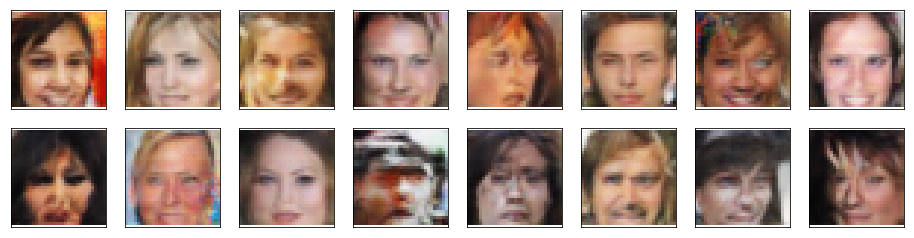

Epoch [73/2000] | Cal[0/1406] | d_loss: 0.0433 | g_loss: 5.5505
Epoch [73/2000] | Cal[50/1406] | d_loss: 0.0245 | g_loss: 5.4958
Epoch [73/2000] | Cal[100/1406] | d_loss: 0.1204 | g_loss: 2.6368
Epoch [73/2000] | Cal[150/1406] | d_loss: 0.0655 | g_loss: 5.1234
Epoch [73/2000] | Cal[200/1406] | d_loss: 0.0473 | g_loss: 7.2534
Epoch [73/2000] | Cal[250/1406] | d_loss: 0.0489 | g_loss: 5.8882
Epoch [73/2000] | Cal[300/1406] | d_loss: 0.0381 | g_loss: 6.7347
Epoch [73/2000] | Cal[350/1406] | d_loss: 0.0415 | g_loss: 6.3240
Epoch [73/2000] | Cal[400/1406] | d_loss: 0.1504 | g_loss: 5.2616
Epoch [73/2000] | Cal[450/1406] | d_loss: 0.0658 | g_loss: 4.5384
Epoch [73/2000] | Cal[500/1406] | d_loss: 0.2098 | g_loss: 4.3897
Epoch [73/2000] | Cal[550/1406] | d_loss: 0.0865 | g_loss: 6.1182
Epoch [73/2000] | Cal[600/1406] | d_loss: 0.0982 | g_loss: 4.1615
Epoch [73/2000] | Cal[650/1406] | d_loss: 0.0713 | g_loss: 6.4980
Epoch [73/2000] | Cal[700/1406] | d_loss: 0.1439 | g_loss: 7.1497
Epoch [73/200

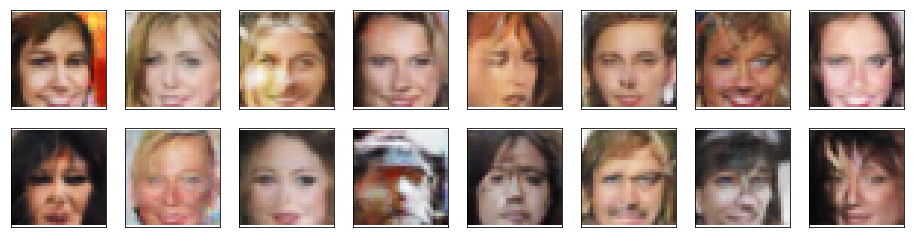

Epoch [74/2000] | Cal[0/1406] | d_loss: 0.2474 | g_loss: 6.6937
Epoch [74/2000] | Cal[50/1406] | d_loss: 0.1772 | g_loss: 4.6705
Epoch [74/2000] | Cal[100/1406] | d_loss: 0.0487 | g_loss: 5.5410
Epoch [74/2000] | Cal[150/1406] | d_loss: 0.0241 | g_loss: 7.2262
Epoch [74/2000] | Cal[200/1406] | d_loss: 0.0361 | g_loss: 5.3592
Epoch [74/2000] | Cal[250/1406] | d_loss: 0.0149 | g_loss: 6.0772
Epoch [74/2000] | Cal[300/1406] | d_loss: 0.0263 | g_loss: 6.2346
Epoch [74/2000] | Cal[350/1406] | d_loss: 0.1491 | g_loss: 4.5931
Epoch [74/2000] | Cal[400/1406] | d_loss: 0.0623 | g_loss: 4.6292
Epoch [74/2000] | Cal[450/1406] | d_loss: 0.0236 | g_loss: 6.1095
Epoch [74/2000] | Cal[500/1406] | d_loss: 0.0379 | g_loss: 6.3190
Epoch [74/2000] | Cal[550/1406] | d_loss: 0.0405 | g_loss: 5.5153
Epoch [74/2000] | Cal[600/1406] | d_loss: 0.0959 | g_loss: 5.7187
Epoch [74/2000] | Cal[650/1406] | d_loss: 0.0864 | g_loss: 6.2882
Epoch [74/2000] | Cal[700/1406] | d_loss: 0.0725 | g_loss: 5.5330
Epoch [74/200

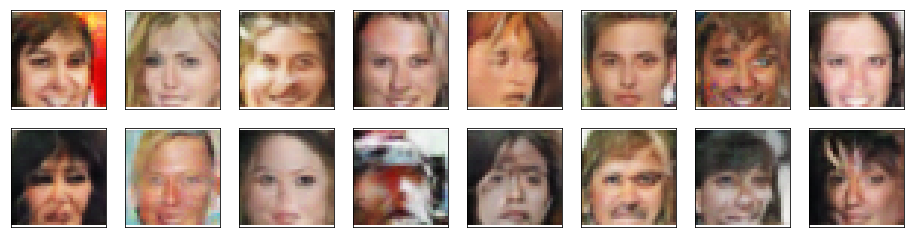

Epoch [75/2000] | Cal[0/1406] | d_loss: 0.0512 | g_loss: 4.7436
Epoch [75/2000] | Cal[50/1406] | d_loss: 0.0375 | g_loss: 5.0425
Epoch [75/2000] | Cal[100/1406] | d_loss: 0.1116 | g_loss: 5.8328
Epoch [75/2000] | Cal[150/1406] | d_loss: 0.0556 | g_loss: 5.5784
Epoch [75/2000] | Cal[200/1406] | d_loss: 0.0453 | g_loss: 6.1296
Epoch [75/2000] | Cal[250/1406] | d_loss: 0.0678 | g_loss: 3.6961
Epoch [75/2000] | Cal[300/1406] | d_loss: 0.0136 | g_loss: 7.8816
Epoch [75/2000] | Cal[350/1406] | d_loss: 7.5582 | g_loss: 9.4662
Epoch [75/2000] | Cal[400/1406] | d_loss: 0.1373 | g_loss: 5.0949
Epoch [75/2000] | Cal[450/1406] | d_loss: 0.0698 | g_loss: 5.9925
Epoch [75/2000] | Cal[500/1406] | d_loss: 0.1274 | g_loss: 4.8656
Epoch [75/2000] | Cal[550/1406] | d_loss: 0.0924 | g_loss: 6.4947
Epoch [75/2000] | Cal[600/1406] | d_loss: 0.0476 | g_loss: 5.4301
Epoch [75/2000] | Cal[650/1406] | d_loss: 0.1047 | g_loss: 6.2481
Epoch [75/2000] | Cal[700/1406] | d_loss: 0.6923 | g_loss: 4.6173
Epoch [75/200

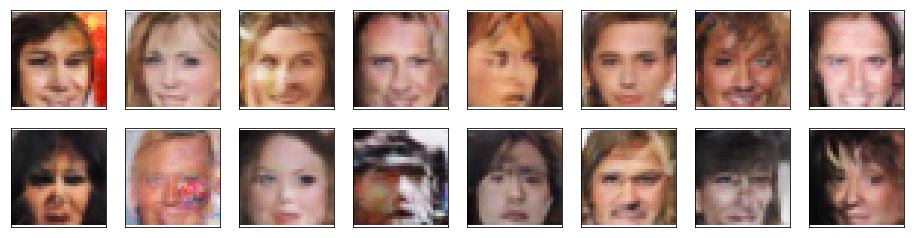

Epoch [76/2000] | Cal[0/1406] | d_loss: 0.0558 | g_loss: 6.2494
Epoch [76/2000] | Cal[50/1406] | d_loss: 0.0503 | g_loss: 4.8026
Epoch [76/2000] | Cal[100/1406] | d_loss: 0.0511 | g_loss: 5.0214
Epoch [76/2000] | Cal[150/1406] | d_loss: 0.4643 | g_loss: 6.2366
Epoch [76/2000] | Cal[200/1406] | d_loss: 0.0467 | g_loss: 3.7157
Epoch [76/2000] | Cal[250/1406] | d_loss: 0.0736 | g_loss: 6.0493
Epoch [76/2000] | Cal[300/1406] | d_loss: 0.0389 | g_loss: 4.7761
Epoch [76/2000] | Cal[350/1406] | d_loss: 0.0835 | g_loss: 4.8600
Epoch [76/2000] | Cal[400/1406] | d_loss: 0.1075 | g_loss: 2.5508
Epoch [76/2000] | Cal[450/1406] | d_loss: 0.0932 | g_loss: 4.7412
Epoch [76/2000] | Cal[500/1406] | d_loss: 0.0947 | g_loss: 4.9145
Epoch [76/2000] | Cal[550/1406] | d_loss: 1.3512 | g_loss: 0.3540
Epoch [76/2000] | Cal[600/1406] | d_loss: 0.1563 | g_loss: 5.2952
Epoch [76/2000] | Cal[650/1406] | d_loss: 0.0537 | g_loss: 5.6581
Epoch [76/2000] | Cal[700/1406] | d_loss: 0.0258 | g_loss: 6.0631
Epoch [76/200

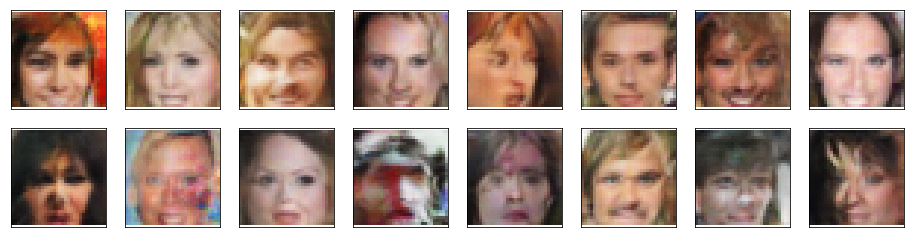

Epoch [77/2000] | Cal[0/1406] | d_loss: 0.0504 | g_loss: 4.3329
Epoch [77/2000] | Cal[50/1406] | d_loss: 0.0495 | g_loss: 4.9459
Epoch [77/2000] | Cal[100/1406] | d_loss: 0.0824 | g_loss: 5.6892
Epoch [77/2000] | Cal[150/1406] | d_loss: 0.0517 | g_loss: 6.4392
Epoch [77/2000] | Cal[200/1406] | d_loss: 1.2423 | g_loss: 1.6036
Epoch [77/2000] | Cal[250/1406] | d_loss: 0.0634 | g_loss: 5.8329
Epoch [77/2000] | Cal[300/1406] | d_loss: 0.0974 | g_loss: 5.3762
Epoch [77/2000] | Cal[350/1406] | d_loss: 0.1257 | g_loss: 4.8283
Epoch [77/2000] | Cal[400/1406] | d_loss: 0.0383 | g_loss: 5.1988
Epoch [77/2000] | Cal[450/1406] | d_loss: 0.0590 | g_loss: 7.0271
Epoch [77/2000] | Cal[500/1406] | d_loss: 0.0939 | g_loss: 3.4214
Epoch [77/2000] | Cal[550/1406] | d_loss: 0.0275 | g_loss: 6.5547
Epoch [77/2000] | Cal[600/1406] | d_loss: 0.0761 | g_loss: 5.4884
Epoch [77/2000] | Cal[650/1406] | d_loss: 0.0512 | g_loss: 6.5326
Epoch [77/2000] | Cal[700/1406] | d_loss: 0.0350 | g_loss: 5.0889
Epoch [77/200

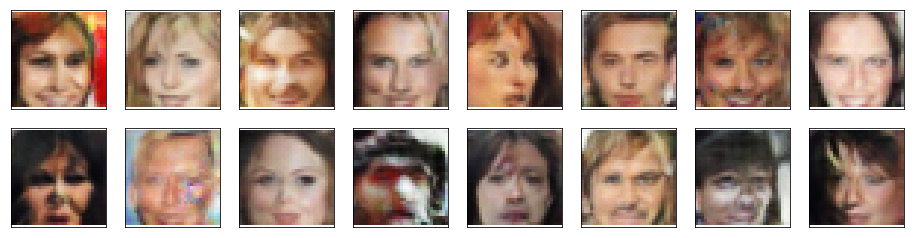

Epoch [78/2000] | Cal[0/1406] | d_loss: 0.0397 | g_loss: 4.7562
Epoch [78/2000] | Cal[50/1406] | d_loss: 0.0621 | g_loss: 8.6427
Epoch [78/2000] | Cal[100/1406] | d_loss: 0.0213 | g_loss: 5.0823
Epoch [78/2000] | Cal[150/1406] | d_loss: 0.1087 | g_loss: 7.0810
Epoch [78/2000] | Cal[200/1406] | d_loss: 1.7806 | g_loss: 11.7104
Epoch [78/2000] | Cal[250/1406] | d_loss: 0.1212 | g_loss: 5.0722
Epoch [78/2000] | Cal[300/1406] | d_loss: 0.0637 | g_loss: 6.4623
Epoch [78/2000] | Cal[350/1406] | d_loss: 0.0612 | g_loss: 6.4720
Epoch [78/2000] | Cal[400/1406] | d_loss: 0.0289 | g_loss: 6.0984
Epoch [78/2000] | Cal[450/1406] | d_loss: 0.0109 | g_loss: 6.0463
Epoch [78/2000] | Cal[500/1406] | d_loss: 0.2035 | g_loss: 6.8682
Epoch [78/2000] | Cal[550/1406] | d_loss: 0.1057 | g_loss: 4.1376
Epoch [78/2000] | Cal[600/1406] | d_loss: 0.1161 | g_loss: 5.4688
Epoch [78/2000] | Cal[650/1406] | d_loss: 0.0389 | g_loss: 4.3668
Epoch [78/2000] | Cal[700/1406] | d_loss: 0.1170 | g_loss: 4.1352
Epoch [78/20

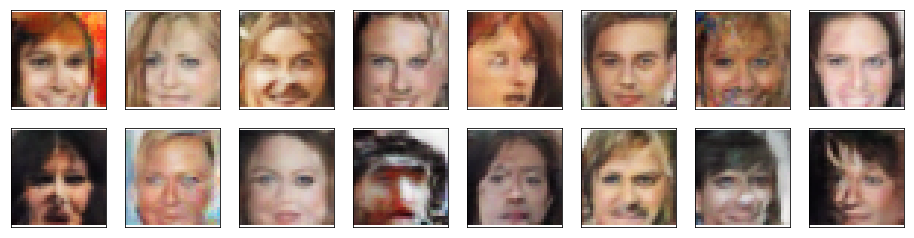

Epoch [79/2000] | Cal[0/1406] | d_loss: 6.6623 | g_loss: 6.9000
Epoch [79/2000] | Cal[50/1406] | d_loss: 0.0673 | g_loss: 6.5592
Epoch [79/2000] | Cal[100/1406] | d_loss: 0.0667 | g_loss: 5.6063
Epoch [79/2000] | Cal[150/1406] | d_loss: 0.0505 | g_loss: 5.5604
Epoch [79/2000] | Cal[200/1406] | d_loss: 0.1162 | g_loss: 3.5561
Epoch [79/2000] | Cal[250/1406] | d_loss: 0.0103 | g_loss: 7.6843
Epoch [79/2000] | Cal[300/1406] | d_loss: 0.0254 | g_loss: 6.7131
Epoch [79/2000] | Cal[350/1406] | d_loss: 0.1802 | g_loss: 4.4447
Epoch [79/2000] | Cal[400/1406] | d_loss: 0.0777 | g_loss: 5.2883
Epoch [79/2000] | Cal[450/1406] | d_loss: 0.0297 | g_loss: 6.5429
Epoch [79/2000] | Cal[500/1406] | d_loss: 0.0697 | g_loss: 5.5027
Epoch [79/2000] | Cal[550/1406] | d_loss: 0.2620 | g_loss: 4.0536
Epoch [79/2000] | Cal[600/1406] | d_loss: 0.0314 | g_loss: 4.2968
Epoch [79/2000] | Cal[650/1406] | d_loss: 0.0159 | g_loss: 6.4032
Epoch [79/2000] | Cal[700/1406] | d_loss: 0.0517 | g_loss: 5.8006
Epoch [79/200

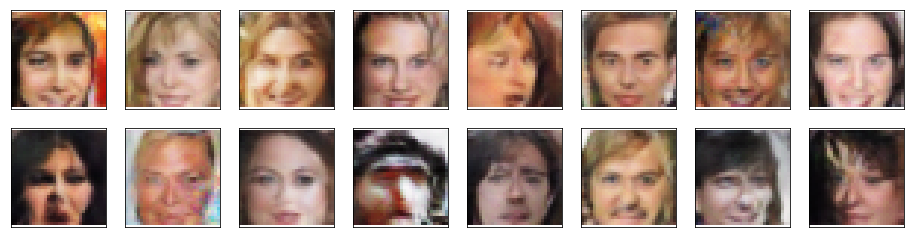

Epoch [80/2000] | Cal[0/1406] | d_loss: 0.4418 | g_loss: 8.1482
Epoch [80/2000] | Cal[50/1406] | d_loss: 0.0463 | g_loss: 6.0196
Epoch [80/2000] | Cal[100/1406] | d_loss: 0.0708 | g_loss: 5.8744
Epoch [80/2000] | Cal[150/1406] | d_loss: 0.0943 | g_loss: 6.6751
Epoch [80/2000] | Cal[200/1406] | d_loss: 0.1046 | g_loss: 8.2969
Epoch [80/2000] | Cal[250/1406] | d_loss: 0.0333 | g_loss: 6.0815
Epoch [80/2000] | Cal[300/1406] | d_loss: 0.0530 | g_loss: 7.1545
Epoch [80/2000] | Cal[350/1406] | d_loss: 0.0357 | g_loss: 4.5007
Epoch [80/2000] | Cal[400/1406] | d_loss: 0.0308 | g_loss: 6.2488
Epoch [80/2000] | Cal[450/1406] | d_loss: 0.1220 | g_loss: 5.1196
Epoch [80/2000] | Cal[500/1406] | d_loss: 0.0217 | g_loss: 7.3272
Epoch [80/2000] | Cal[550/1406] | d_loss: 0.1513 | g_loss: 4.4698
Epoch [80/2000] | Cal[600/1406] | d_loss: 0.0131 | g_loss: 6.0000
Epoch [80/2000] | Cal[650/1406] | d_loss: 0.0907 | g_loss: 4.2292
Epoch [80/2000] | Cal[700/1406] | d_loss: 0.8094 | g_loss: 14.9168
Epoch [80/20

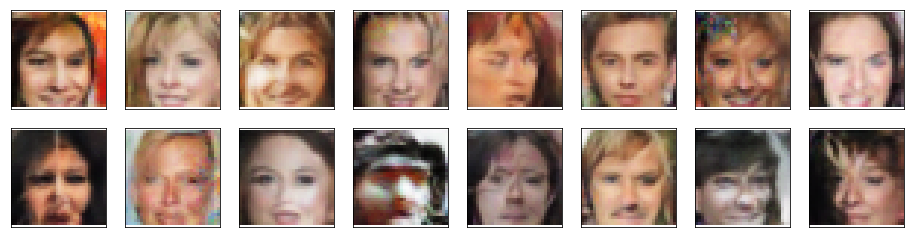

Epoch [81/2000] | Cal[0/1406] | d_loss: 5.8344 | g_loss: 14.5738
Epoch [81/2000] | Cal[50/1406] | d_loss: 0.0667 | g_loss: 4.1553
Epoch [81/2000] | Cal[100/1406] | d_loss: 0.0212 | g_loss: 5.7055
Epoch [81/2000] | Cal[150/1406] | d_loss: 0.0662 | g_loss: 5.0506
Epoch [81/2000] | Cal[200/1406] | d_loss: 0.0339 | g_loss: 7.2022
Epoch [81/2000] | Cal[250/1406] | d_loss: 0.0595 | g_loss: 5.1565
Epoch [81/2000] | Cal[300/1406] | d_loss: 0.0186 | g_loss: 5.5936
Epoch [81/2000] | Cal[350/1406] | d_loss: 0.1063 | g_loss: 3.5802
Epoch [81/2000] | Cal[400/1406] | d_loss: 0.0256 | g_loss: 6.3913
Epoch [81/2000] | Cal[450/1406] | d_loss: 0.0337 | g_loss: 5.9968
Epoch [81/2000] | Cal[500/1406] | d_loss: 0.0226 | g_loss: 5.0089
Epoch [81/2000] | Cal[550/1406] | d_loss: 0.1912 | g_loss: 4.5202
Epoch [81/2000] | Cal[600/1406] | d_loss: 0.0302 | g_loss: 5.5363
Epoch [81/2000] | Cal[650/1406] | d_loss: 0.0375 | g_loss: 6.7917
Epoch [81/2000] | Cal[700/1406] | d_loss: 0.0729 | g_loss: 5.1569
Epoch [81/20

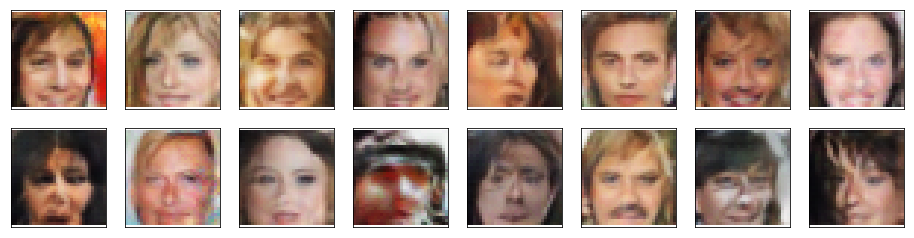

Epoch [82/2000] | Cal[0/1406] | d_loss: 0.3382 | g_loss: 8.6513
Epoch [82/2000] | Cal[50/1406] | d_loss: 0.0974 | g_loss: 4.0529
Epoch [82/2000] | Cal[100/1406] | d_loss: 0.1033 | g_loss: 3.7013
Epoch [82/2000] | Cal[150/1406] | d_loss: 0.0996 | g_loss: 4.6092
Epoch [82/2000] | Cal[200/1406] | d_loss: 0.0498 | g_loss: 5.3793
Epoch [82/2000] | Cal[250/1406] | d_loss: 0.0343 | g_loss: 5.8984
Epoch [82/2000] | Cal[300/1406] | d_loss: 1.2265 | g_loss: 14.5793
Epoch [82/2000] | Cal[350/1406] | d_loss: 0.5486 | g_loss: 7.6581
Epoch [82/2000] | Cal[400/1406] | d_loss: 0.0431 | g_loss: 6.8107
Epoch [82/2000] | Cal[450/1406] | d_loss: 0.0413 | g_loss: 7.9424
Epoch [82/2000] | Cal[500/1406] | d_loss: 0.0434 | g_loss: 5.1856
Epoch [82/2000] | Cal[550/1406] | d_loss: 0.0382 | g_loss: 5.5741
Epoch [82/2000] | Cal[600/1406] | d_loss: 0.0603 | g_loss: 5.4942
Epoch [82/2000] | Cal[650/1406] | d_loss: 0.0809 | g_loss: 6.2368
Epoch [82/2000] | Cal[700/1406] | d_loss: 0.0304 | g_loss: 5.9620
Epoch [82/20

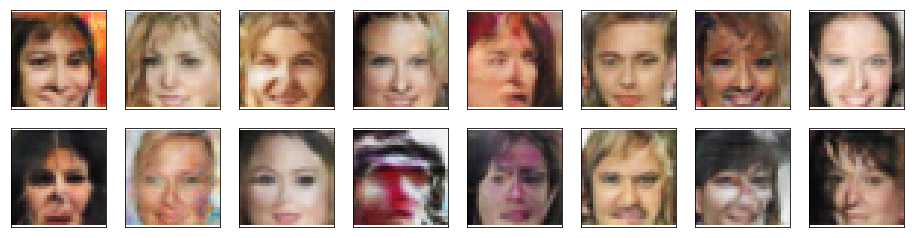

Epoch [83/2000] | Cal[0/1406] | d_loss: 0.0415 | g_loss: 5.2344
Epoch [83/2000] | Cal[50/1406] | d_loss: 0.4500 | g_loss: 4.0104
Epoch [83/2000] | Cal[100/1406] | d_loss: 0.1734 | g_loss: 7.4557
Epoch [83/2000] | Cal[150/1406] | d_loss: 0.0484 | g_loss: 4.9881
Epoch [83/2000] | Cal[200/1406] | d_loss: 0.0485 | g_loss: 5.8819
Epoch [83/2000] | Cal[250/1406] | d_loss: 0.1020 | g_loss: 3.8255
Epoch [83/2000] | Cal[300/1406] | d_loss: 0.0592 | g_loss: 4.4968
Epoch [83/2000] | Cal[350/1406] | d_loss: 0.0526 | g_loss: 5.5442
Epoch [83/2000] | Cal[400/1406] | d_loss: 0.0455 | g_loss: 5.8604
Epoch [83/2000] | Cal[450/1406] | d_loss: 0.1249 | g_loss: 3.6181
Epoch [83/2000] | Cal[500/1406] | d_loss: 0.0539 | g_loss: 5.0517
Epoch [83/2000] | Cal[550/1406] | d_loss: 0.2303 | g_loss: 3.7876
Epoch [83/2000] | Cal[600/1406] | d_loss: 0.2613 | g_loss: 2.9933
Epoch [83/2000] | Cal[650/1406] | d_loss: 0.0200 | g_loss: 6.9061
Epoch [83/2000] | Cal[700/1406] | d_loss: 0.1181 | g_loss: 7.9534
Epoch [83/200

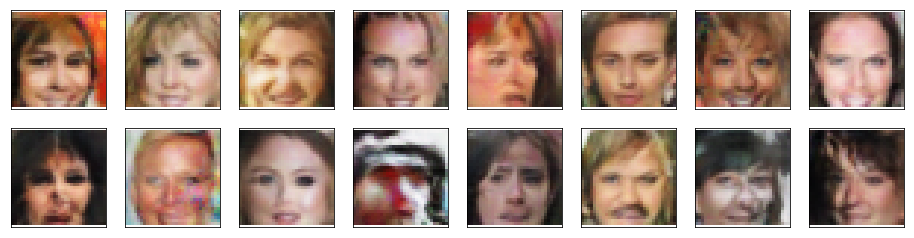

Epoch [84/2000] | Cal[0/1406] | d_loss: 0.0522 | g_loss: 6.3137
Epoch [84/2000] | Cal[50/1406] | d_loss: 0.1158 | g_loss: 6.9470
Epoch [84/2000] | Cal[100/1406] | d_loss: 0.0908 | g_loss: 4.3331
Epoch [84/2000] | Cal[150/1406] | d_loss: 0.0593 | g_loss: 4.5638
Epoch [84/2000] | Cal[200/1406] | d_loss: 0.0959 | g_loss: 4.3614
Epoch [84/2000] | Cal[250/1406] | d_loss: 0.0516 | g_loss: 5.3876
Epoch [84/2000] | Cal[300/1406] | d_loss: 0.0279 | g_loss: 4.6874
Epoch [84/2000] | Cal[350/1406] | d_loss: 0.0741 | g_loss: 6.1316
Epoch [84/2000] | Cal[400/1406] | d_loss: 0.3703 | g_loss: 1.8504
Epoch [84/2000] | Cal[450/1406] | d_loss: 0.0430 | g_loss: 7.5539
Epoch [84/2000] | Cal[500/1406] | d_loss: 0.0290 | g_loss: 4.1902
Epoch [84/2000] | Cal[550/1406] | d_loss: 0.0516 | g_loss: 5.9292
Epoch [84/2000] | Cal[600/1406] | d_loss: 0.0428 | g_loss: 5.6465
Epoch [84/2000] | Cal[650/1406] | d_loss: 0.0586 | g_loss: 7.1380
Epoch [84/2000] | Cal[700/1406] | d_loss: 0.0231 | g_loss: 5.8917
Epoch [84/200

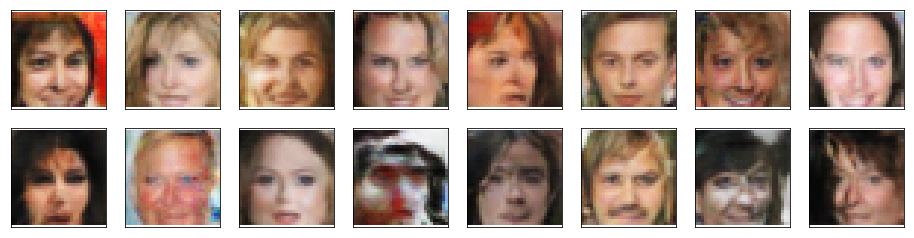

Epoch [85/2000] | Cal[0/1406] | d_loss: 0.9711 | g_loss: 5.5977
Epoch [85/2000] | Cal[50/1406] | d_loss: 0.0513 | g_loss: 5.1181
Epoch [85/2000] | Cal[100/1406] | d_loss: 0.0699 | g_loss: 5.8957
Epoch [85/2000] | Cal[150/1406] | d_loss: 0.0766 | g_loss: 5.8331
Epoch [85/2000] | Cal[200/1406] | d_loss: 0.0590 | g_loss: 6.5058
Epoch [85/2000] | Cal[250/1406] | d_loss: 0.0416 | g_loss: 4.8856
Epoch [85/2000] | Cal[300/1406] | d_loss: 4.9825 | g_loss: 8.5695
Epoch [85/2000] | Cal[350/1406] | d_loss: 0.0301 | g_loss: 4.9112
Epoch [85/2000] | Cal[400/1406] | d_loss: 0.0455 | g_loss: 5.8829
Epoch [85/2000] | Cal[450/1406] | d_loss: 0.0402 | g_loss: 6.9514
Epoch [85/2000] | Cal[500/1406] | d_loss: 0.0289 | g_loss: 6.4517
Epoch [85/2000] | Cal[550/1406] | d_loss: 0.0539 | g_loss: 6.3834
Epoch [85/2000] | Cal[600/1406] | d_loss: 0.1489 | g_loss: 6.3606
Epoch [85/2000] | Cal[650/1406] | d_loss: 0.0737 | g_loss: 5.7618
Epoch [85/2000] | Cal[700/1406] | d_loss: 0.0540 | g_loss: 6.5688
Epoch [85/200

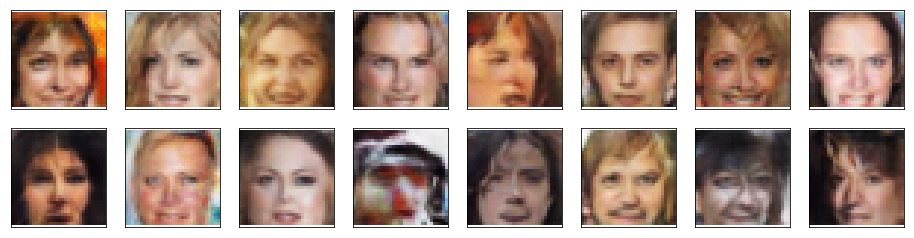

Epoch [86/2000] | Cal[0/1406] | d_loss: 0.0360 | g_loss: 6.6328
Epoch [86/2000] | Cal[50/1406] | d_loss: 0.0236 | g_loss: 8.1043
Epoch [86/2000] | Cal[100/1406] | d_loss: 0.0420 | g_loss: 6.4514
Epoch [86/2000] | Cal[150/1406] | d_loss: 0.1268 | g_loss: 4.6288
Epoch [86/2000] | Cal[200/1406] | d_loss: 0.0809 | g_loss: 5.1322
Epoch [86/2000] | Cal[250/1406] | d_loss: 0.0153 | g_loss: 5.2054
Epoch [86/2000] | Cal[300/1406] | d_loss: 0.0197 | g_loss: 6.4711
Epoch [86/2000] | Cal[350/1406] | d_loss: 0.0635 | g_loss: 6.3905
Epoch [86/2000] | Cal[400/1406] | d_loss: 0.1084 | g_loss: 5.3676
Epoch [86/2000] | Cal[450/1406] | d_loss: 0.0132 | g_loss: 5.4002
Epoch [86/2000] | Cal[500/1406] | d_loss: 0.0289 | g_loss: 6.2767
Epoch [86/2000] | Cal[550/1406] | d_loss: 0.0799 | g_loss: 5.5563
Epoch [86/2000] | Cal[600/1406] | d_loss: 0.0209 | g_loss: 5.5004
Epoch [86/2000] | Cal[650/1406] | d_loss: 0.0779 | g_loss: 5.4663
Epoch [86/2000] | Cal[700/1406] | d_loss: 0.0632 | g_loss: 5.9115
Epoch [86/200

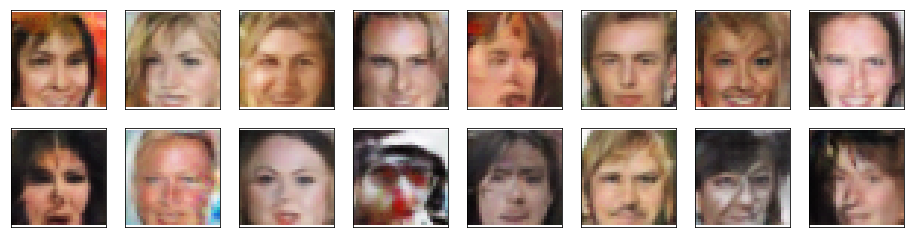

Epoch [87/2000] | Cal[0/1406] | d_loss: 0.0463 | g_loss: 6.4614
Epoch [87/2000] | Cal[50/1406] | d_loss: 0.0519 | g_loss: 6.6216
Epoch [87/2000] | Cal[100/1406] | d_loss: 0.1605 | g_loss: 5.0201
Epoch [87/2000] | Cal[150/1406] | d_loss: 0.0252 | g_loss: 5.2943
Epoch [87/2000] | Cal[200/1406] | d_loss: 0.0494 | g_loss: 6.7955
Epoch [87/2000] | Cal[250/1406] | d_loss: 0.1033 | g_loss: 6.9226
Epoch [87/2000] | Cal[300/1406] | d_loss: 0.0295 | g_loss: 7.5285
Epoch [87/2000] | Cal[350/1406] | d_loss: 0.0233 | g_loss: 5.1374
Epoch [87/2000] | Cal[400/1406] | d_loss: 0.0224 | g_loss: 5.6575
Epoch [87/2000] | Cal[450/1406] | d_loss: 0.0524 | g_loss: 5.8132
Epoch [87/2000] | Cal[500/1406] | d_loss: 0.1410 | g_loss: 7.6175
Epoch [87/2000] | Cal[550/1406] | d_loss: 0.0341 | g_loss: 6.7521
Epoch [87/2000] | Cal[600/1406] | d_loss: 0.0946 | g_loss: 5.7385
Epoch [87/2000] | Cal[650/1406] | d_loss: 0.1270 | g_loss: 4.4614
Epoch [87/2000] | Cal[700/1406] | d_loss: 0.1406 | g_loss: 7.6516
Epoch [87/200

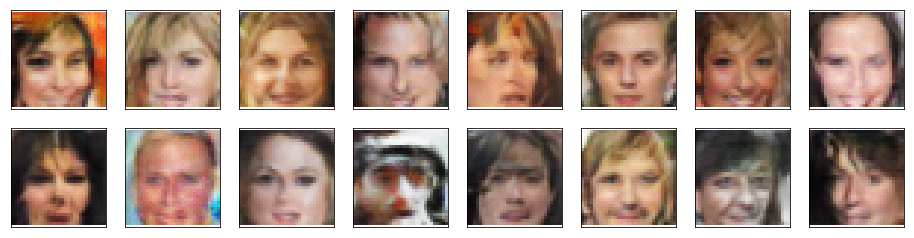

Epoch [88/2000] | Cal[0/1406] | d_loss: 0.1286 | g_loss: 5.4190
Epoch [88/2000] | Cal[50/1406] | d_loss: 0.0849 | g_loss: 5.7044
Epoch [88/2000] | Cal[100/1406] | d_loss: 0.0343 | g_loss: 5.5370
Epoch [88/2000] | Cal[150/1406] | d_loss: 0.0301 | g_loss: 6.3660
Epoch [88/2000] | Cal[200/1406] | d_loss: 0.5043 | g_loss: 8.2556
Epoch [88/2000] | Cal[250/1406] | d_loss: 0.0738 | g_loss: 7.0783
Epoch [88/2000] | Cal[300/1406] | d_loss: 0.0552 | g_loss: 6.5119
Epoch [88/2000] | Cal[350/1406] | d_loss: 0.0496 | g_loss: 7.1988
Epoch [88/2000] | Cal[400/1406] | d_loss: 0.0231 | g_loss: 6.4574
Epoch [88/2000] | Cal[450/1406] | d_loss: 0.0404 | g_loss: 6.6736
Epoch [88/2000] | Cal[500/1406] | d_loss: 0.0412 | g_loss: 5.8232
Epoch [88/2000] | Cal[550/1406] | d_loss: 0.1206 | g_loss: 6.4880
Epoch [88/2000] | Cal[600/1406] | d_loss: 0.0305 | g_loss: 4.6519
Epoch [88/2000] | Cal[650/1406] | d_loss: 0.1236 | g_loss: 6.4860
Epoch [88/2000] | Cal[700/1406] | d_loss: 1.5225 | g_loss: 6.6987
Epoch [88/200

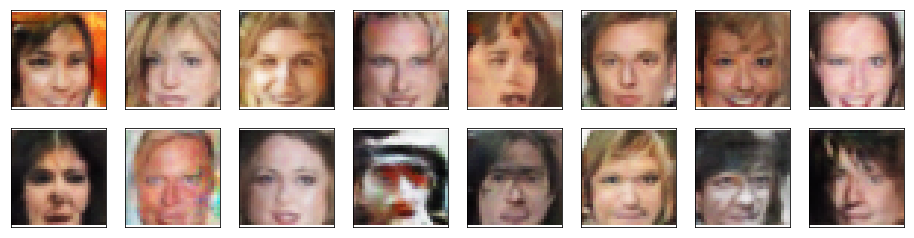

Epoch [89/2000] | Cal[0/1406] | d_loss: 0.1557 | g_loss: 4.8261
Epoch [89/2000] | Cal[50/1406] | d_loss: 0.0549 | g_loss: 4.5324
Epoch [89/2000] | Cal[100/1406] | d_loss: 0.0126 | g_loss: 5.8151
Epoch [89/2000] | Cal[150/1406] | d_loss: 0.0308 | g_loss: 6.1934
Epoch [89/2000] | Cal[200/1406] | d_loss: 0.0186 | g_loss: 6.4737
Epoch [89/2000] | Cal[250/1406] | d_loss: 0.0312 | g_loss: 5.4968
Epoch [89/2000] | Cal[300/1406] | d_loss: 0.0292 | g_loss: 7.6595
Epoch [89/2000] | Cal[350/1406] | d_loss: 0.0992 | g_loss: 6.0799
Epoch [89/2000] | Cal[400/1406] | d_loss: 0.1044 | g_loss: 3.8136
Epoch [89/2000] | Cal[450/1406] | d_loss: 0.0489 | g_loss: 5.6609
Epoch [89/2000] | Cal[500/1406] | d_loss: 0.0361 | g_loss: 5.5289
Epoch [89/2000] | Cal[550/1406] | d_loss: 0.0869 | g_loss: 5.2257
Epoch [89/2000] | Cal[600/1406] | d_loss: 0.0428 | g_loss: 7.5533
Epoch [89/2000] | Cal[650/1406] | d_loss: 0.1482 | g_loss: 6.1148
Epoch [89/2000] | Cal[700/1406] | d_loss: 0.0351 | g_loss: 6.5857
Epoch [89/200

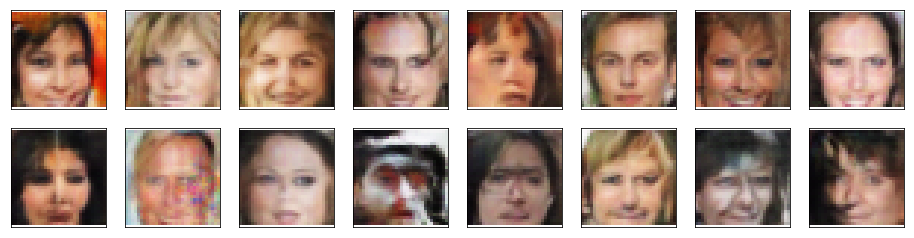

Epoch [90/2000] | Cal[0/1406] | d_loss: 0.0307 | g_loss: 5.0143
Epoch [90/2000] | Cal[50/1406] | d_loss: 0.0221 | g_loss: 6.5110
Epoch [90/2000] | Cal[100/1406] | d_loss: 0.2144 | g_loss: 5.5514
Epoch [90/2000] | Cal[150/1406] | d_loss: 0.0410 | g_loss: 5.8114
Epoch [90/2000] | Cal[200/1406] | d_loss: 0.0270 | g_loss: 5.9295
Epoch [90/2000] | Cal[250/1406] | d_loss: 0.0878 | g_loss: 6.3187
Epoch [90/2000] | Cal[300/1406] | d_loss: 0.0466 | g_loss: 5.3738
Epoch [90/2000] | Cal[350/1406] | d_loss: 0.2538 | g_loss: 4.2311
Epoch [90/2000] | Cal[400/1406] | d_loss: 0.0696 | g_loss: 5.2794
Epoch [90/2000] | Cal[450/1406] | d_loss: 0.0304 | g_loss: 5.8179
Epoch [90/2000] | Cal[500/1406] | d_loss: 0.4752 | g_loss: 10.0589
Epoch [90/2000] | Cal[550/1406] | d_loss: 0.1566 | g_loss: 5.5141
Epoch [90/2000] | Cal[600/1406] | d_loss: 0.0401 | g_loss: 5.9649
Epoch [90/2000] | Cal[650/1406] | d_loss: 0.5487 | g_loss: 2.6493
Epoch [90/2000] | Cal[700/1406] | d_loss: 0.0207 | g_loss: 6.9731
Epoch [90/20

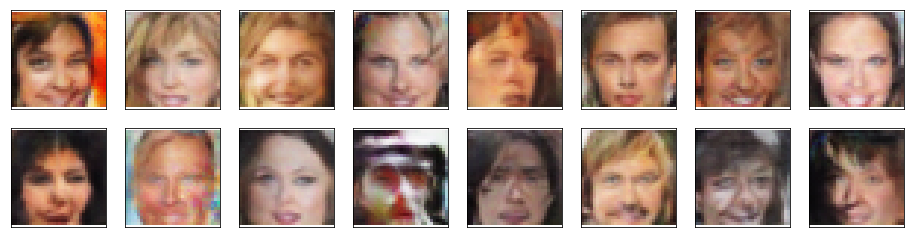

Epoch [91/2000] | Cal[0/1406] | d_loss: 0.5644 | g_loss: 7.7442
Epoch [91/2000] | Cal[50/1406] | d_loss: 0.0262 | g_loss: 5.5384
Epoch [91/2000] | Cal[100/1406] | d_loss: 0.0438 | g_loss: 6.4716
Epoch [91/2000] | Cal[150/1406] | d_loss: 0.0639 | g_loss: 6.9144
Epoch [91/2000] | Cal[200/1406] | d_loss: 0.1248 | g_loss: 5.2696
Epoch [91/2000] | Cal[250/1406] | d_loss: 0.0665 | g_loss: 3.4359
Epoch [91/2000] | Cal[300/1406] | d_loss: 0.0331 | g_loss: 6.6363
Epoch [91/2000] | Cal[350/1406] | d_loss: 0.0248 | g_loss: 7.4633
Epoch [91/2000] | Cal[400/1406] | d_loss: 0.0356 | g_loss: 6.7820
Epoch [91/2000] | Cal[450/1406] | d_loss: 0.0295 | g_loss: 7.1423
Epoch [91/2000] | Cal[500/1406] | d_loss: 0.0384 | g_loss: 6.7469
Epoch [91/2000] | Cal[550/1406] | d_loss: 0.0245 | g_loss: 6.7927
Epoch [91/2000] | Cal[600/1406] | d_loss: 0.0358 | g_loss: 6.0327
Epoch [91/2000] | Cal[650/1406] | d_loss: 0.0215 | g_loss: 6.9342
Epoch [91/2000] | Cal[700/1406] | d_loss: 0.0285 | g_loss: 6.7464
Epoch [91/200

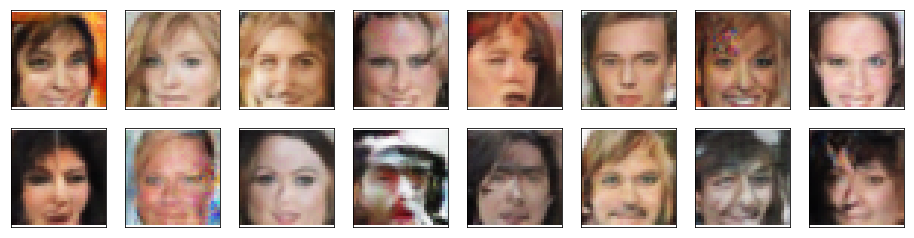

Epoch [92/2000] | Cal[0/1406] | d_loss: 0.0912 | g_loss: 5.3391
Epoch [92/2000] | Cal[50/1406] | d_loss: 0.0064 | g_loss: 6.9097
Epoch [92/2000] | Cal[100/1406] | d_loss: 0.0659 | g_loss: 5.5321
Epoch [92/2000] | Cal[150/1406] | d_loss: 0.0315 | g_loss: 6.4818
Epoch [92/2000] | Cal[200/1406] | d_loss: 0.0181 | g_loss: 5.2564
Epoch [92/2000] | Cal[250/1406] | d_loss: 0.3746 | g_loss: 0.7588
Epoch [92/2000] | Cal[300/1406] | d_loss: 0.0790 | g_loss: 4.9526
Epoch [92/2000] | Cal[350/1406] | d_loss: 0.0454 | g_loss: 6.1147
Epoch [92/2000] | Cal[400/1406] | d_loss: 0.0365 | g_loss: 6.9275
Epoch [92/2000] | Cal[450/1406] | d_loss: 0.0412 | g_loss: 8.1862
Epoch [92/2000] | Cal[500/1406] | d_loss: 0.1715 | g_loss: 5.6484
Epoch [92/2000] | Cal[550/1406] | d_loss: 0.1118 | g_loss: 8.9133
Epoch [92/2000] | Cal[600/1406] | d_loss: 0.0581 | g_loss: 5.8188
Epoch [92/2000] | Cal[650/1406] | d_loss: 0.1069 | g_loss: 4.4641
Epoch [92/2000] | Cal[700/1406] | d_loss: 0.0378 | g_loss: 7.8523
Epoch [92/200

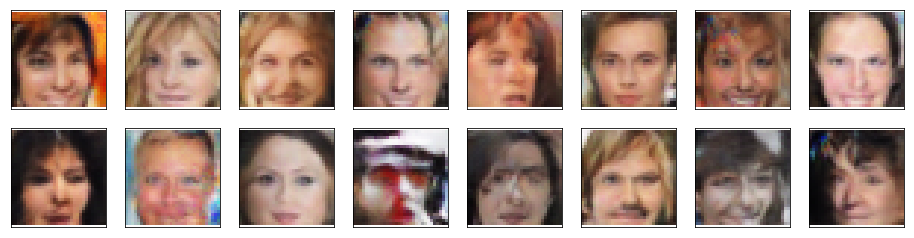

Epoch [93/2000] | Cal[0/1406] | d_loss: 0.3490 | g_loss: 8.0243
Epoch [93/2000] | Cal[50/1406] | d_loss: 0.0119 | g_loss: 6.3137
Epoch [93/2000] | Cal[100/1406] | d_loss: 0.2727 | g_loss: 4.1685
Epoch [93/2000] | Cal[150/1406] | d_loss: 0.0289 | g_loss: 5.6064
Epoch [93/2000] | Cal[200/1406] | d_loss: 0.0353 | g_loss: 6.6863
Epoch [93/2000] | Cal[250/1406] | d_loss: 0.2740 | g_loss: 5.4886
Epoch [93/2000] | Cal[300/1406] | d_loss: 0.0465 | g_loss: 5.5221
Epoch [93/2000] | Cal[350/1406] | d_loss: 0.0819 | g_loss: 6.7018
Epoch [93/2000] | Cal[400/1406] | d_loss: 0.2603 | g_loss: 3.2871
Epoch [93/2000] | Cal[450/1406] | d_loss: 0.0919 | g_loss: 5.3242
Epoch [93/2000] | Cal[500/1406] | d_loss: 0.0237 | g_loss: 6.0194
Epoch [93/2000] | Cal[550/1406] | d_loss: 0.1684 | g_loss: 6.5264
Epoch [93/2000] | Cal[600/1406] | d_loss: 0.0633 | g_loss: 5.2121
Epoch [93/2000] | Cal[650/1406] | d_loss: 0.0233 | g_loss: 6.6878
Epoch [93/2000] | Cal[700/1406] | d_loss: 0.0236 | g_loss: 7.1516
Epoch [93/200

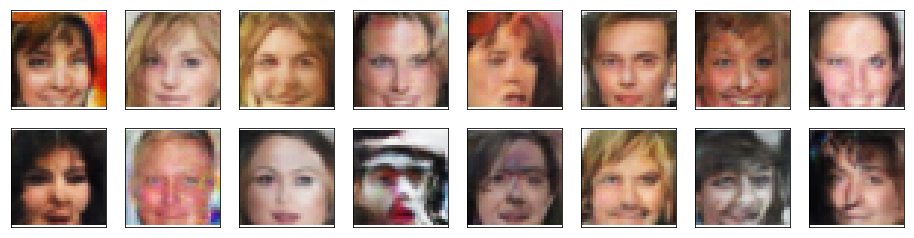

Epoch [94/2000] | Cal[0/1406] | d_loss: 0.0394 | g_loss: 6.7262
Epoch [94/2000] | Cal[50/1406] | d_loss: 0.0867 | g_loss: 6.9414
Epoch [94/2000] | Cal[100/1406] | d_loss: 0.0509 | g_loss: 6.2722
Epoch [94/2000] | Cal[150/1406] | d_loss: 0.0296 | g_loss: 6.6186
Epoch [94/2000] | Cal[200/1406] | d_loss: 0.0178 | g_loss: 6.4990
Epoch [94/2000] | Cal[250/1406] | d_loss: 0.0601 | g_loss: 4.6272
Epoch [94/2000] | Cal[300/1406] | d_loss: 0.0161 | g_loss: 4.4385
Epoch [94/2000] | Cal[350/1406] | d_loss: 0.0748 | g_loss: 6.1279
Epoch [94/2000] | Cal[400/1406] | d_loss: 0.0246 | g_loss: 6.2953
Epoch [94/2000] | Cal[450/1406] | d_loss: 0.0253 | g_loss: 7.6654
Epoch [94/2000] | Cal[500/1406] | d_loss: 0.3973 | g_loss: 3.1524
Epoch [94/2000] | Cal[550/1406] | d_loss: 0.0527 | g_loss: 4.7530
Epoch [94/2000] | Cal[600/1406] | d_loss: 0.1003 | g_loss: 4.5576
Epoch [94/2000] | Cal[650/1406] | d_loss: 3.6312 | g_loss: 2.4067
Epoch [94/2000] | Cal[700/1406] | d_loss: 0.0301 | g_loss: 6.1339
Epoch [94/200

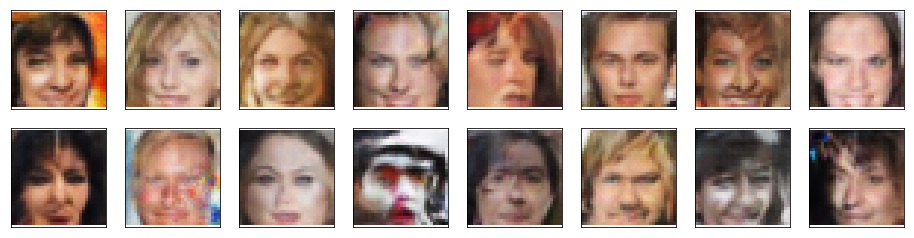

Epoch [95/2000] | Cal[0/1406] | d_loss: 0.4264 | g_loss: 6.0160
Epoch [95/2000] | Cal[50/1406] | d_loss: 0.0539 | g_loss: 5.6514
Epoch [95/2000] | Cal[100/1406] | d_loss: 0.0241 | g_loss: 5.3952
Epoch [95/2000] | Cal[150/1406] | d_loss: 0.0381 | g_loss: 7.0425
Epoch [95/2000] | Cal[200/1406] | d_loss: 0.0776 | g_loss: 6.0557
Epoch [95/2000] | Cal[250/1406] | d_loss: 0.0378 | g_loss: 7.9432
Epoch [95/2000] | Cal[300/1406] | d_loss: 0.0590 | g_loss: 4.4730
Epoch [95/2000] | Cal[350/1406] | d_loss: 0.0407 | g_loss: 5.4100
Epoch [95/2000] | Cal[400/1406] | d_loss: 0.0465 | g_loss: 6.8802
Epoch [95/2000] | Cal[450/1406] | d_loss: 0.0233 | g_loss: 5.7166
Epoch [95/2000] | Cal[500/1406] | d_loss: 0.0586 | g_loss: 5.4059
Epoch [95/2000] | Cal[550/1406] | d_loss: 0.0524 | g_loss: 5.3440
Epoch [95/2000] | Cal[600/1406] | d_loss: 0.0863 | g_loss: 5.5052
Epoch [95/2000] | Cal[650/1406] | d_loss: 0.0468 | g_loss: 4.5528
Epoch [95/2000] | Cal[700/1406] | d_loss: 0.0392 | g_loss: 7.9443
Epoch [95/200

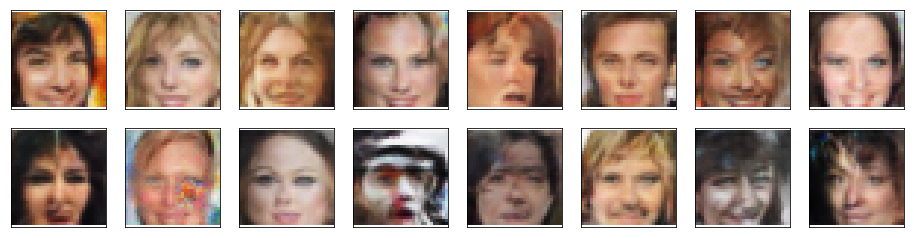

Epoch [96/2000] | Cal[0/1406] | d_loss: 0.0802 | g_loss: 8.9176
Epoch [96/2000] | Cal[50/1406] | d_loss: 0.0678 | g_loss: 6.7097
Epoch [96/2000] | Cal[100/1406] | d_loss: 0.0454 | g_loss: 4.6729
Epoch [96/2000] | Cal[150/1406] | d_loss: 0.0215 | g_loss: 6.7306
Epoch [96/2000] | Cal[200/1406] | d_loss: 0.0583 | g_loss: 6.0537
Epoch [96/2000] | Cal[250/1406] | d_loss: 0.0275 | g_loss: 5.3228
Epoch [96/2000] | Cal[300/1406] | d_loss: 0.2867 | g_loss: 9.0809
Epoch [96/2000] | Cal[350/1406] | d_loss: 0.0170 | g_loss: 5.8388
Epoch [96/2000] | Cal[400/1406] | d_loss: 0.0264 | g_loss: 6.6235
Epoch [96/2000] | Cal[450/1406] | d_loss: 0.0598 | g_loss: 5.7605
Epoch [96/2000] | Cal[500/1406] | d_loss: 0.0086 | g_loss: 6.1511
Epoch [96/2000] | Cal[550/1406] | d_loss: 0.0532 | g_loss: 5.7823
Epoch [96/2000] | Cal[600/1406] | d_loss: 0.0285 | g_loss: 5.0426
Epoch [96/2000] | Cal[650/1406] | d_loss: 0.0165 | g_loss: 6.5851
Epoch [96/2000] | Cal[700/1406] | d_loss: 0.0086 | g_loss: 5.0785
Epoch [96/200

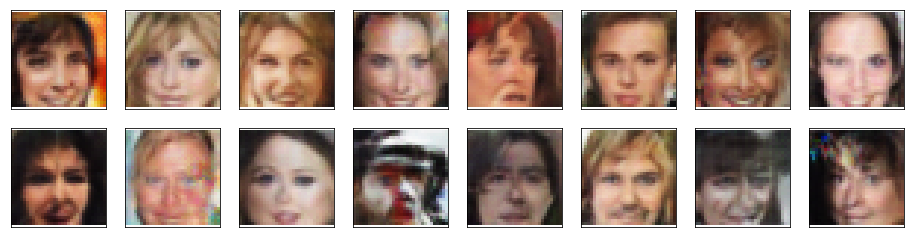

Epoch [97/2000] | Cal[0/1406] | d_loss: 0.1960 | g_loss: 4.8361
Epoch [97/2000] | Cal[50/1406] | d_loss: 0.0496 | g_loss: 4.0294
Epoch [97/2000] | Cal[100/1406] | d_loss: 0.0709 | g_loss: 3.6554
Epoch [97/2000] | Cal[150/1406] | d_loss: 0.0229 | g_loss: 4.6332
Epoch [97/2000] | Cal[200/1406] | d_loss: 0.0280 | g_loss: 5.0173
Epoch [97/2000] | Cal[250/1406] | d_loss: 1.4385 | g_loss: 0.8611
Epoch [97/2000] | Cal[300/1406] | d_loss: 0.1304 | g_loss: 4.0303
Epoch [97/2000] | Cal[350/1406] | d_loss: 0.0489 | g_loss: 6.1985
Epoch [97/2000] | Cal[400/1406] | d_loss: 0.0328 | g_loss: 5.1185
Epoch [97/2000] | Cal[450/1406] | d_loss: 0.0155 | g_loss: 8.0684
Epoch [97/2000] | Cal[500/1406] | d_loss: 0.0576 | g_loss: 5.2813
Epoch [97/2000] | Cal[550/1406] | d_loss: 0.0577 | g_loss: 4.4155
Epoch [97/2000] | Cal[600/1406] | d_loss: 0.1275 | g_loss: 4.1311
Epoch [97/2000] | Cal[650/1406] | d_loss: 0.0574 | g_loss: 6.3185
Epoch [97/2000] | Cal[700/1406] | d_loss: 0.0247 | g_loss: 6.4689
Epoch [97/200

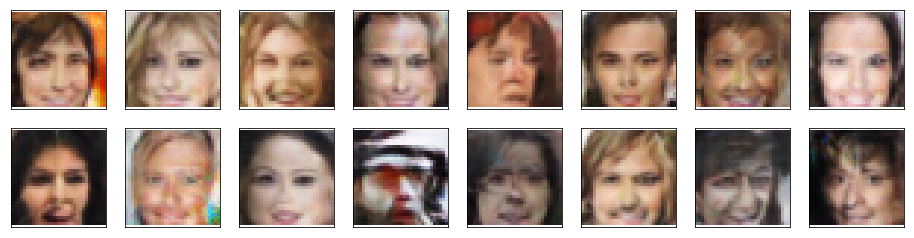

Epoch [98/2000] | Cal[0/1406] | d_loss: 0.0494 | g_loss: 6.8343
Epoch [98/2000] | Cal[50/1406] | d_loss: 0.0600 | g_loss: 5.2534
Epoch [98/2000] | Cal[100/1406] | d_loss: 0.0198 | g_loss: 6.7615
Epoch [98/2000] | Cal[150/1406] | d_loss: 0.2176 | g_loss: 4.2393
Epoch [98/2000] | Cal[200/1406] | d_loss: 0.0641 | g_loss: 6.7454
Epoch [98/2000] | Cal[250/1406] | d_loss: 0.0395 | g_loss: 6.3878
Epoch [98/2000] | Cal[300/1406] | d_loss: 0.0914 | g_loss: 7.8799
Epoch [98/2000] | Cal[350/1406] | d_loss: 0.0213 | g_loss: 5.9214
Epoch [98/2000] | Cal[400/1406] | d_loss: 0.0206 | g_loss: 7.2162
Epoch [98/2000] | Cal[450/1406] | d_loss: 0.0231 | g_loss: 7.3253
Epoch [98/2000] | Cal[500/1406] | d_loss: 0.0540 | g_loss: 5.4330
Epoch [98/2000] | Cal[550/1406] | d_loss: 0.0181 | g_loss: 6.7554
Epoch [98/2000] | Cal[600/1406] | d_loss: 0.0364 | g_loss: 6.9047
Epoch [98/2000] | Cal[650/1406] | d_loss: 0.0536 | g_loss: 5.1752
Epoch [98/2000] | Cal[700/1406] | d_loss: 0.0424 | g_loss: 4.7469
Epoch [98/200

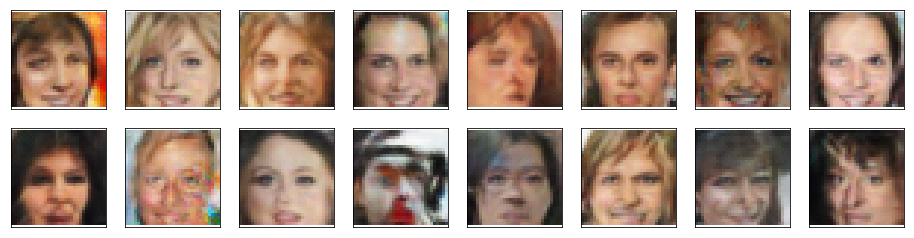

Epoch [99/2000] | Cal[0/1406] | d_loss: 0.1721 | g_loss: 8.5966
Epoch [99/2000] | Cal[50/1406] | d_loss: 0.0557 | g_loss: 5.5744
Epoch [99/2000] | Cal[100/1406] | d_loss: 0.0532 | g_loss: 6.1972
Epoch [99/2000] | Cal[150/1406] | d_loss: 0.0217 | g_loss: 6.5587
Epoch [99/2000] | Cal[200/1406] | d_loss: 0.0445 | g_loss: 7.1555
Epoch [99/2000] | Cal[250/1406] | d_loss: 0.3494 | g_loss: 8.5201
Epoch [99/2000] | Cal[300/1406] | d_loss: 0.0724 | g_loss: 5.5235
Epoch [99/2000] | Cal[350/1406] | d_loss: 0.6407 | g_loss: 2.1122
Epoch [99/2000] | Cal[400/1406] | d_loss: 0.0955 | g_loss: 6.2042
Epoch [99/2000] | Cal[450/1406] | d_loss: 0.0346 | g_loss: 5.9171
Epoch [99/2000] | Cal[500/1406] | d_loss: 0.0133 | g_loss: 5.5625
Epoch [99/2000] | Cal[550/1406] | d_loss: 0.0512 | g_loss: 7.7214
Epoch [99/2000] | Cal[600/1406] | d_loss: 0.2161 | g_loss: 6.9478
Epoch [99/2000] | Cal[650/1406] | d_loss: 0.0445 | g_loss: 4.9253
Epoch [99/2000] | Cal[700/1406] | d_loss: 0.0479 | g_loss: 5.7213
Epoch [99/200

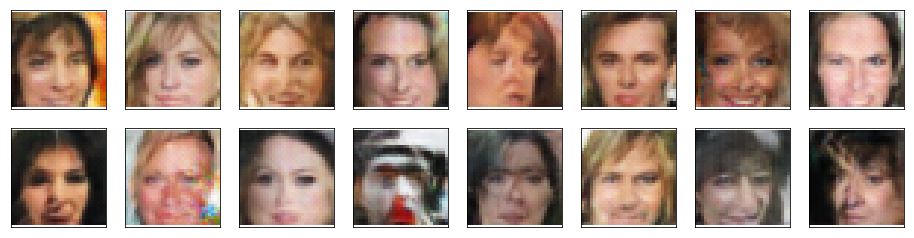

Epoch [100/2000] | Cal[0/1406] | d_loss: 0.1285 | g_loss: 5.9047
Epoch [100/2000] | Cal[50/1406] | d_loss: 0.1225 | g_loss: 5.7114
Epoch [100/2000] | Cal[100/1406] | d_loss: 0.1965 | g_loss: 4.5660
Epoch [100/2000] | Cal[150/1406] | d_loss: 0.0328 | g_loss: 7.3208


KeyboardInterrupt: 

In [52]:
# set number of epochs 
n_epochs = 2000


"""
DON'T MODIFY ANYTHING IN THIS CELL
"""
# call training function
losses = train(D, G, n_epochs=n_epochs)

## Training loss

Plot the training losses for the generator and discriminator, recorded after each epoch.

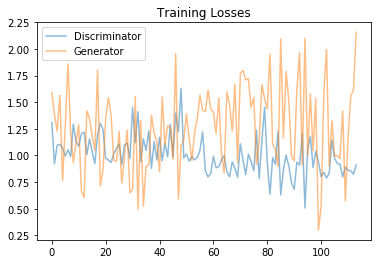

In [53]:
fig, ax = plt.subplots()
losses = np.array(losses)
plt.plot(losses.T[0], label='Discriminator', alpha=0.5)
plt.plot(losses.T[1], label='Generator', alpha=0.5)
plt.title("Training Losses")
plt.legend()

In [54]:
torch.save(G.state_dict(), 'checkpoint_G.pth')
torch.save(D.state_dict(), 'checkpoint_D.pth')

## Generator samples from training

View samples of images from the generator, and answer a question about the strengths and weaknesses of your trained models.

In [ ]:
# helper function for viewing a list of passed in sample images
def view_samples(epoch, samples):
    fig, axes = plt.subplots(figsize=(16,4), nrows=2, ncols=8, sharey=True, sharex=True)
    for ax, img in zip(axes.flatten(), samples[epoch]):
        img = img.detach().cpu().numpy()
        img = np.transpose(img, (1, 2, 0))
        img = ((img + 1)*255 / (2)).astype(np.uint8)
        ax.xaxis.set_visible(False)
        ax.yaxis.set_visible(False)
        im = ax.imshow(img.reshape((32,32,3)))

In [55]:
# Load samples from generator, taken while training
with open('train_samples.pkl', 'rb') as f:
    samples = pkl.load(f)

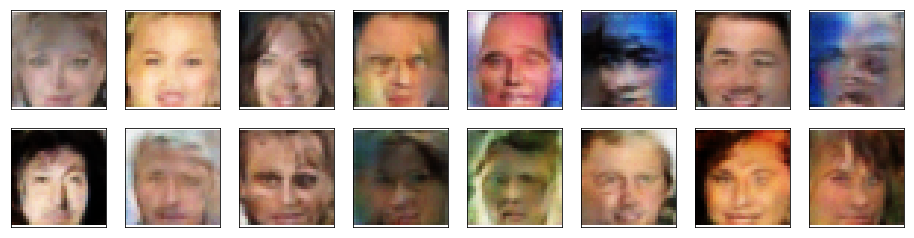

In [59]:
_ = view_samples(-1, samples)

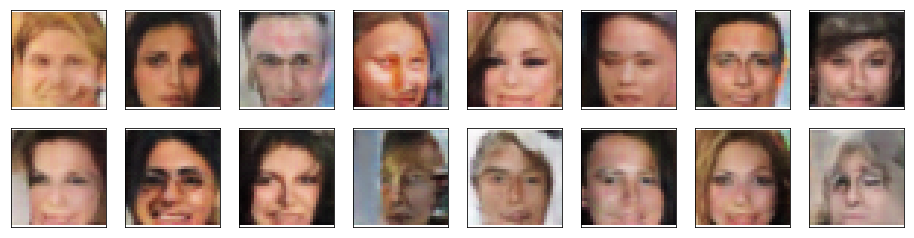

In [63]:
z = np.random.uniform(-1, 1, size=(16, z_size))
z = torch.from_numpy(z).float()
if train_on_gpu:
    z = z.cuda()
    
samples = []
s = G(z)
samples.append(s)
_ = view_samples(-1, samples)

### Question: What do you notice about your generated samples and how might you improve this model?
When you answer this question, consider the following factors:
* The dataset is biased; it is made of "celebrity" faces that are mostly white
* Model size; larger models have the opportunity to learn more features in a data feature space
* Optimization strategy; optimizers and number of epochs affect your final result


**Answer:** 
1. Sure. The dataset majorly contains white people images and thus the model only generates white fake people.
2. I had a fairly simple architecture and even then the model was able to recognise patterns of eyes, nose and mouth from the faces. It performed quite well for a simple model. Surely, having a more complex model can lead to much better precision.
3. After looking at the loss graph, it seemed to be fluctuating between a constant range. Maybe decreasing the learning rate to 0.0001 could better converge the model.I trained to model for 100 epochs and achieved quite good results for some faces. 

### Submitting This Project
When submitting this project, make sure to run all the cells before saving the notebook. Save the notebook file as "dlnd_face_generation.ipynb" and save it as a HTML file under "File" -> "Download as". Include the "problem_unittests.py" files in your submission.